In [1]:
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import datetime
%matplotlib inline

In [2]:
n_sensors=16

In [3]:
x = np.linspace(0, 1, 101)
y = np.linspace(0, 1, 101)

In [4]:
t = np.linspace(0, 1, 41)

In [5]:
xrange = np.linspace(0, 1, 101)
yrange = np.linspace(0, 1, 101)
xmesh, ymesh = np.meshgrid(xrange, yrange)

In [6]:
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

$$ f_1(x, y, t) = e^{-t}(cos2\pi xcos2\pi y + sin2\pi xsin2\pi y) $$
$$ f_2(x, y, t) = x + y + t $$
$$ f_3(x, y, t) = e^{-t}(2sin2\pi x + sin2\pi xcos2\pi y) $$

Case 1: f1

In [7]:
out1 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out1[i, j, k] = np.exp(-t[i])*(np.cos(2*np.pi*x[j])*np.cos(2*np.pi*y[k])
                                           + np.sin(2*np.pi*x[j])*np.sin(2*np.pi*y[k]))

In [8]:
out1[0, :, :]

array([[1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ],
       [0.99802673, 1.        , 0.99802673, ..., 0.98228725, 0.9921147 ,
        0.99802673],
       [0.9921147 , 0.99802673, 1.        , ..., 0.96858316, 0.98228725,
        0.9921147 ],
       ...,
       [0.9921147 , 0.98228725, 0.96858316, ..., 1.        , 0.99802673,
        0.9921147 ],
       [0.99802673, 0.9921147 , 0.98228725, ..., 0.99802673, 1.        ,
        0.99802673],
       [1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ]])

In [9]:
sensor1 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor1[i, j, k] = out1[i, 20*(j+1)+1, 20*(k+1)+1]

In [10]:
sensor1.shape

(41, 4, 4)

In [11]:
sensor1 = sensor1.reshape(41, 16, 1)

In [12]:
sensor1.shape

(41, 16, 1)

In [13]:
x_train1, x_test1, y_train1, y_test1, t_train, t_test = train_test_split(sensor1, out1, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [14]:
t_train

array([[0.725],
       [0.15 ],
       [0.65 ],
       [0.3  ],
       [0.425],
       [0.225],
       [0.375],
       [0.8  ],
       [0.4  ],
       [0.875],
       [0.85 ],
       [0.   ],
       [0.675],
       [0.125],
       [0.275],
       [0.025],
       [0.75 ],
       [0.525],
       [0.05 ],
       [0.775],
       [0.925],
       [0.075],
       [0.9  ],
       [0.575],
       [0.825],
       [0.25 ],
       [0.55 ],
       [0.45 ],
       [0.5  ],
       [0.175],
       [0.35 ],
       [0.7  ],
       [0.95 ]])

In [15]:
x_train1

array([[[ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457]],

       [[ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798]],

       [[ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
       

In [16]:
x_test1

array([[[ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164]],

       [[ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735]],

       [[ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
       

In [17]:
input_time = tf.keras.Input(shape=(1))
reshape = tf.keras.layers.Reshape((1,))(input_time)

x_ = tf.keras.layers.Dense(units=5, activation='relu', name='firstHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=5, activation='relu', name='secondHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=5, activation='relu', name='thirdHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=5, activation='relu', name='fourthHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=5, activation='relu', name='fifthHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=16, activation=None, name='outputLayerSensor')(x_)
output_sensor = tf.keras.layers.Reshape((16, 1))(output_data)
# MLP
sensor_pred1 = tf.keras.Model(input_time, output_sensor)
sensor_pred2 = tf.keras.Model(input_time, output_sensor)
sensor_pred3 = tf.keras.Model(input_time, output_sensor)

In [18]:
sensor_pred1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1)]               0         
                                                                 
 reshape (Reshape)           (None, 1)                 0         
                                                                 
 firstHiddenLayerSensor (Den  (None, 5)                10        
 se)                                                             
                                                                 
 batch_normalization (BatchN  (None, 5)                20        
 ormalization)                                                   
                                                                 
 secondHiddenLayerSensor (De  (None, 5)                30        
 nse)                                                            
                                                             

In [19]:
sensor_pred1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [20]:
start1 = datetime.datetime.now()
history1 = sensor_pred1.fit(t_train, x_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 2s 22ms/step - loss: 0.6567 - rmse: 0.7962
Epoch 2/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6585 - rmse: 0.7974
Epoch 3/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6553 - rmse: 0.7954
Epoch 4/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6534 - rmse: 0.7942
Epoch 5/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6552 - rmse: 0.7954
Epoch 6/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6550 - rmse: 0.7952
Epoch 7/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6538 - rmse: 0.7945
Epoch 8/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6528 - rmse: 0.7938
Epoch 9/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6484 - rmse: 0.7911
Epoch 10/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6500 - rmse: 0.7921
Epoch 11/10000
2/2 [=======================

Epoch 86/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5829 - rmse: 0.7488
Epoch 87/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5801 - rmse: 0.7470
Epoch 88/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5799 - rmse: 0.7468
Epoch 89/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5818 - rmse: 0.7481
Epoch 90/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5792 - rmse: 0.7464
Epoch 91/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5775 - rmse: 0.7452
Epoch 92/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5738 - rmse: 0.7428
Epoch 93/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5762 - rmse: 0.7444
Epoch 94/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5745 - rmse: 0.7432
Epoch 95/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5716 - rmse: 0.7413
Epoch 96/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.4950 - rmse: 0.6880
Epoch 171/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4947 - rmse: 0.6877
Epoch 172/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4999 - rmse: 0.6915
Epoch 173/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4927 - rmse: 0.6863
Epoch 174/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4930 - rmse: 0.6865
Epoch 175/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4908 - rmse: 0.6849
Epoch 176/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4939 - rmse: 0.6872
Epoch 177/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4888 - rmse: 0.6834
Epoch 178/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4890 - rmse: 0.6836
Epoch 179/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4870 - rmse: 0.6821
Epoch 180/10000
2/2 [=================

2/2 [==============================] - 0s 14ms/step - loss: 0.4352 - rmse: 0.6433
Epoch 254/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4296 - rmse: 0.6390
Epoch 255/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4273 - rmse: 0.6372
Epoch 256/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4336 - rmse: 0.6421
Epoch 257/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4266 - rmse: 0.6366
Epoch 258/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4265 - rmse: 0.6365
Epoch 259/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4325 - rmse: 0.6412
Epoch 260/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4306 - rmse: 0.6398
Epoch 261/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4237 - rmse: 0.6343
Epoch 262/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4307 - rmse: 0.6398
Epoch 263/10000
2/2 [===============

2/2 [==============================] - 0s 13ms/step - loss: 0.3872 - rmse: 0.6052
Epoch 337/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3883 - rmse: 0.6061
Epoch 338/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3890 - rmse: 0.6067
Epoch 339/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3826 - rmse: 0.6013
Epoch 340/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3876 - rmse: 0.6055
Epoch 341/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3788 - rmse: 0.5982
Epoch 342/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3855 - rmse: 0.6037
Epoch 343/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3862 - rmse: 0.6044
Epoch 344/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.3795 - rmse: 0.5988
Epoch 345/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.3800 - rmse: 0.5992
Epoch 346/10000
2/2 [===============

2/2 [==============================] - 0s 16ms/step - loss: 0.3419 - rmse: 0.5668
Epoch 420/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3373 - rmse: 0.5627
Epoch 421/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.3413 - rmse: 0.5663
Epoch 422/10000
2/2 [==============================] - 0s 31ms/step - loss: 0.3364 - rmse: 0.5619
Epoch 423/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.3400 - rmse: 0.5652
Epoch 424/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.3360 - rmse: 0.5616
Epoch 425/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3344 - rmse: 0.5601
Epoch 426/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.3376 - rmse: 0.5630
Epoch 427/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3348 - rmse: 0.5606
Epoch 428/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.3372 - rmse: 0.5627
Epoch 429/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 0.2982 - rmse: 0.5272
Epoch 503/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2978 - rmse: 0.5268
Epoch 504/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2994 - rmse: 0.5283
Epoch 505/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2969 - rmse: 0.5260
Epoch 506/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2977 - rmse: 0.5267
Epoch 507/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2970 - rmse: 0.5261
Epoch 508/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2956 - rmse: 0.5248
Epoch 509/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2952 - rmse: 0.5244
Epoch 510/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2948 - rmse: 0.5239
Epoch 511/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.2943 - rmse: 0.5235
Epoch 512/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 0.2622 - rmse: 0.4922
Epoch 586/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2618 - rmse: 0.4918
Epoch 587/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2619 - rmse: 0.4919
Epoch 588/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2620 - rmse: 0.4920
Epoch 589/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2618 - rmse: 0.4918
Epoch 590/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2607 - rmse: 0.4907
Epoch 591/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2599 - rmse: 0.4899
Epoch 592/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2623 - rmse: 0.4923
Epoch 593/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2606 - rmse: 0.4907
Epoch 594/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2590 - rmse: 0.4889
Epoch 595/10000
2/2 [===============

2/2 [==============================] - 0s 16ms/step - loss: 0.2335 - rmse: 0.4626
Epoch 669/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2320 - rmse: 0.4609
Epoch 670/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2342 - rmse: 0.4632
Epoch 671/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2311 - rmse: 0.4599
Epoch 672/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2307 - rmse: 0.4595
Epoch 673/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2312 - rmse: 0.4600
Epoch 674/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2328 - rmse: 0.4617
Epoch 675/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2301 - rmse: 0.4588
Epoch 676/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2296 - rmse: 0.4583
Epoch 677/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2294 - rmse: 0.4581
Epoch 678/10000
2/2 [===============

2/2 [==============================] - 0s 16ms/step - loss: 0.2065 - rmse: 0.4328
Epoch 752/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2064 - rmse: 0.4327
Epoch 753/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2074 - rmse: 0.4338
Epoch 754/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2074 - rmse: 0.4338
Epoch 755/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2054 - rmse: 0.4316
Epoch 756/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2052 - rmse: 0.4313
Epoch 757/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2048 - rmse: 0.4308
Epoch 758/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2048 - rmse: 0.4308
Epoch 759/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2045 - rmse: 0.4305
Epoch 760/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2054 - rmse: 0.4316
Epoch 761/10000
2/2 [===============

2/2 [==============================] - 0s 16ms/step - loss: 0.1849 - rmse: 0.4074
Epoch 835/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1848 - rmse: 0.4074
Epoch 836/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1841 - rmse: 0.4065
Epoch 837/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1838 - rmse: 0.4061
Epoch 838/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1846 - rmse: 0.4071
Epoch 839/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1832 - rmse: 0.4054
Epoch 840/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1838 - rmse: 0.4061
Epoch 841/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1835 - rmse: 0.4058
Epoch 842/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1823 - rmse: 0.4043
Epoch 843/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1822 - rmse: 0.4042
Epoch 844/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 0.1648 - rmse: 0.3825
Epoch 918/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1636 - rmse: 0.3809
Epoch 919/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1640 - rmse: 0.3815
Epoch 920/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1638 - rmse: 0.3812
Epoch 921/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1631 - rmse: 0.3803
Epoch 922/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1629 - rmse: 0.3800
Epoch 923/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1627 - rmse: 0.3798
Epoch 924/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1623 - rmse: 0.3793
Epoch 925/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1636 - rmse: 0.3810
Epoch 926/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1623 - rmse: 0.3793
Epoch 927/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 0.1457 - rmse: 0.3573
Epoch 1001/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1470 - rmse: 0.3589
Epoch 1002/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1455 - rmse: 0.3570
Epoch 1003/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1465 - rmse: 0.3583
Epoch 1004/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1458 - rmse: 0.3574
Epoch 1005/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1448 - rmse: 0.3560
Epoch 1006/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1454 - rmse: 0.3568
Epoch 1007/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1446 - rmse: 0.3556
Epoch 1008/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1446 - rmse: 0.3558
Epoch 1009/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1439 - rmse: 0.3547
Epoch 1010/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.1298 - rmse: 0.3348
Epoch 1083/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1318 - rmse: 0.3377
Epoch 1084/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1304 - rmse: 0.3357
Epoch 1085/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.1299 - rmse: 0.3348
Epoch 1086/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1300 - rmse: 0.3350
Epoch 1087/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1308 - rmse: 0.3362
Epoch 1088/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1291 - rmse: 0.3338
Epoch 1089/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1288 - rmse: 0.3333
Epoch 1090/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1288 - rmse: 0.3332
Epoch 1091/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1285 - rmse: 0.3329
Epoch 1092/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.1152 - rmse: 0.3128
Epoch 1165/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1151 - rmse: 0.3125
Epoch 1166/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1154 - rmse: 0.3131
Epoch 1167/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1151 - rmse: 0.3127
Epoch 1168/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1143 - rmse: 0.3113
Epoch 1169/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1151 - rmse: 0.3126
Epoch 1170/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1156 - rmse: 0.3135
Epoch 1171/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.1149 - rmse: 0.3123
Epoch 1172/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1144 - rmse: 0.3116
Epoch 1173/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1141 - rmse: 0.3110
Epoch 1174/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1033 - rmse: 0.2938
Epoch 1247/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1017 - rmse: 0.2910
Epoch 1248/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1021 - rmse: 0.2917
Epoch 1249/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1023 - rmse: 0.2921
Epoch 1250/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1013 - rmse: 0.2905
Epoch 1251/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1013 - rmse: 0.2905
Epoch 1252/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1016 - rmse: 0.2910
Epoch 1253/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1006 - rmse: 0.2891
Epoch 1254/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.1021 - rmse: 0.2917
Epoch 1255/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1020 - rmse: 0.2917
Epoch 1256/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0901 - rmse: 0.2711
Epoch 1329/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0906 - rmse: 0.2720
Epoch 1330/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0904 - rmse: 0.2715
Epoch 1331/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0891 - rmse: 0.2693
Epoch 1332/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0892 - rmse: 0.2695
Epoch 1333/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0896 - rmse: 0.2701
Epoch 1334/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0904 - rmse: 0.2717
Epoch 1335/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0893 - rmse: 0.2697
Epoch 1336/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0889 - rmse: 0.2690
Epoch 1337/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0892 - rmse: 0.2695
Epoch 1338/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0803 - rmse: 0.2531
Epoch 1411/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0792 - rmse: 0.2510
Epoch 1412/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0793 - rmse: 0.2512
Epoch 1413/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0791 - rmse: 0.2508
Epoch 1414/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0790 - rmse: 0.2505
Epoch 1415/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0786 - rmse: 0.2499
Epoch 1416/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0790 - rmse: 0.2507
Epoch 1417/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0787 - rmse: 0.2499
Epoch 1418/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0792 - rmse: 0.2509
Epoch 1419/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0787 - rmse: 0.2499
Epoch 1420/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0706 - rmse: 0.2340
Epoch 1493/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0701 - rmse: 0.2329
Epoch 1494/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0703 - rmse: 0.2333
Epoch 1495/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0699 - rmse: 0.2325
Epoch 1496/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0699 - rmse: 0.2325
Epoch 1497/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0694 - rmse: 0.2315
Epoch 1498/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0706 - rmse: 0.2341
Epoch 1499/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0690 - rmse: 0.2306
Epoch 1500/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0694 - rmse: 0.2314
Epoch 1501/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0695 - rmse: 0.2316
Epoch 1502/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0621 - rmse: 0.2159
Epoch 1575/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0627 - rmse: 0.2172
Epoch 1576/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0626 - rmse: 0.2170
Epoch 1577/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0625 - rmse: 0.2168
Epoch 1578/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0607 - rmse: 0.2127
Epoch 1579/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0609 - rmse: 0.2133
Epoch 1580/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0610 - rmse: 0.2134
Epoch 1581/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0614 - rmse: 0.2145
Epoch 1582/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0605 - rmse: 0.2123
Epoch 1583/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0618 - rmse: 0.2154
Epoch 1584/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0545 - rmse: 0.1986
Epoch 1657/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0541 - rmse: 0.1977
Epoch 1658/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0537 - rmse: 0.1964
Epoch 1659/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0541 - rmse: 0.1976
Epoch 1660/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0538 - rmse: 0.1969
Epoch 1661/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0539 - rmse: 0.1971
Epoch 1662/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0540 - rmse: 0.1974
Epoch 1663/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0533 - rmse: 0.1956
Epoch 1664/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0541 - rmse: 0.1977
Epoch 1665/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0546 - rmse: 0.1988
Epoch 1666/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0492 - rmse: 0.1858
Epoch 1739/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0488 - rmse: 0.1847
Epoch 1740/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0481 - rmse: 0.1829
Epoch 1741/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0476 - rmse: 0.1814
Epoch 1742/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0484 - rmse: 0.1836
Epoch 1743/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0471 - rmse: 0.1801
Epoch 1744/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0471 - rmse: 0.1802
Epoch 1745/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0472 - rmse: 0.1805
Epoch 1746/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0472 - rmse: 0.1804
Epoch 1747/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0475 - rmse: 0.1813
Epoch 1748/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0429 - rmse: 0.1692
Epoch 1821/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0422 - rmse: 0.1669
Epoch 1822/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0429 - rmse: 0.1691
Epoch 1823/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0423 - rmse: 0.1673
Epoch 1824/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0420 - rmse: 0.1666
Epoch 1825/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0426 - rmse: 0.1683
Epoch 1826/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0423 - rmse: 0.1673
Epoch 1827/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0425 - rmse: 0.1680
Epoch 1828/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0422 - rmse: 0.1670
Epoch 1829/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0423 - rmse: 0.1674
Epoch 1830/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0378 - rmse: 0.1543
Epoch 1903/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0378 - rmse: 0.1544
Epoch 1904/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0388 - rmse: 0.1576
Epoch 1905/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0378 - rmse: 0.1544
Epoch 1906/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0375 - rmse: 0.1534
Epoch 1907/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0378 - rmse: 0.1546
Epoch 1908/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0380 - rmse: 0.1552
Epoch 1909/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0381 - rmse: 0.1557
Epoch 1910/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0380 - rmse: 0.1553
Epoch 1911/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0379 - rmse: 0.1549
Epoch 1912/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0341 - rmse: 0.1432
Epoch 1985/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0350 - rmse: 0.1464
Epoch 1986/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0342 - rmse: 0.1436
Epoch 1987/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0339 - rmse: 0.1425
Epoch 1988/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0336 - rmse: 0.1415
Epoch 1989/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0339 - rmse: 0.1426
Epoch 1990/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0334 - rmse: 0.1409
Epoch 1991/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0339 - rmse: 0.1428
Epoch 1992/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0335 - rmse: 0.1413
Epoch 1993/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0344 - rmse: 0.1444
Epoch 1994/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0305 - rmse: 0.1317
Epoch 2067/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0307 - rmse: 0.1324
Epoch 2068/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0301 - rmse: 0.1299
Epoch 2069/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0300 - rmse: 0.1297
Epoch 2070/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0305 - rmse: 0.1316
Epoch 2071/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0309 - rmse: 0.1333
Epoch 2072/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0308 - rmse: 0.1328
Epoch 2073/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0301 - rmse: 0.1300
Epoch 2074/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0297 - rmse: 0.1288
Epoch 2075/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0297 - rmse: 0.1286
Epoch 2076/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0280 - rmse: 0.1232
Epoch 2149/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0281 - rmse: 0.1235
Epoch 2150/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0272 - rmse: 0.1200
Epoch 2151/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0272 - rmse: 0.1199
Epoch 2152/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0271 - rmse: 0.1195
Epoch 2153/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0287 - rmse: 0.1261
Epoch 2154/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0269 - rmse: 0.1188
Epoch 2155/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0272 - rmse: 0.1203
Epoch 2156/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0284 - rmse: 0.1250
Epoch 2157/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0276 - rmse: 0.1217
Epoch 2158/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0262 - rmse: 0.1174
Epoch 2231/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0251 - rmse: 0.1124
Epoch 2232/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0251 - rmse: 0.1128
Epoch 2233/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0250 - rmse: 0.1121
Epoch 2234/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0249 - rmse: 0.1119
Epoch 2235/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0247 - rmse: 0.1110
Epoch 2236/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0249 - rmse: 0.1117
Epoch 2237/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0248 - rmse: 0.1115
Epoch 2238/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0244 - rmse: 0.1094
Epoch 2239/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0252 - rmse: 0.1131
Epoch 2240/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0226 - rmse: 0.1029
Epoch 2313/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0240 - rmse: 0.1093
Epoch 2314/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0228 - rmse: 0.1038
Epoch 2315/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0230 - rmse: 0.1049
Epoch 2316/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0234 - rmse: 0.1066
Epoch 2317/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0235 - rmse: 0.1071
Epoch 2318/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0235 - rmse: 0.1070
Epoch 2319/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0230 - rmse: 0.1047
Epoch 2320/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0221 - rmse: 0.1004
Epoch 2321/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0221 - rmse: 0.1004
Epoch 2322/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0206 - rmse: 0.0943
Epoch 2395/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0203 - rmse: 0.0930
Epoch 2396/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0204 - rmse: 0.0936
Epoch 2397/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0203 - rmse: 0.0929
Epoch 2398/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0203 - rmse: 0.0928
Epoch 2399/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0207 - rmse: 0.0949
Epoch 2400/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0221 - rmse: 0.1021
Epoch 2401/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0205 - rmse: 0.0943
Epoch 2402/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0202 - rmse: 0.0924
Epoch 2403/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0203 - rmse: 0.0928
Epoch 2404/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0192 - rmse: 0.0886
Epoch 2477/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0190 - rmse: 0.0879
Epoch 2478/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0186 - rmse: 0.0851
Epoch 2479/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0186 - rmse: 0.0855
Epoch 2480/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0191 - rmse: 0.0882
Epoch 2481/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0191 - rmse: 0.0885
Epoch 2482/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0202 - rmse: 0.0945
Epoch 2483/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0188 - rmse: 0.0869
Epoch 2484/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0193 - rmse: 0.0895
Epoch 2485/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0186 - rmse: 0.0855
Epoch 2486/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0172 - rmse: 0.0788
Epoch 2559/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0190 - rmse: 0.0900
Epoch 2560/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0176 - rmse: 0.0815
Epoch 2561/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0186 - rmse: 0.0877
Epoch 2562/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0190 - rmse: 0.0897
Epoch 2563/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0175 - rmse: 0.0808
Epoch 2564/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0174 - rmse: 0.0805
Epoch 2565/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0176 - rmse: 0.0815
Epoch 2566/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0178 - rmse: 0.0828
Epoch 2567/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0174 - rmse: 0.0808
Epoch 2568/10000
2/2 [=====

2/2 [==============================] - 0s 8ms/step - loss: 0.0159 - rmse: 0.0730
Epoch 2642/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0160 - rmse: 0.0738
Epoch 2643/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0159 - rmse: 0.0727
Epoch 2644/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0163 - rmse: 0.0759
Epoch 2645/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0161 - rmse: 0.0745
Epoch 2646/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0165 - rmse: 0.0770
Epoch 2647/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0163 - rmse: 0.0760
Epoch 2648/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0159 - rmse: 0.0730
Epoch 2649/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0163 - rmse: 0.0758
Epoch 2650/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0158 - rmse: 0.0728
Epoch 2651/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0150 - rmse: 0.0690
Epoch 2725/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0161 - rmse: 0.0767
Epoch 2726/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0151 - rmse: 0.0696
Epoch 2727/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0148 - rmse: 0.0676
Epoch 2728/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0155 - rmse: 0.0727
Epoch 2729/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0150 - rmse: 0.0690
Epoch 2730/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0147 - rmse: 0.0674
Epoch 2731/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0147 - rmse: 0.0669
Epoch 2732/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0147 - rmse: 0.0671
Epoch 2733/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0156 - rmse: 0.0737
Epoch 2734/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0138 - rmse: 0.0627
Epoch 2808/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0143 - rmse: 0.0667
Epoch 2809/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0141 - rmse: 0.0650
Epoch 2810/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0143 - rmse: 0.0666
Epoch 2811/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0138 - rmse: 0.0624
Epoch 2812/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0142 - rmse: 0.0658
Epoch 2813/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0154 - rmse: 0.0746
Epoch 2814/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0137 - rmse: 0.0623
Epoch 2815/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0138 - rmse: 0.0628
Epoch 2816/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0138 - rmse: 0.0628
Epoch 2817/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.0130 - rmse: 0.0587
Epoch 2891/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0136 - rmse: 0.0639
Epoch 2892/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0133 - rmse: 0.0615
Epoch 2893/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0143 - rmse: 0.0692
Epoch 2894/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0129 - rmse: 0.0584
Epoch 2895/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0139 - rmse: 0.0663
Epoch 2896/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0132 - rmse: 0.0608
Epoch 2897/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0135 - rmse: 0.0634
Epoch 2898/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0133 - rmse: 0.0617
Epoch 2899/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0135 - rmse: 0.0631
Epoch 2900/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0128 - rmse: 0.0602
Epoch 2974/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0123 - rmse: 0.0555
Epoch 2975/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0127 - rmse: 0.0592
Epoch 2976/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0141 - rmse: 0.0705
Epoch 2977/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0126 - rmse: 0.0584
Epoch 2978/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0125 - rmse: 0.0578
Epoch 2979/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0126 - rmse: 0.0587
Epoch 2980/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0131 - rmse: 0.0629
Epoch 2981/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0124 - rmse: 0.0568
Epoch 2982/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0123 - rmse: 0.0563
Epoch 2983/10000
2/2 [======

2/2 [==============================] - 0s 11ms/step - loss: 0.0121 - rmse: 0.0566
Epoch 3057/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0116 - rmse: 0.0520
Epoch 3058/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0118 - rmse: 0.0548
Epoch 3059/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0121 - rmse: 0.0572
Epoch 3060/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0119 - rmse: 0.0549
Epoch 3061/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0124 - rmse: 0.0594
Epoch 3062/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0115 - rmse: 0.0519
Epoch 3063/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0123 - rmse: 0.0593
Epoch 3064/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0115 - rmse: 0.0520
Epoch 3065/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0134 - rmse: 0.0674
Epoch 3066/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0130 - rmse: 0.0668
Epoch 3140/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0126 - rmse: 0.0640
Epoch 3141/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0116 - rmse: 0.0553
Epoch 3142/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0129 - rmse: 0.0663
Epoch 3143/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0115 - rmse: 0.0546
Epoch 3144/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0114 - rmse: 0.0537
Epoch 3145/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0112 - rmse: 0.0522
Epoch 3146/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0123 - rmse: 0.0612
Epoch 3147/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0109 - rmse: 0.0493
Epoch 3148/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0115 - rmse: 0.0543
Epoch 3149/10000
2/2 [=====

2/2 [==============================] - 0s 9ms/step - loss: 0.0108 - rmse: 0.0507
Epoch 3223/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0112 - rmse: 0.0551
Epoch 3224/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0108 - rmse: 0.0510
Epoch 3225/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0105 - rmse: 0.0474
Epoch 3226/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0108 - rmse: 0.0511
Epoch 3227/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0103 - rmse: 0.0461
Epoch 3228/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0104 - rmse: 0.0469
Epoch 3229/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0112 - rmse: 0.0551
Epoch 3230/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0121 - rmse: 0.0627
Epoch 3231/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0106 - rmse: 0.0493
Epoch 3232/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0452
Epoch 3306/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0099 - rmse: 0.0443
Epoch 3307/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0108 - rmse: 0.0534
Epoch 3308/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0106 - rmse: 0.0519
Epoch 3309/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0099 - rmse: 0.0448
Epoch 3310/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0098 - rmse: 0.0443
Epoch 3311/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0102 - rmse: 0.0482
Epoch 3312/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0112 - rmse: 0.0578
Epoch 3313/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0098 - rmse: 0.0437
Epoch 3314/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0104 - rmse: 0.0501
Epoch 3315/10000
2/2 [========

2/2 [==============================] - 0s 15ms/step - loss: 0.0102 - rmse: 0.0507
Epoch 3389/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0114 - rmse: 0.0619
Epoch 3390/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0098 - rmse: 0.0466
Epoch 3391/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0100 - rmse: 0.0486
Epoch 3392/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0114 - rmse: 0.0617
Epoch 3393/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0104 - rmse: 0.0528
Epoch 3394/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0112 - rmse: 0.0600
Epoch 3395/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0101 - rmse: 0.0498
Epoch 3396/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0094 - rmse: 0.0429
Epoch 3397/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0100 - rmse: 0.0491
Epoch 3398/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0090 - rmse: 0.0415
Epoch 3471/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0092 - rmse: 0.0435
Epoch 3472/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0094 - rmse: 0.0453
Epoch 3473/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0110 - rmse: 0.0608
Epoch 3474/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0090 - rmse: 0.0415
Epoch 3475/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0097 - rmse: 0.0491
Epoch 3476/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0090 - rmse: 0.0407
Epoch 3477/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0451
Epoch 3478/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0098 - rmse: 0.0504
Epoch 3479/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0093 - rmse: 0.0450
Epoch 3480/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0092 - rmse: 0.0460
Epoch 3553/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0092 - rmse: 0.0465
Epoch 3554/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0087 - rmse: 0.0409
Epoch 3555/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0090 - rmse: 0.0444
Epoch 3556/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0090 - rmse: 0.0448
Epoch 3557/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0088 - rmse: 0.0419
Epoch 3558/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0106 - rmse: 0.0595
Epoch 3559/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0088 - rmse: 0.0418
Epoch 3560/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0086 - rmse: 0.0395
Epoch 3561/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0095 - rmse: 0.0500
Epoch 3562/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0084 - rmse: 0.0410
Epoch 3635/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0082 - rmse: 0.0385
Epoch 3636/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0085 - rmse: 0.0415
Epoch 3637/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0083 - rmse: 0.0390
Epoch 3638/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0086 - rmse: 0.0429
Epoch 3639/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0091 - rmse: 0.0487
Epoch 3640/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0082 - rmse: 0.0386
Epoch 3641/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0089 - rmse: 0.0465
Epoch 3642/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0084 - rmse: 0.0403
Epoch 3643/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0084 - rmse: 0.0404
Epoch 3644/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0086 - rmse: 0.0456
Epoch 3717/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0080 - rmse: 0.0390
Epoch 3718/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0086 - rmse: 0.0463
Epoch 3719/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0099 - rmse: 0.0583
Epoch 3720/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0086 - rmse: 0.0460
Epoch 3721/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0379
Epoch 3722/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0082 - rmse: 0.0416
Epoch 3723/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0087 - rmse: 0.0473
Epoch 3724/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0078 - rmse: 0.0361
Epoch 3725/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0087 - rmse: 0.0477
Epoch 3726/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0077 - rmse: 0.0378
Epoch 3799/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0081 - rmse: 0.0429
Epoch 3800/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0075 - rmse: 0.0348
Epoch 3801/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0094 - rmse: 0.0558
Epoch 3802/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0084 - rmse: 0.0464
Epoch 3803/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0080 - rmse: 0.0415
Epoch 3804/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0413
Epoch 3805/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0082 - rmse: 0.0449
Epoch 3806/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0075 - rmse: 0.0355
Epoch 3807/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0074 - rmse: 0.0348
Epoch 3808/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0072 - rmse: 0.0346
Epoch 3881/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0076 - rmse: 0.0395
Epoch 3882/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0072 - rmse: 0.0344
Epoch 3883/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0073 - rmse: 0.0363
Epoch 3884/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0072 - rmse: 0.0346
Epoch 3885/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0072 - rmse: 0.0349
Epoch 3886/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0080 - rmse: 0.0452
Epoch 3887/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0420
Epoch 3888/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0080 - rmse: 0.0447
Epoch 3889/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0075 - rmse: 0.0391
Epoch 3890/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0071 - rmse: 0.0370
Epoch 3963/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0076 - rmse: 0.0432
Epoch 3964/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0069 - rmse: 0.0334
Epoch 3965/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0075 - rmse: 0.0413
Epoch 3966/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0073 - rmse: 0.0394
Epoch 3967/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0072 - rmse: 0.0374
Epoch 3968/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0451
Epoch 3969/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0074 - rmse: 0.0411
Epoch 3970/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0090 - rmse: 0.0571
Epoch 3971/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0071 - rmse: 0.0363
Epoch 3972/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0081 - rmse: 0.0504
Epoch 4045/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0336
Epoch 4046/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0066 - rmse: 0.0325
Epoch 4047/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0381
Epoch 4048/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0379
Epoch 4049/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0072 - rmse: 0.0410
Epoch 4050/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0073 - rmse: 0.0419
Epoch 4051/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0389
Epoch 4052/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0073 - rmse: 0.0425
Epoch 4053/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0074 - rmse: 0.0432
Epoch 4054/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0066 - rmse: 0.0360
Epoch 4127/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0325
Epoch 4128/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0072 - rmse: 0.0436
Epoch 4129/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0069 - rmse: 0.0401
Epoch 4130/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0369
Epoch 4131/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0064 - rmse: 0.0322
Epoch 4132/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0375
Epoch 4133/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0069 - rmse: 0.0401
Epoch 4134/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0322
Epoch 4135/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0084 - rmse: 0.0560
Epoch 4136/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0343
Epoch 4209/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0360
Epoch 4210/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0068 - rmse: 0.0406
Epoch 4211/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0312
Epoch 4212/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0395
Epoch 4213/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0397
Epoch 4214/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0404
Epoch 4215/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0314
Epoch 4216/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0063 - rmse: 0.0346
Epoch 4217/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0346
Epoch 4218/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0342
Epoch 4291/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0066 - rmse: 0.0415
Epoch 4292/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0060 - rmse: 0.0329
Epoch 4293/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0532
Epoch 4294/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0062 - rmse: 0.0360
Epoch 4295/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0059 - rmse: 0.0307
Epoch 4296/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0342
Epoch 4297/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0079 - rmse: 0.0551
Epoch 4298/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0392
Epoch 4299/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0062 - rmse: 0.0360
Epoch 4300/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0366
Epoch 4373/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0300
Epoch 4374/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0057 - rmse: 0.0305
Epoch 4375/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0296
Epoch 4376/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0300
Epoch 4377/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0057 - rmse: 0.0305
Epoch 4378/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0075 - rmse: 0.0528
Epoch 4379/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0075 - rmse: 0.0527
Epoch 4380/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0059 - rmse: 0.0344
Epoch 4381/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0066 - rmse: 0.0430
Epoch 4382/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0076 - rmse: 0.0548
Epoch 4455/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0057 - rmse: 0.0335
Epoch 4456/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0330
Epoch 4457/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0327
Epoch 4458/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0428
Epoch 4459/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0063 - rmse: 0.0414
Epoch 4460/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0333
Epoch 4461/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0302
Epoch 4462/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0321
Epoch 4463/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0432
Epoch 4464/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0337
Epoch 4537/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0352
Epoch 4538/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0332
Epoch 4539/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0310
Epoch 4540/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0060 - rmse: 0.0403
Epoch 4541/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0060 - rmse: 0.0403
Epoch 4542/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0059 - rmse: 0.0397
Epoch 4543/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0052 - rmse: 0.0285
Epoch 4544/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0052 - rmse: 0.0291
Epoch 4545/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0421
Epoch 4546/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0401
Epoch 4619/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0050 - rmse: 0.0283
Epoch 4620/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0059 - rmse: 0.0414
Epoch 4621/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0053 - rmse: 0.0340
Epoch 4622/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0395
Epoch 4623/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0060 - rmse: 0.0422
Epoch 4624/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0350
Epoch 4625/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0059 - rmse: 0.0410
Epoch 4626/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0398
Epoch 4627/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0071 - rmse: 0.0543
Epoch 4628/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0496
Epoch 4701/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0542
Epoch 4702/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0380
Epoch 4703/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0285
Epoch 4704/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0518
Epoch 4705/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0055 - rmse: 0.0386
Epoch 4706/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0396
Epoch 4707/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0049 - rmse: 0.0295
Epoch 4708/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0396
Epoch 4709/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0395
Epoch 4710/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0057 - rmse: 0.0424
Epoch 4783/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0052 - rmse: 0.0366
Epoch 4784/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0356
Epoch 4785/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0337
Epoch 4786/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0521
Epoch 4787/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0408
Epoch 4788/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0387
Epoch 4789/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0426
Epoch 4790/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0051 - rmse: 0.0347
Epoch 4791/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0053 - rmse: 0.0377
Epoch 4792/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0046 - rmse: 0.0288
Epoch 4865/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0370
Epoch 4866/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0046 - rmse: 0.0289
Epoch 4867/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0064 - rmse: 0.0517
Epoch 4868/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0284
Epoch 4869/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0323
Epoch 4870/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0050 - rmse: 0.0359
Epoch 4871/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0049 - rmse: 0.0350
Epoch 4872/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0287
Epoch 4873/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0492
Epoch 4874/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0330
Epoch 4947/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0325
Epoch 4948/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0053 - rmse: 0.0415
Epoch 4949/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0308
Epoch 4950/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0355
Epoch 4951/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0049 - rmse: 0.0370
Epoch 4952/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0277
Epoch 4953/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0046 - rmse: 0.0322
Epoch 4954/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0057 - rmse: 0.0458
Epoch 4955/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0046 - rmse: 0.0315
Epoch 4956/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0273
Epoch 5029/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0414
Epoch 5030/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0046 - rmse: 0.0343
Epoch 5031/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0046 - rmse: 0.0343
Epoch 5032/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0271
Epoch 5033/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0296
Epoch 5034/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0413
Epoch 5035/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0271
Epoch 5036/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0271
Epoch 5037/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0327
Epoch 5038/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0380
Epoch 5111/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0323
Epoch 5112/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0506
Epoch 5113/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0413
Epoch 5114/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0340
Epoch 5115/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0352
Epoch 5116/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0384
Epoch 5117/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0328
Epoch 5118/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0304
Epoch 5119/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0394
Epoch 5120/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0318
Epoch 5193/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0266
Epoch 5194/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0059 - rmse: 0.0523
Epoch 5195/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0394
Epoch 5196/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0294
Epoch 5197/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0269
Epoch 5198/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0364
Epoch 5199/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0339
Epoch 5200/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0327
Epoch 5201/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0263
Epoch 5202/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0046 - rmse: 0.0399
Epoch 5275/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0253
Epoch 5276/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0326
Epoch 5277/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0522
Epoch 5278/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0497
Epoch 5279/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0287
Epoch 5280/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0521
Epoch 5281/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0261
Epoch 5282/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0326
Epoch 5283/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0289
Epoch 5284/10000
2/2 [=======

2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0401
Epoch 5358/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0323
Epoch 5359/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0274
Epoch 5360/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0284
Epoch 5361/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0326
Epoch 5362/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0315
Epoch 5363/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0388
Epoch 5364/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0294
Epoch 5365/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0282
Epoch 5366/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0404
Epoch 5367/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0383
Epoch 5440/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0254
Epoch 5441/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0290
Epoch 5442/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0041 - rmse: 0.0363
Epoch 5443/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0289
Epoch 5444/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0256
Epoch 5445/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0383
Epoch 5446/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0299
Epoch 5447/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0251
Epoch 5448/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0035 - rmse: 0.0271
Epoch 5449/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0353
Epoch 5522/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0364
Epoch 5523/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0324
Epoch 5524/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0277
Epoch 5525/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0518
Epoch 5526/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0035 - rmse: 0.0280
Epoch 5527/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0320
Epoch 5528/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0290
Epoch 5529/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0247
Epoch 5530/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0248
Epoch 5531/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0349
Epoch 5604/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0463
Epoch 5605/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0270
Epoch 5606/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0368
Epoch 5607/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0360
Epoch 5608/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0368
Epoch 5609/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0281
Epoch 5610/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0400
Epoch 5611/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0280
Epoch 5612/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0294
Epoch 5613/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0301
Epoch 5686/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0323
Epoch 5687/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0366
Epoch 5688/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0302
Epoch 5689/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0244
Epoch 5690/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0244
Epoch 5691/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0296
Epoch 5692/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0296
Epoch 5693/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0373
Epoch 5694/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0270
Epoch 5695/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0295
Epoch 5768/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0319
Epoch 5769/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0264
Epoch 5770/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0260
Epoch 5771/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0435
Epoch 5772/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0365
Epoch 5773/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0301
Epoch 5774/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0460
Epoch 5775/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0235
Epoch 5776/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0239
Epoch 5777/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0433
Epoch 5850/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0233
Epoch 5851/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0305
Epoch 5852/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0277
Epoch 5853/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0265
Epoch 5854/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0342
Epoch 5855/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0238
Epoch 5856/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0353
Epoch 5857/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0279
Epoch 5858/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0329
Epoch 5859/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0341
Epoch 5932/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0294
Epoch 5933/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0370
Epoch 5934/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0485
Epoch 5935/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0303
Epoch 5936/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0368
Epoch 5937/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0240
Epoch 5938/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0035 - rmse: 0.0358
Epoch 5939/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0251
Epoch 5940/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0294
Epoch 5941/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0224
Epoch 6014/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0026 - rmse: 0.0228
Epoch 6015/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0222
Epoch 6016/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0456
Epoch 6017/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0512
Epoch 6018/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0291
Epoch 6019/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0274
Epoch 6020/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0281
Epoch 6021/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0357
Epoch 6022/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0296
Epoch 6023/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0367
Epoch 6096/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0285
Epoch 6097/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0026 - rmse: 0.0232
Epoch 6098/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0265
Epoch 6099/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0231
Epoch 6100/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0232
Epoch 6101/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0282
Epoch 6102/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0281
Epoch 6103/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0046 - rmse: 0.0511
Epoch 6104/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0383
Epoch 6105/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0229
Epoch 6178/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0033 - rmse: 0.0372
Epoch 6179/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0319
Epoch 6180/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0336
Epoch 6181/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0226
Epoch 6182/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0355
Epoch 6183/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0333
Epoch 6184/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0028 - rmse: 0.0300
Epoch 6185/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0222
Epoch 6186/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0281
Epoch 6187/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0033 - rmse: 0.0377
Epoch 6260/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0030 - rmse: 0.0333
Epoch 6261/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0024 - rmse: 0.0223
Epoch 6262/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0028 - rmse: 0.0301
Epoch 6263/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0023 - rmse: 0.0209
Epoch 6264/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0033 - rmse: 0.0383
Epoch 6265/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0033 - rmse: 0.0372
Epoch 6266/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0039 - rmse: 0.0450
Epoch 6267/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0360
Epoch 6268/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0032 - rmse: 0.0369
Epoch 6269/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0358
Epoch 6343/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0337
Epoch 6344/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0348
Epoch 6345/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0218
Epoch 6346/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0287
Epoch 6347/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0250
Epoch 6348/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0224
Epoch 6349/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0210
Epoch 6350/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0206
Epoch 6351/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0352
Epoch 6352/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0276
Epoch 6426/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0276
Epoch 6427/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0372
Epoch 6428/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0362
Epoch 6429/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0370
Epoch 6430/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0450
Epoch 6431/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0339
Epoch 6432/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0228
Epoch 6433/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0350
Epoch 6434/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0221
Epoch 6435/10000
2/2 [=======

2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0260
Epoch 6509/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0351
Epoch 6510/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0328
Epoch 6511/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0236
Epoch 6512/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0349
Epoch 6513/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0477
Epoch 6514/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0024 - rmse: 0.0263
Epoch 6515/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0380
Epoch 6516/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0024 - rmse: 0.0271
Epoch 6517/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0224
Epoch 6518/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0208
Epoch 6591/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0327
Epoch 6592/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0446
Epoch 6593/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0323
Epoch 6594/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0026 - rmse: 0.0321
Epoch 6595/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0369
Epoch 6596/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0250
Epoch 6597/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0296
Epoch 6598/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0368
Epoch 6599/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0366
Epoch 6600/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0351
Epoch 6673/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0297
Epoch 6674/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0196
Epoch 6675/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0210
Epoch 6676/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0414
Epoch 6677/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0203
Epoch 6678/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0353
Epoch 6679/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0261
Epoch 6680/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0470
Epoch 6681/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0234
Epoch 6682/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0192
Epoch 6755/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0416
Epoch 6756/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0502
Epoch 6757/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0322
Epoch 6758/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0342
Epoch 6759/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0496
Epoch 6760/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0366
Epoch 6761/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0237
Epoch 6762/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0468
Epoch 6763/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0496
Epoch 6764/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0347
Epoch 6837/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0358
Epoch 6838/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0187
Epoch 6839/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0221
Epoch 6840/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0325
Epoch 6841/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0283
Epoch 6842/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0308
Epoch 6843/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0203
Epoch 6844/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0193
Epoch 6845/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0413
Epoch 6846/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0027 - rmse: 0.0356
Epoch 6919/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0412
Epoch 6920/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0251
Epoch 6921/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0184
Epoch 6922/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0261
Epoch 6923/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0220
Epoch 6924/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0297
Epoch 6925/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0256
Epoch 6926/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0231
Epoch 6927/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0036 - rmse: 0.0464
Epoch 6928/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0017 - rmse: 0.0187
Epoch 7001/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0341
Epoch 7002/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0310
Epoch 7003/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0190
Epoch 7004/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0286
Epoch 7005/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0286
Epoch 7006/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0271
Epoch 7007/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0242
Epoch 7008/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0201
Epoch 7009/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0199
Epoch 7010/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0279
Epoch 7083/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0246
Epoch 7084/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0263
Epoch 7085/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0278
Epoch 7086/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0263
Epoch 7087/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0353
Epoch 7088/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0242
Epoch 7089/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0197
Epoch 7090/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0188
Epoch 7091/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0165
Epoch 7092/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0272
Epoch 7165/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0285
Epoch 7166/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0297
Epoch 7167/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0223
Epoch 7168/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0017 - rmse: 0.0210
Epoch 7169/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0433
Epoch 7170/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0221
Epoch 7171/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0182
Epoch 7172/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0168
Epoch 7173/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0176
Epoch 7174/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0339
Epoch 7247/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0192
Epoch 7248/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0431
Epoch 7249/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0304
Epoch 7250/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0327
Epoch 7251/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0303
Epoch 7252/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0178
Epoch 7253/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0196
Epoch 7254/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0150
Epoch 7255/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0167
Epoch 7256/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0189
Epoch 7329/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0163
Epoch 7330/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0265
Epoch 7331/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0264
Epoch 7332/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0301
Epoch 7333/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0400
Epoch 7334/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0229
Epoch 7335/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0323
Epoch 7336/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0209
Epoch 7337/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0347
Epoch 7338/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0320
Epoch 7411/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0216
Epoch 7412/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0284
Epoch 7413/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0226
Epoch 7414/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0192
Epoch 7415/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0425
Epoch 7416/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0204
Epoch 7417/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0334
Epoch 7418/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0229
Epoch 7419/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0018 - rmse: 0.0253
Epoch 7420/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0292
Epoch 7493/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0297
Epoch 7494/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0451
Epoch 7495/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0161
Epoch 7496/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0136
Epoch 7497/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0285
Epoch 7498/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0258
Epoch 7499/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0135
Epoch 7500/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0202
Epoch 7501/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0453
Epoch 7502/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0187
Epoch 7575/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0314
Epoch 7576/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0309
Epoch 7577/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0288
Epoch 7578/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0270
Epoch 7579/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0157
Epoch 7580/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0268
Epoch 7581/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0134
Epoch 7582/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0240
Epoch 7583/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0397
Epoch 7584/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0121
Epoch 7657/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0135
Epoch 7658/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0230
Epoch 7659/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0306
Epoch 7660/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0194
Epoch 7661/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0241
Epoch 7662/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0113
Epoch 7663/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0181
Epoch 7664/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0237
Epoch 7665/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0285
Epoch 7666/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0253
Epoch 7739/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0213
Epoch 7740/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0192
Epoch 7741/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0327
Epoch 7742/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0011 - rmse: 0.0118
Epoch 7743/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0338
Epoch 7744/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0287
Epoch 7745/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0129
Epoch 7746/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0194
Epoch 7747/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0113
Epoch 7748/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0180
Epoch 7821/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0394
Epoch 7822/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0118
Epoch 7823/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0196
Epoch 7824/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0183
Epoch 7825/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0318
Epoch 7826/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0315
Epoch 7827/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0338
Epoch 7828/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0109
Epoch 7829/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0117
Epoch 7830/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0480
Epoch 7903/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0309
Epoch 7904/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0135
Epoch 7905/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0177
Epoch 7906/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0220
Epoch 7907/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0335
Epoch 7908/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0449
Epoch 7909/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0141
Epoch 7910/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0448
Epoch 7911/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0278
Epoch 7912/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0114
Epoch 7985/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0260
Epoch 7986/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0230
Epoch 7987/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0232
Epoch 7988/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0131
Epoch 7989/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0127
Epoch 7990/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0122
Epoch 7991/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0264
Epoch 7992/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0480
Epoch 7993/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0126
Epoch 7994/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0337
Epoch 8067/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0026 - rmse: 0.0419
Epoch 8068/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0283
Epoch 8069/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0222
Epoch 8070/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0314
Epoch 8071/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0193
Epoch 8072/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0125
Epoch 8073/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0452
Epoch 8074/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0143
Epoch 8075/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0261
Epoch 8076/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0331
Epoch 8149/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0136
Epoch 8150/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0209
Epoch 8151/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.6473e-04 - rmse: 0.0121
Epoch 8152/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0191
Epoch 8153/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0278
Epoch 8154/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0262
Epoch 8155/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0303
Epoch 8156/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0183
Epoch 8157/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0343
Epoch 8158/10000
2/2 [=

2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0477
Epoch 8231/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0259
Epoch 8232/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0323
Epoch 8233/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.0592e-04 - rmse: 0.0108
Epoch 8234/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0284
Epoch 8235/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.5372e-04 - rmse: 0.0129
Epoch 8236/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0232
Epoch 8237/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.8978e-04 - rmse: 0.0101
Epoch 8238/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.8150e-04 - rmse: 0.0097
Epoch 8239/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0277
Epoch 8240/

2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0165
Epoch 8312/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0237
Epoch 8313/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0316
Epoch 8314/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.1351e-04 - rmse: 0.0124
Epoch 8315/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0311
Epoch 8316/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.0825e-04 - rmse: 0.0122
Epoch 8317/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.7262e-04 - rmse: 0.0107
Epoch 8318/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.7391e-04 - rmse: 0.0108
Epoch 8319/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0422
Epoch 8320/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.0044e-04 - rmse: 0.0120
Epoch 8

2/2 [==============================] - 0s 15ms/step - loss: 8.8868e-04 - rmse: 0.0125
Epoch 8393/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0337
Epoch 8394/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.0114e-04 - rmse: 0.0130
Epoch 8395/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0305
Epoch 8396/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0327
Epoch 8397/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0237
Epoch 8398/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0205
Epoch 8399/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0335
Epoch 8400/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.8531e-04 - rmse: 0.0125
Epoch 8401/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0336
Epoch 8402/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0446
Epoch 8474/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0258
Epoch 8475/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0476
Epoch 8476/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0173
Epoch 8477/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0305
Epoch 8478/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0226
Epoch 8479/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0246
Epoch 8480/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0202
Epoch 8481/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0302
Epoch 8482/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0325
Epoch 8483/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 9.2957e-04 - rmse: 0.0158
Epoch 8556/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0449
Epoch 8557/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0306
Epoch 8558/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.2634e-04 - rmse: 0.0122
Epoch 8559/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0010 - rmse: 0.0183
Epoch 8560/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0306
Epoch 8561/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0194
Epoch 8562/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0264
Epoch 8563/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0249
Epoch 8564/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.5173e-04 - rmse: 0.0132
Epoch 8565/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0224
Epoch 8637/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0447
Epoch 8638/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.4424e-04 - rmse: 0.0138
Epoch 8639/10000
2/2 [==============================] - 0s 16ms/step - loss: 8.5062e-04 - rmse: 0.0141
Epoch 8640/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0013 - rmse: 0.0254
Epoch 8641/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0210
Epoch 8642/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0340
Epoch 8643/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0249
Epoch 8644/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.1883e-04 - rmse: 0.0129
Epoch 8645/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.1626e-04 - rmse: 0.0128
Epoch 8646/

2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0445
Epoch 8718/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0269
Epoch 8719/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.8706e-04 - rmse: 0.0126
Epoch 8720/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0242
Epoch 8721/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.6612e-04 - rmse: 0.0184
Epoch 8722/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0227
Epoch 8723/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0212
Epoch 8724/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.5837e-04 - rmse: 0.0182
Epoch 8725/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.5080e-04 - rmse: 0.0180
Epoch 8726/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0256
Epoch 8727/

Epoch 8799/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.4689e-04 - rmse: 0.0119
Epoch 8800/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0309
Epoch 8801/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0200
Epoch 8802/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0445
Epoch 8803/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0305
Epoch 8804/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0215
Epoch 8805/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0257
Epoch 8806/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.1863e-04 - rmse: 0.0107
Epoch 8807/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0013 - rmse: 0.0256
Epoch 8808/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0334
Ep

2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0272
Epoch 8881/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0277
Epoch 8882/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.8417e-04 - rmse: 0.0200
Epoch 8883/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.2660e-04 - rmse: 0.0185
Epoch 8884/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0223
Epoch 8885/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.8393e-04 - rmse: 0.0200
Epoch 8886/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.8565e-04 - rmse: 0.0102
Epoch 8887/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0274
Epoch 8888/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0217
Epoch 8889/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.5749e-04 - rmse: 0.0088
Epoch 8

2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0242
Epoch 8962/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0228
Epoch 8963/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0241
Epoch 8964/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.6765e-04 - rmse: 0.0202
Epoch 8965/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.9358e-04 - rmse: 0.0115
Epoch 8966/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.8361e-04 - rmse: 0.0111
Epoch 8967/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.3624e-04 - rmse: 0.0087
Epoch 8968/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.3657e-04 - rmse: 0.0088
Epoch 8969/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0307
Epoch 8970/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0336
Epoch 8

2/2 [==============================] - 0s 15ms/step - loss: 8.8242e-04 - rmse: 0.0185
Epoch 9043/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0295
Epoch 9044/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0443
Epoch 9045/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0303
Epoch 9046/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0412
Epoch 9047/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.2915e-04 - rmse: 0.0198
Epoch 9048/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.7387e-04 - rmse: 0.0116
Epoch 9049/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.9215e-04 - rmse: 0.0188
Epoch 9050/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0299
Epoch 9051/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0327
Epoch 9052/

2/2 [==============================] - 0s 14ms/step - loss: 6.0900e-04 - rmse: 0.0095
Epoch 9124/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0329
Epoch 9125/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0227
Epoch 9126/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.2570e-04 - rmse: 0.0175
Epoch 9127/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0302
Epoch 9128/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.1522e-04 - rmse: 0.0199
Epoch 9129/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.0352e-04 - rmse: 0.0093
Epoch 9130/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.3873e-04 - rmse: 0.0110
Epoch 9131/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.3644e-04 - rmse: 0.0109
Epoch 9132/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.7256e-04 - rmse: 0.0075

2/2 [==============================] - 0s 15ms/step - loss: 9.8158e-04 - rmse: 0.0220
Epoch 9205/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0311
Epoch 9206/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0387
Epoch 9207/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.6823e-04 - rmse: 0.0217
Epoch 9208/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0415
Epoch 9209/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0445
Epoch 9210/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.1308e-04 - rmse: 0.0204
Epoch 9211/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.2218e-04 - rmse: 0.0112
Epoch 9212/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0312
Epoch 9213/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.9716e-04 - rmse: 0.0100
Epoch 9

2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0477
Epoch 9286/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0311
Epoch 9287/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0244
Epoch 9288/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.7199e-04 - rmse: 0.0198
Epoch 9289/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.0781e-04 - rmse: 0.0114
Epoch 9290/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.8720e-04 - rmse: 0.0226
Epoch 9291/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0020 - rmse: 0.0388
Epoch 9292/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0016 - rmse: 0.0332
Epoch 9293/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0329
Epoch 9294/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.6198e-04 - rmse: 0.0092
Epoch 9295/1

2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0307
Epoch 9367/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.7452e-04 - rmse: 0.0203
Epoch 9368/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0387
Epoch 9369/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.6905e-04 - rmse: 0.0104
Epoch 9370/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.3648e-04 - rmse: 0.0133
Epoch 9371/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7709e-04 - rmse: 0.0108
Epoch 9372/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.7440e-04 - rmse: 0.0107
Epoch 9373/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0342
Epoch 9374/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0319
Epoch 9375/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7116e-04 - rmse: 0.0106
Epoch

2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0313
Epoch 9448/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.8461e-04 - rmse: 0.0156
Epoch 9449/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7301e-04 - rmse: 0.0115
Epoch 9450/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.4212e-04 - rmse: 0.0200
Epoch 9451/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.2529e-04 - rmse: 0.0092
Epoch 9452/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0299
Epoch 9453/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.4043e-04 - rmse: 0.0100
Epoch 9454/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.0092e-04 - rmse: 0.0215
Epoch 9455/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0304
Epoch 9456/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.7796e-04 - rmse: 0.0184

2/2 [==============================] - 0s 11ms/step - loss: 5.6495e-04 - rmse: 0.0119
Epoch 9529/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0324
Epoch 9530/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.3074e-04 - rmse: 0.0104
Epoch 9531/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.9448e-04 - rmse: 0.0217
Epoch 9532/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0296
Epoch 9533/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6503e-04 - rmse: 0.0120
Epoch 9534/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.5053e-04 - rmse: 0.0181
Epoch 9535/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.4562e-04 - rmse: 0.0180
Epoch 9536/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.5858e-04 - rmse: 0.0117
Epoch 9537/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.8524e-04 - rmse: 0.01

2/2 [==============================] - 0s 14ms/step - loss: 8.3359e-04 - rmse: 0.0207
Epoch 9610/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0316
Epoch 9611/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0295
Epoch 9612/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.6343e-04 - rmse: 0.0161
Epoch 9613/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0293
Epoch 9614/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0410
Epoch 9615/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.6180e-04 - rmse: 0.0189
Epoch 9616/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0291
Epoch 9617/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0305
Epoch 9618/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.1973e-04 - rmse: 0.0108
Epoch 9619/

Epoch 9690/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0409
Epoch 9691/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7599e-04 - rmse: 0.0094
Epoch 9692/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.5998e-04 - rmse: 0.0217
Epoch 9693/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.2696e-04 - rmse: 0.0184
Epoch 9694/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0284
Epoch 9695/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.1963e-04 - rmse: 0.0183
Epoch 9696/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.5537e-04 - rmse: 0.0083
Epoch 9697/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0255
Epoch 9698/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.1898e-04 - rmse: 0.0183
Epoch 9699/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 -

2/2 [==============================] - 0s 15ms/step - loss: 4.6188e-04 - rmse: 0.0095
Epoch 9772/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.4814e-04 - rmse: 0.0166
Epoch 9773/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0308
Epoch 9774/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.6468e-04 - rmse: 0.0171
Epoch 9775/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0412
Epoch 9776/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.8390e-04 - rmse: 0.0107
Epoch 9777/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.2898e-04 - rmse: 0.0077
Epoch 9778/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0296
Epoch 9779/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0295
Epoch 9780/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.5658e-04 - rmse: 0.0169
Epo

2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0270
Epoch 9853/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0305
Epoch 9854/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.2007e-04 - rmse: 0.0080
Epoch 9855/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0265
Epoch 9856/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0409
Epoch 9857/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.2424e-04 - rmse: 0.0192
Epoch 9858/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0268
Epoch 9859/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8716e-04 - rmse: 0.0208
Epoch 9860/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0328
Epoch 9861/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.2848e-04 - rmse: 0.0165
Epoch 9862/

Epoch 9933/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.6323e-04 - rmse: 0.0179
Epoch 9934/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1724e-04 - rmse: 0.0194
Epoch 9935/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.0599e-04 - rmse: 0.0080
Epoch 9936/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0265
Epoch 9937/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.1647e-04 - rmse: 0.0194
Epoch 9938/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.7282e-04 - rmse: 0.0115
Epoch 9939/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0411
Epoch 9940/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0441
Epoch 9941/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0379
Epoch 9942/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.0187e-04 -

In [21]:
time1_sensor = end1 - start1
print("Training time (Case 1, sensor prediction):", time1_sensor)

Training time (Case 1, sensor prediction): 0:05:04.567605


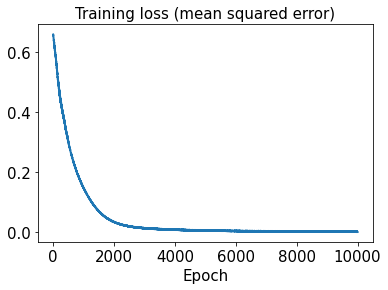

In [22]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

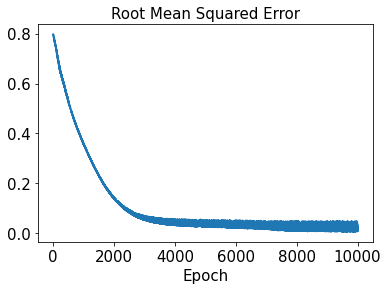

In [23]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [24]:
input_data = tf.keras.Input(shape=(n_sensors, 1))
reshape = tf.keras.layers.Reshape((n_sensors,))(input_data)

x_ = tf.keras.layers.Dense(units=128, activation='relu', name='firstHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='secondHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='thirdHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=101*101, activation=None, name='outputLayer')(x_)
output_img = tf.keras.layers.Reshape((101,101))(output_data)
# Shallow Decoder (SD)
sd1 = tf.keras.Model(input_data, output_img)
sd2 = tf.keras.Model(input_data, output_img)
sd3 = tf.keras.Model(input_data, output_img)

In [25]:
sd1.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 16, 1)]           0         
                                                                 
 reshape_2 (Reshape)         (None, 16)                0         
                                                                 
 firstHiddenLayer (Dense)    (None, 128)               2176      
                                                                 
 batch_normalization_5 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 secondHiddenLayer (Dense)   (None, 128)               16512     
                                                                 
 batch_normalization_6 (Batc  (None, 128)              512       
 hNormalization)                                           

In [26]:
sd1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [27]:
start1 = datetime.datetime.now()
history1 = sd1.fit(x_train1, y_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 12ms/step - loss: 0.5294 - rmse: 0.4949
Epoch 2/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5239 - rmse: 0.4904
Epoch 3/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.5194 - rmse: 0.4868
Epoch 4/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5146 - rmse: 0.4829
Epoch 5/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5107 - rmse: 0.4798
Epoch 6/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5072 - rmse: 0.4773
Epoch 7/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5029 - rmse: 0.4739
Epoch 8/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.4996 - rmse: 0.4714
Epoch 9/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4971 - rmse: 0.4698
Epoch 10/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.4939 - rmse: 0.4674
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 9ms/step - loss: 0.3949 - rmse: 0.4322
Epoch 87/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3938 - rmse: 0.4319
Epoch 88/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3931 - rmse: 0.4319
Epoch 89/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3933 - rmse: 0.4330
Epoch 90/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3907 - rmse: 0.4308
Epoch 91/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3905 - rmse: 0.4316
Epoch 92/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3892 - rmse: 0.4309
Epoch 93/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3876 - rmse: 0.4299
Epoch 94/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3868 - rmse: 0.4298
Epoch 95/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3852 - rmse: 0.4289
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 8ms/step - loss: 0.2845 - rmse: 0.3632
Epoch 171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2820 - rmse: 0.3604
Epoch 172/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2802 - rmse: 0.3588
Epoch 173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2786 - rmse: 0.3572
Epoch 174/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2770 - rmse: 0.3558
Epoch 175/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2764 - rmse: 0.3557
Epoch 176/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.2732 - rmse: 0.3520
Epoch 177/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2717 - rmse: 0.3507
Epoch 178/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.2700 - rmse: 0.3490
Epoch 179/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2690 - rmse: 0.3483
Epoch 180/10000
2/2 [====================

2/2 [==============================] - 0s 7ms/step - loss: 0.1563 - rmse: 0.2072
Epoch 255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1534 - rmse: 0.2010
Epoch 256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1532 - rmse: 0.2013
Epoch 257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1509 - rmse: 0.1967
Epoch 258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1497 - rmse: 0.1945
Epoch 259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1486 - rmse: 0.1927
Epoch 260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1469 - rmse: 0.1892
Epoch 261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1460 - rmse: 0.1879
Epoch 262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1452 - rmse: 0.1865
Epoch 263/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1438 - rmse: 0.1838
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0929 - rmse: 0.0832
Epoch 339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0937 - rmse: 0.0892
Epoch 340/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0927 - rmse: 0.0850
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0920 - rmse: 0.0824
Epoch 342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0927 - rmse: 0.0882
Epoch 343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0907 - rmse: 0.0782
Epoch 344/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0910 - rmse: 0.0817
Epoch 345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0907 - rmse: 0.0811
Epoch 346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0898 - rmse: 0.0773
Epoch 347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0893 - rmse: 0.0760
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0679 - rmse: 0.0408
Epoch 423/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0688 - rmse: 0.0527
Epoch 424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0677 - rmse: 0.0429
Epoch 425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0672 - rmse: 0.0397
Epoch 426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0665 - rmse: 0.0325
Epoch 427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0668 - rmse: 0.0393
Epoch 428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0677 - rmse: 0.0519
Epoch 429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0665 - rmse: 0.0401
Epoch 430/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0662 - rmse: 0.0396
Epoch 431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0671 - rmse: 0.0514
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.0533 - rmse: 0.0383
Epoch 507/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0530 - rmse: 0.0372
Epoch 508/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0522 - rmse: 0.0261
Epoch 509/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0525 - rmse: 0.0344
Epoch 510/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0518 - rmse: 0.0252
Epoch 511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0516 - rmse: 0.0232
Epoch 512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0514 - rmse: 0.0221
Epoch 513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0520 - rmse: 0.0349
Epoch 514/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0511 - rmse: 0.0217
Epoch 515/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0514 - rmse: 0.0294
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0424 - rmse: 0.0340
Epoch 591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0423 - rmse: 0.0331
Epoch 592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0417 - rmse: 0.0253
Epoch 593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0416 - rmse: 0.0240
Epoch 594/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0410 - rmse: 0.0129
Epoch 595/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0417 - rmse: 0.0303
Epoch 596/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0410 - rmse: 0.0172
Epoch 597/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0422 - rmse: 0.0401
Epoch 598/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0408 - rmse: 0.0191
Epoch 599/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0407 - rmse: 0.0189
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0347 - rmse: 0.0329
Epoch 675/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0350 - rmse: 0.0382
Epoch 676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0338 - rmse: 0.0177
Epoch 677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0338 - rmse: 0.0198
Epoch 678/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0339 - rmse: 0.0249
Epoch 679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0352 - rmse: 0.0436
Epoch 680/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0339 - rmse: 0.0275
Epoch 681/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0354 - rmse: 0.0481
Epoch 682/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0335 - rmse: 0.0227
Epoch 683/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0337 - rmse: 0.0274
Epoch 684/10000
2/2 [========================

2/2 [==============================] - 0s 6ms/step - loss: 0.0282 - rmse: 0.0198
Epoch 759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0287 - rmse: 0.0310
Epoch 760/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0283 - rmse: 0.0245
Epoch 761/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0287 - rmse: 0.0325
Epoch 762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0283 - rmse: 0.0262
Epoch 763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0285 - rmse: 0.0308
Epoch 764/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0285 - rmse: 0.0311
Epoch 765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0282 - rmse: 0.0274
Epoch 766/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0275 - rmse: 0.0119
Epoch 767/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0281 - rmse: 0.0279
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.0240 - rmse: 0.0242
Epoch 843/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0244 - rmse: 0.0319
Epoch 844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0242 - rmse: 0.0288
Epoch 845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0252 - rmse: 0.0431
Epoch 846/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0235 - rmse: 0.0153
Epoch 847/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0242 - rmse: 0.0320
Epoch 848/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0235 - rmse: 0.0177
Epoch 849/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0251 - rmse: 0.0450
Epoch 850/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0237 - rmse: 0.0259
Epoch 851/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0235 - rmse: 0.0226
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.0206 - rmse: 0.0236
Epoch 927/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0204 - rmse: 0.0192
Epoch 928/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0204 - rmse: 0.0208
Epoch 929/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0208 - rmse: 0.0289
Epoch 930/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0215 - rmse: 0.0404
Epoch 931/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0202 - rmse: 0.0194
Epoch 932/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0207 - rmse: 0.0288
Epoch 933/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0199 - rmse: 0.0100
Epoch 934/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0210 - rmse: 0.0355
Epoch 935/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0204 - rmse: 0.0267
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0181 - rmse: 0.0275
Epoch 1011/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0184 - rmse: 0.0322
Epoch 1012/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0175 - rmse: 0.0120
Epoch 1013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0181 - rmse: 0.0288
Epoch 1014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0191 - rmse: 0.0426
Epoch 1015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0179 - rmse: 0.0258
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0179 - rmse: 0.0257
Epoch 1017/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0174 - rmse: 0.0157
Epoch 1018/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0177 - rmse: 0.0238
Epoch 1019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0180 - rmse: 0.0291
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0157 - rmse: 0.0215
Epoch 1094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0155 - rmse: 0.0171
Epoch 1095/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0161 - rmse: 0.0292
Epoch 1096/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0157 - rmse: 0.0220
Epoch 1097/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0160 - rmse: 0.0282
Epoch 1098/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0163 - rmse: 0.0338
Epoch 1099/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0170 - rmse: 0.0433
Epoch 1100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0170 - rmse: 0.0438
Epoch 1101/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0165 - rmse: 0.0370
Epoch 1102/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0160 - rmse: 0.0309
Epoch 1103/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0145 - rmse: 0.0318
Epoch 1177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0151 - rmse: 0.0403
Epoch 1178/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0143 - rmse: 0.0293
Epoch 1179/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0142 - rmse: 0.0277
Epoch 1180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0143 - rmse: 0.0294
Epoch 1181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0136 - rmse: 0.0115
Epoch 1182/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0144 - rmse: 0.0316
Epoch 1183/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0144 - rmse: 0.0313
Epoch 1184/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0142 - rmse: 0.0294
Epoch 1185/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0142 - rmse: 0.0298
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0135 - rmse: 0.0381
Epoch 1260/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0128 - rmse: 0.0273
Epoch 1261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0125 - rmse: 0.0224
Epoch 1262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0135 - rmse: 0.0393
Epoch 1263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0125 - rmse: 0.0228
Epoch 1264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0131 - rmse: 0.0330
Epoch 1265/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0121 - rmse: 0.0141
Epoch 1266/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0134 - rmse: 0.0384
Epoch 1267/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0131 - rmse: 0.0339
Epoch 1268/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0124 - rmse: 0.0231
Epoch 1269/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.0173
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0112 - rmse: 0.0219
Epoch 1344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.0191
Epoch 1345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.0190
Epoch 1346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0110 - rmse: 0.0166
Epoch 1347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0115 - rmse: 0.0278
Epoch 1348/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0124 - rmse: 0.0422
Epoch 1349/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0110 - rmse: 0.0177
Epoch 1350/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0109 - rmse: 0.0161
Epoch 1351/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.0229
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0155
Epoch 1426/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0099 - rmse: 0.0174
Epoch 1427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0104 - rmse: 0.0279
Epoch 1428/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0105 - rmse: 0.0302
Epoch 1429/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0098 - rmse: 0.0146
Epoch 1430/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0108
Epoch 1431/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0099 - rmse: 0.0195
Epoch 1432/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0148
Epoch 1433/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0101 - rmse: 0.0235
Epoch 1434/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0179
Epoch 1435/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0171
Epoch 1509/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0157
Epoch 1510/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0178
Epoch 1511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0342
Epoch 1512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0172
Epoch 1513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0133
Epoch 1514/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0128
Epoch 1515/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0092 - rmse: 0.0246
Epoch 1516/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0283
Epoch 1517/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0278
Epoch 1518/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0094 - rmse: 0.0402
Epoch 1592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0152
Epoch 1593/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0272
Epoch 1594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0129
Epoch 1595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0184
Epoch 1596/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0224
Epoch 1597/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0292
Epoch 1598/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0097
Epoch 1599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0320
Epoch 1600/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0238
Epoch 1601/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0086 - rmse: 0.0403
Epoch 1675/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0077 - rmse: 0.0263
Epoch 1676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0325
Epoch 1677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0082
Epoch 1678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0086 - rmse: 0.0409
Epoch 1679/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0078 - rmse: 0.0296
Epoch 1680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0124
Epoch 1681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0123
Epoch 1682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0161
Epoch 1683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0290
Epoch 1684/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0067 - rmse: 0.0195
Epoch 1758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0320
Epoch 1759/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0064 - rmse: 0.0130
Epoch 1760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0171
Epoch 1761/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0077 - rmse: 0.0373
Epoch 1762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0207
Epoch 1763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0109
Epoch 1764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0094
Epoch 1765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0433
Epoch 1766/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0234
Epoch 1767/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0064 - rmse: 0.0262
Epoch 1841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0461
Epoch 1842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0341
Epoch 1843/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0060 - rmse: 0.0185
Epoch 1844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0472
Epoch 1845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0126
Epoch 1846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0275
Epoch 1847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0278
Epoch 1848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0113
Epoch 1849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0121
Epoch 1850/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0292
Epoch 1924/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0092
Epoch 1925/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0201
Epoch 1926/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0302
Epoch 1927/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0195
Epoch 1928/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0084
Epoch 1929/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0397
Epoch 1930/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0367
Epoch 1931/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0153
Epoch 1932/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0459
Epoch 1933/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0268
Epoch 2007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0129
Epoch 2008/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0318
Epoch 2009/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0191
Epoch 2010/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0145
Epoch 2011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0154
Epoch 2012/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0050 - rmse: 0.0208
Epoch 2013/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0227
Epoch 2014/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0471
Epoch 2015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0329
Epoch 2016/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0095
Epoch 2090/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0159
Epoch 2091/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0181
Epoch 2092/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0254
Epoch 2093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0170
Epoch 2094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0181
Epoch 2095/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0283
Epoch 2096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0248
Epoch 2097/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0122
Epoch 2098/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0096
Epoch 2099/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0180
Epoch 2173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0317
Epoch 2174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0255
Epoch 2175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0242
Epoch 2176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0259
Epoch 2177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0275
Epoch 2178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0154
Epoch 2179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0315
Epoch 2180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0310
Epoch 2181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0287
Epoch 2182/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0306
Epoch 2256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0097
Epoch 2257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0216
Epoch 2258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0284
Epoch 2259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0173
Epoch 2260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0263
Epoch 2261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0461
Epoch 2262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0150
Epoch 2263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0127
Epoch 2264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0102
Epoch 2265/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0315
Epoch 2339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0441
Epoch 2340/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0220
Epoch 2341/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0241
Epoch 2342/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0232
Epoch 2343/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0370
Epoch 2344/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0283
Epoch 2345/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0343
Epoch 2346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0331
Epoch 2347/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0320
Epoch 2348/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0088
Epoch 2422/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0128
Epoch 2423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0327
Epoch 2424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0219
Epoch 2425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0303
Epoch 2426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0227
Epoch 2427/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0096
Epoch 2428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0264
Epoch 2429/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0301
Epoch 2430/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0309
Epoch 2431/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0357
Epoch 2505/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0433
Epoch 2506/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0261
Epoch 2507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0351
Epoch 2508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0198
Epoch 2509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0176
Epoch 2510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0268
Epoch 2511/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0266
Epoch 2512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0359
Epoch 2513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0230
Epoch 2514/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0225
Epoch 2588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0233
Epoch 2589/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0182
Epoch 2590/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0135
Epoch 2591/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0224
Epoch 2592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0217
Epoch 2593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0155
Epoch 2594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0216
Epoch 2595/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0237
Epoch 2596/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0218
Epoch 2597/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0158
Epoch 2671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0322
Epoch 2672/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0315
Epoch 2673/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0402
Epoch 2674/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0139
Epoch 2675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0376
Epoch 2676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0193
Epoch 2677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0180
Epoch 2678/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0201
Epoch 2679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0283
Epoch 2680/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0189
Epoch 2754/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0184
Epoch 2755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0117
Epoch 2756/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0274
Epoch 2757/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0215
Epoch 2758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0100
Epoch 2759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0233
Epoch 2760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0213
Epoch 2761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0208
Epoch 2762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0301
Epoch 2763/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0076
Epoch 2837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0118
Epoch 2838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0316
Epoch 2839/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0169
Epoch 2840/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0463
Epoch 2841/10000
2/2 [==============================] - 0s 23ms/step - loss: 0.0017 - rmse: 0.0112
Epoch 2842/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0024 - rmse: 0.0282
Epoch 2843/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0313
Epoch 2844/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0118
Epoch 2845/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0032 - rmse: 0.0406
Epoch 2846/10000
2/2 [========

2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0153
Epoch 2920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0340
Epoch 2921/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0302
Epoch 2922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0182
Epoch 2923/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0114
Epoch 2924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0207
Epoch 2925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0437
Epoch 2926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0334
Epoch 2927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0290
Epoch 2928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0306
Epoch 2929/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0213
Epoch 3003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0324
Epoch 3004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0150
Epoch 3005/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0412
Epoch 3006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0151
Epoch 3007/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0127
Epoch 3008/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0349
Epoch 3009/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0168
Epoch 3010/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0335
Epoch 3011/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0154
Epoch 3012/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0405
Epoch 3086/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0404
Epoch 3087/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0376
Epoch 3088/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0105
Epoch 3089/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0212
Epoch 3090/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0135
Epoch 3091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0098
Epoch 3092/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0161
Epoch 3093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0113
Epoch 3094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0328
Epoch 3095/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0205
Epoch 3169/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0252
Epoch 3170/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0318
Epoch 3171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0315
Epoch 3172/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0166
Epoch 3173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0169
Epoch 3174/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0218
Epoch 3175/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0302
Epoch 3176/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0310
Epoch 3177/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0106
Epoch 3178/10000
2/2 [==============

2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0296
Epoch 3252/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0191
Epoch 3253/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0295
Epoch 3254/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0277
Epoch 3255/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0278
Epoch 3256/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0452
Epoch 3257/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0303
Epoch 3258/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0219
Epoch 3259/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0292
Epoch 3260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0229
Epoch 3261/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0395
Epoch 3335/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0226
Epoch 3336/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0288
Epoch 3337/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0106
Epoch 3338/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0171
Epoch 3339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0300
Epoch 3340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0301
Epoch 3341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0267
Epoch 3342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0272
Epoch 3343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0156
Epoch 3344/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0224
Epoch 3418/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0325
Epoch 3419/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0261
Epoch 3420/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0189
Epoch 3421/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0199
Epoch 3422/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8768e-04 - rmse: 0.0085
Epoch 3423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0240
Epoch 3424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0254
Epoch 3425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0209
Epoch 3426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0279
Epoch 3427/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0426
Epoch 3501/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.8722e-04 - rmse: 0.0154
Epoch 3502/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0249
Epoch 3503/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0176
Epoch 3504/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0327
Epoch 3505/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0285
Epoch 3506/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0353
Epoch 3507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0165
Epoch 3508/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0279
Epoch 3509/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0260
Epoch 3510/10000
2/2 [===========

2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0250
Epoch 3584/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0200
Epoch 3585/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7720e-04 - rmse: 0.0171
Epoch 3586/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0181
Epoch 3587/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5270e-04 - rmse: 0.0164
Epoch 3588/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0490
Epoch 3589/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.2884e-04 - rmse: 0.0121
Epoch 3590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0396
Epoch 3591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0210
Epoch 3592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0264
Epoch 3593/10000
2/2

2/2 [==============================] - 0s 8ms/step - loss: 7.2433e-04 - rmse: 0.0097
Epoch 3666/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6577e-04 - rmse: 0.0061
Epoch 3667/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9175e-04 - rmse: 0.0080
Epoch 3668/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0311
Epoch 3669/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.6526e-04 - rmse: 0.0184
Epoch 3670/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6027e-04 - rmse: 0.0058
Epoch 3671/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0292
Epoch 3672/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.6411e-04 - rmse: 0.0184
Epoch 3673/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6908e-04 - rmse: 0.0186
Epoch 3674/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0002e-04 - rmse: 0.0133
Epoch

2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0271
Epoch 3747/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0320
Epoch 3748/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.3538e-04 - rmse: 0.0189
Epoch 3749/10000
2/2 [==============================] - 0s 21ms/step - loss: 6.9241e-04 - rmse: 0.0107
Epoch 3750/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0308
Epoch 3751/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0299
Epoch 3752/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0242
Epoch 3753/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0233
Epoch 3754/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0325
Epoch 3755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0428
Epoch 3756/10000
2/2 [==

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0258
Epoch 3829/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8134e-04 - rmse: 0.0070
Epoch 3830/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0323
Epoch 3831/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0325
Epoch 3832/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0290
Epoch 3833/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1719e-04 - rmse: 0.0137
Epoch 3834/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7676e-04 - rmse: 0.0212
Epoch 3835/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0340
Epoch 3836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0277
Epoch 3837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0327
Epoch 3838/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0230
Epoch 3911/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7455e-04 - rmse: 0.0091
Epoch 3912/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7704e-04 - rmse: 0.0197
Epoch 3913/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3399e-04 - rmse: 0.0211
Epoch 3914/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0275
Epoch 3915/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7458e-04 - rmse: 0.0196
Epoch 3916/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0293
Epoch 3917/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0257
Epoch 3918/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3666e-04 - rmse: 0.0187
Epoch 3919/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0295
Epoch 3920/10000


2/2 [==============================] - 0s 7ms/step - loss: 7.2457e-04 - rmse: 0.0164
Epoch 3992/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.9658e-04 - rmse: 0.0119
Epoch 3993/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0324
Epoch 3994/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3732e-04 - rmse: 0.0091
Epoch 3995/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.6792e-04 - rmse: 0.0204
Epoch 3996/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0300
Epoch 3997/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0286
Epoch 3998/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0423
Epoch 3999/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0259
Epoch 4000/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.6595e-04 - rmse: 0.0147
Epoch 4001/10000


2/2 [==============================] - 0s 9ms/step - loss: 6.7227e-04 - rmse: 0.0159
Epoch 4073/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4723e-04 - rmse: 0.0151
Epoch 4074/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.5690e-04 - rmse: 0.0154
Epoch 4075/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0447
Epoch 4076/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.3232e-04 - rmse: 0.0227
Epoch 4077/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9307e-04 - rmse: 0.0218
Epoch 4078/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0419
Epoch 4079/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.4541e-04 - rmse: 0.0151
Epoch 4080/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0409
Epoch 4081/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5229e-04 - rmse: 0.0232
Epoch 408

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0289
Epoch 4155/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0345
Epoch 4156/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0289
Epoch 4157/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.6983e-04 - rmse: 0.0242
Epoch 4158/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9206e-04 - rmse: 0.0202
Epoch 4159/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9487e-04 - rmse: 0.0202
Epoch 4160/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0255
Epoch 4161/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9269e-04 - rmse: 0.0225
Epoch 4162/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0266
Epoch 4163/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7536e-04 - rmse: 0.0138
Epoch 4164/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0320
Epoch 4236/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0017e-04 - rmse: 0.0233
Epoch 4237/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4518e-04 - rmse: 0.0169
Epoch 4238/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0216e-04 - rmse: 0.0186
Epoch 4239/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0423
Epoch 4240/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5610e-04 - rmse: 0.0141
Epoch 4241/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7000e-04 - rmse: 0.0107
Epoch 4242/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1390e-04 - rmse: 0.0076
Epoch 4243/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0311
Epoch 4244/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0258
Epoch 4245/10

2/2 [==============================] - 0s 8ms/step - loss: 3.9650e-04 - rmse: 0.0080
Epoch 4317/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9351e-04 - rmse: 0.0162
Epoch 4318/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0373
Epoch 4319/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4457e-04 - rmse: 0.0177
Epoch 4320/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0462
Epoch 4321/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7200e-04 - rmse: 0.0065
Epoch 4322/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9871e-04 - rmse: 0.0083
Epoch 4323/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0438
Epoch 4324/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4063e-04 - rmse: 0.0247
Epoch 4325/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0571e-04 - rmse: 0.0088
Epoch 432

2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0350
Epoch 4398/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0275
Epoch 4399/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0287
Epoch 4400/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5888e-04 - rmse: 0.0235
Epoch 4401/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4407e-04 - rmse: 0.0209
Epoch 4402/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0320
Epoch 4403/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2741e-04 - rmse: 0.0180
Epoch 4404/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0320
Epoch 4405/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0306
Epoch 4406/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0301
Epoch 4407/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0324
Epoch 4480/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.7507e-04 - rmse: 0.0243
Epoch 4481/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0297
Epoch 4482/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9692e-04 - rmse: 0.0248
Epoch 4483/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5036e-04 - rmse: 0.0081
Epoch 4484/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0610e-04 - rmse: 0.0229
Epoch 4485/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0456
Epoch 4486/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7195e-04 - rmse: 0.0094
Epoch 4487/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4397e-04 - rmse: 0.0257
Epoch 4488/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0371
Epoch 4489/10

2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0460
Epoch 4561/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0318
Epoch 4562/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9053e-04 - rmse: 0.0113
Epoch 4563/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0275
Epoch 4564/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8099e-04 - rmse: 0.0204
Epoch 4565/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.1532e-04 - rmse: 0.0255
Epoch 4566/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5125e-04 - rmse: 0.0137
Epoch 4567/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9458e-04 - rmse: 0.0152
Epoch 4568/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0383
Epoch 4569/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0463
Epoch 4570/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0326
Epoch 4642/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3717e-04 - rmse: 0.0139
Epoch 4643/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6994e-04 - rmse: 0.0180
Epoch 4644/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0316
Epoch 4645/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8998e-04 - rmse: 0.0121
Epoch 4646/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0424
Epoch 4647/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1875e-04 - rmse: 0.0087
Epoch 4648/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0292
Epoch 4649/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0770e-04 - rmse: 0.0080
Epoch 4650/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1830e-04 - rmse: 0.0240
Epoch 4651/1

2/2 [==============================] - 0s 9ms/step - loss: 6.8869e-04 - rmse: 0.0214
Epoch 4723/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9918e-04 - rmse: 0.0164
Epoch 4724/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0978e-04 - rmse: 0.0090
Epoch 4725/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1022e-04 - rmse: 0.0220
Epoch 4726/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9481e-04 - rmse: 0.0216
Epoch 4727/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0317
Epoch 4728/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7792e-04 - rmse: 0.0212
Epoch 4729/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.0311e-04 - rmse: 0.0218
Epoch 4730/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0367
Epoch 4731/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0297
Epoch 473

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0282
Epoch 4804/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.3275e-04 - rmse: 0.0205
Epoch 4805/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7930e-04 - rmse: 0.0081
Epoch 4806/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9852e-04 - rmse: 0.0093
Epoch 4807/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1153e-04 - rmse: 0.0100
Epoch 4808/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.9223e-04 - rmse: 0.0195
Epoch 4809/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0453
Epoch 4810/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2311e-04 - rmse: 0.0033
Epoch 4811/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4142e-04 - rmse: 0.0054
Epoch 4812/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5676e-04 - rmse: 0.0067
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0467
Epoch 4885/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6630e-04 - rmse: 0.0258
Epoch 4886/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4840e-04 - rmse: 0.0071
Epoch 4887/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0318
Epoch 4888/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0471
Epoch 4889/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0616e-04 - rmse: 0.0176
Epoch 4890/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4485e-04 - rmse: 0.0069
Epoch 4891/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0308
Epoch 4892/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.6681e-04 - rmse: 0.0083
Epoch 4893/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.4531e-04 - rmse: 0.0255
Epoch 4894/10

2/2 [==============================] - 0s 7ms/step - loss: 6.9664e-04 - rmse: 0.0226
Epoch 4966/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0397
Epoch 4967/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8799e-04 - rmse: 0.0143
Epoch 4968/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0463
Epoch 4969/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.2476e-04 - rmse: 0.0232
Epoch 4970/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2886e-04 - rmse: 0.0273
Epoch 4971/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1800e-04 - rmse: 0.0208
Epoch 4972/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0411
Epoch 4973/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8973e-04 - rmse: 0.0103
Epoch 4974/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0460
Epoch 4975/10

2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0322
Epoch 5047/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9307e-04 - rmse: 0.0249
Epoch 5048/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.2738e-04 - rmse: 0.0256
Epoch 5049/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.0629e-04 - rmse: 0.0183
Epoch 5050/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1020e-04 - rmse: 0.0154
Epoch 5051/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3729e-04 - rmse: 0.0163
Epoch 5052/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.5250e-04 - rmse: 0.0241
Epoch 5053/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0399
Epoch 5054/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9493e-04 - rmse: 0.0206
Epoch 5055/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8210e-04 - rmse: 0.0226
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 6.6083e-04 - rmse: 0.0224
Epoch 5128/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9384e-04 - rmse: 0.0252
Epoch 5129/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0402
Epoch 5130/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2394e-04 - rmse: 0.0162
Epoch 5131/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.8591e-04 - rmse: 0.0150
Epoch 5132/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5333e-04 - rmse: 0.0139
Epoch 5133/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2513e-04 - rmse: 0.0238
Epoch 5134/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0327
Epoch 5135/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7566e-04 - rmse: 0.0204
Epoch 5136/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.6180e-04 - rmse: 0.0201
Epoc

2/2 [==============================] - 0s 8ms/step - loss: 6.7807e-04 - rmse: 0.0230
Epoch 5209/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1592e-04 - rmse: 0.0258
Epoch 5210/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3380e-04 - rmse: 0.0280
Epoch 5211/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0214e-04 - rmse: 0.0073
Epoch 5212/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4313e-04 - rmse: 0.0198
Epoch 5213/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.6940e-04 - rmse: 0.0268
Epoch 5214/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.3786e-04 - rmse: 0.0197
Epoch 5215/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3250e-04 - rmse: 0.0092
Epoch 5216/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1012e-04 - rmse: 0.0257
Epoch 5217/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1838e-04 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 2.6491e-04 - rmse: 0.0112
Epoch 5290/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.8685e-04 - rmse: 0.0121
Epoch 5291/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0327
Epoch 5292/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0325
Epoch 5293/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.7961e-04 - rmse: 0.0063
Epoch 5294/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3141e-04 - rmse: 0.0198
Epoch 5295/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.5192e-04 - rmse: 0.0226
Epoch 5296/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0368
Epoch 5297/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0870e-04 - rmse: 0.0083
Epoch 5298/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0427
Epoch 5299/10

2/2 [==============================] - 0s 7ms/step - loss: 8.4535e-04 - rmse: 0.0267
Epoch 5371/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0355
Epoch 5372/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.2201e-04 - rmse: 0.0198
Epoch 5373/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.1130e-04 - rmse: 0.0241
Epoch 5374/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0106e-04 - rmse: 0.0193
Epoch 5375/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1033e-04 - rmse: 0.0195
Epoch 5376/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0362
Epoch 5377/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0416e-04 - rmse: 0.0240
Epoch 5378/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0324
Epoch 5379/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9655e-04 - rmse: 0.0191
Epoch 538

2/2 [==============================] - 0s 10ms/step - loss: 9.9606e-04 - rmse: 0.0296
Epoch 5452/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.6839e-04 - rmse: 0.0234
Epoch 5453/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.7019e-04 - rmse: 0.0255
Epoch 5454/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.1955e-04 - rmse: 0.0244
Epoch 5455/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0310
Epoch 5456/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.1175e-04 - rmse: 0.0197
Epoch 5457/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2865e-04 - rmse: 0.0144
Epoch 5458/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2821e-04 - rmse: 0.0103
Epoch 5459/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0306
Epoch 5460/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5832e-04 - rmse: 0.0232


2/2 [==============================] - 0s 8ms/step - loss: 5.6265e-04 - rmse: 0.0212
Epoch 5533/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6065e-04 - rmse: 0.0291
Epoch 5534/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5697e-04 - rmse: 0.0119
Epoch 5535/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4232e-04 - rmse: 0.0151
Epoch 5536/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7159e-04 - rmse: 0.0256
Epoch 5537/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7787e-04 - rmse: 0.0128
Epoch 5538/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0674e-04 - rmse: 0.0282
Epoch 5539/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1317e-04 - rmse: 0.0264
Epoch 5540/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0309
Epoch 5541/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0414e-04 - rmse: 0.0095
E

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0326
Epoch 5614/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0474
Epoch 5615/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0471
Epoch 5616/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7296e-04 - rmse: 0.0163
Epoch 5617/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0453
Epoch 5618/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0309
Epoch 5619/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.2389e-04 - rmse: 0.0227
Epoch 5620/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 5621/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0331
Epoch 5622/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0311
Epoch 5623/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 1.8427e-04 - rmse: 0.0091
Epoch 5695/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9166e-04 - rmse: 0.0095
Epoch 5696/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.4537e-04 - rmse: 0.0254
Epoch 5697/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 5698/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8969e-04 - rmse: 0.0197
Epoch 5699/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.1727e-04 - rmse: 0.0204
Epoch 5700/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2059e-04 - rmse: 0.0228
Epoch 5701/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0366e-04 - rmse: 0.0283
Epoch 5702/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5768e-04 - rmse: 0.0161
Epoch 5703/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.4603e-04 - rmse: 0.0157
E

2/2 [==============================] - 0s 10ms/step - loss: 9.9813e-04 - rmse: 0.0301
Epoch 5776/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0374e-04 - rmse: 0.0285
Epoch 5777/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8644e-04 - rmse: 0.0282
Epoch 5778/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.6364e-04 - rmse: 0.0239
Epoch 5779/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0390
Epoch 5780/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0438
Epoch 5781/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4138e-04 - rmse: 0.0234
Epoch 5782/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0508
Epoch 5783/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9611e-04 - rmse: 0.0265
Epoch 5784/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6281e-04 - rmse: 0.0217


2/2 [==============================] - 0s 9ms/step - loss: 4.6972e-04 - rmse: 0.0195
Epoch 5856/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0305
Epoch 5857/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.6044e-04 - rmse: 0.0131
Epoch 5858/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5776e-04 - rmse: 0.0217
Epoch 5859/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.3647e-04 - rmse: 0.0274
Epoch 5860/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7646e-04 - rmse: 0.0094
Epoch 5861/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 5862/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0315
Epoch 5863/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.6408e-04 - rmse: 0.0133
Epoch 5864/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0424
Epoch

2/2 [==============================] - 0s 9ms/step - loss: 8.4725e-04 - rmse: 0.0277
Epoch 5936/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9541e-04 - rmse: 0.0146
Epoch 5937/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2123e-04 - rmse: 0.0232
Epoch 5938/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9545e-04 - rmse: 0.0203
Epoch 5939/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2985e-04 - rmse: 0.0157
Epoch 5940/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.1162e-04 - rmse: 0.0181
Epoch 5941/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7425e-04 - rmse: 0.0222
Epoch 5942/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1846e-04 - rmse: 0.0271
Epoch 5943/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7211e-04 - rmse: 0.0221
Epoch 5944/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2892e-04 - rmse:

2/2 [==============================] - 0s 7ms/step - loss: 7.7479e-04 - rmse: 0.0264
Epoch 6016/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.7552e-04 - rmse: 0.0264
Epoch 6017/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6004e-04 - rmse: 0.0135
Epoch 6018/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8746e-04 - rmse: 0.0105
Epoch 6019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0311
Epoch 6020/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4983e-04 - rmse: 0.0131
Epoch 6021/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0598e-04 - rmse: 0.0207
Epoch 6022/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3916e-04 - rmse: 0.0127
Epoch 6023/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 6024/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0461
Epoch 602

2/2 [==============================] - 0s 9ms/step - loss: 3.2948e-04 - rmse: 0.0160
Epoch 6096/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.8383e-04 - rmse: 0.0203
Epoch 6097/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3907e-04 - rmse: 0.0294
Epoch 6098/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4506e-04 - rmse: 0.0085
Epoch 6099/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.3722e-04 - rmse: 0.0216
Epoch 6100/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7294e-04 - rmse: 0.0173
Epoch 6101/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0310
Epoch 6102/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.9093e-04 - rmse: 0.0303
Epoch 6103/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0402
Epoch 6104/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1507e-04 - rmse: 0.0

2/2 [==============================] - 0s 11ms/step - loss: 1.1448e-04 - rmse: 0.0068
Epoch 6176/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9816e-04 - rmse: 0.0207
Epoch 6177/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.0720e-04 - rmse: 0.0232
Epoch 6178/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.6490e-04 - rmse: 0.0282
Epoch 6179/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0372
Epoch 6180/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.6069e-04 - rmse: 0.0299
Epoch 6181/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4900e-04 - rmse: 0.0090
Epoch 6182/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0207e-04 - rmse: 0.0116
Epoch 6183/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.2935e-04 - rmse: 0.0257
Epoch 6184/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5194e-04 - rmse:

2/2 [==============================] - 0s 11ms/step - loss: 2.6181e-04 - rmse: 0.0140
Epoch 6256/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 6257/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.6642e-04 - rmse: 0.0200
Epoch 6258/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.1406e-05 - rmse: 0.0052
Epoch 6259/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1755e-04 - rmse: 0.0073
Epoch 6260/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6050e-05 - rmse: 0.0056
Epoch 6261/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 6262/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6263/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.2083e-04 - rmse: 0.0256
Epoch 6264/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4309e-04 - rmse: 0.0134
E

2/2 [==============================] - 0s 11ms/step - loss: 8.1352e-04 - rmse: 0.0274
Epoch 6336/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8237e-04 - rmse: 0.0287
Epoch 6337/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 6338/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.2256e-04 - rmse: 0.0215
Epoch 6339/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9451e-04 - rmse: 0.0183
Epoch 6340/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 6341/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.4118e-04 - rmse: 0.0261
Epoch 6342/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.4069e-04 - rmse: 0.0261
Epoch 6343/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.4415e-04 - rmse: 0.0280
Epoch 6344/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0392

2/2 [==============================] - 0s 10ms/step - loss: 2.9022e-04 - rmse: 0.0153
Epoch 6416/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 6417/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5923e-04 - rmse: 0.0201
Epoch 6418/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6202e-04 - rmse: 0.0301
Epoch 6419/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 6420/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5489e-04 - rmse: 0.0141
Epoch 6421/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9644e-04 - rmse: 0.0118
Epoch 6422/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8227e-04 - rmse: 0.0181
Epoch 6423/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.9802e-04 - rmse: 0.0272
Epoch 6424/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6984e-04 - rmse: 0.01

2/2 [==============================] - 0s 10ms/step - loss: 8.6402e-04 - rmse: 0.0285
Epoch 6496/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5919e-04 - rmse: 0.0144
Epoch 6497/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0316
Epoch 6498/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.2032e-04 - rmse: 0.0295
Epoch 6499/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0388
Epoch 6500/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7925e-04 - rmse: 0.0181
Epoch 6501/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.2907e-04 - rmse: 0.0296
Epoch 6502/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.2485e-04 - rmse: 0.0278
Epoch 6503/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.0291e-04 - rmse: 0.0255
Epoch 6504/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0452
Ep

2/2 [==============================] - 0s 7ms/step - loss: 1.7476e-04 - rmse: 0.0112
Epoch 6576/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0309
Epoch 6577/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5249e-04 - rmse: 0.0283
Epoch 6578/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0363
Epoch 6579/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4478e-04 - rmse: 0.0264
Epoch 6580/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3541e-04 - rmse: 0.0221
Epoch 6581/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6201e-05 - rmse: 0.0061
Epoch 6582/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0310
Epoch 6583/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 6584/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4898e-04 - rmse: 0.0200
Epoch 6585/10

2/2 [==============================] - 0s 8ms/step - loss: 3.1729e-04 - rmse: 0.0165
Epoch 6657/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7641e-04 - rmse: 0.0208
Epoch 6658/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.2266e-05 - rmse: 0.0068
Epoch 6659/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5078e-04 - rmse: 0.0266
Epoch 6660/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6712e-04 - rmse: 0.0110
Epoch 6661/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7263e-04 - rmse: 0.0181
Epoch 6662/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 6663/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 6664/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6353e-04 - rmse: 0.0268
Epoch 6665/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3137e-04 - rmse: 0.0196
Epoch

2/2 [==============================] - 0s 10ms/step - loss: 1.4254e-04 - rmse: 0.0100
Epoch 6737/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7168e-04 - rmse: 0.0230
Epoch 6738/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 6739/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5321e-04 - rmse: 0.0145
Epoch 6740/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8674e-04 - rmse: 0.0273
Epoch 6741/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8653e-04 - rmse: 0.0156
Epoch 6742/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.4263e-04 - rmse: 0.0224
Epoch 6743/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9620e-04 - rmse: 0.0213
Epoch 6744/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 6745/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0408


2/2 [==============================] - 0s 10ms/step - loss: 7.4118e-04 - rmse: 0.0265
Epoch 6817/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 6818/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7281e-04 - rmse: 0.0271
Epoch 6819/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.1843e-04 - rmse: 0.0241
Epoch 6820/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0851e-04 - rmse: 0.0259
Epoch 6821/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.6782e-04 - rmse: 0.0270
Epoch 6822/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 6823/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4101e-04 - rmse: 0.0174
Epoch 6824/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1570e-04 - rmse: 0.0260
Epoch 6825/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4770e-04 - rmse: 0.

2/2 [==============================] - 0s 11ms/step - loss: 6.3666e-04 - rmse: 0.0245
Epoch 6897/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 6898/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.4548e-04 - rmse: 0.0284
Epoch 6899/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 6900/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.8614e-04 - rmse: 0.0308
Epoch 6901/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7033e-04 - rmse: 0.0306
Epoch 6902/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 6903/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8901e-04 - rmse: 0.0235
Epoch 6904/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 6905/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 6906/1

2/2 [==============================] - 0s 9ms/step - loss: 1.0183e-04 - rmse: 0.0082
Epoch 6977/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.6973e-05 - rmse: 0.0072
Epoch 6978/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0319
Epoch 6979/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.2277e-05 - rmse: 0.0062
Epoch 6980/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.3146e-05 - rmse: 0.0062
Epoch 6981/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6982/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0426
Epoch 6983/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 6984/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8411e-04 - rmse: 0.0158
Epoch 6985/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 6986/

2/2 [==============================] - 0s 10ms/step - loss: 9.7109e-04 - rmse: 0.0306
Epoch 7057/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 7058/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9441e-04 - rmse: 0.0190
Epoch 7059/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 7060/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1977e-04 - rmse: 0.0094
Epoch 7061/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 7062/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0435e-05 - rmse: 0.0062
Epoch 7063/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4511e-04 - rmse: 0.0248
Epoch 7064/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 7065/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.6389e-04 - rmse: 0.0271
Epoch 7

Epoch 7137/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4066e-04 - rmse: 0.0105
Epoch 7138/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2177e-05 - rmse: 0.0073
Epoch 7139/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 7140/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 7141/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 7142/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7456e-04 - rmse: 0.0186
Epoch 7143/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.7758e-04 - rmse: 0.0255
Epoch 7144/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3021e-04 - rmse: 0.0100
Epoch 7145/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1002e-05 - rmse: 0.0047
Epoch 7146/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4779e-04 - rmse:

2/2 [==============================] - 0s 7ms/step - loss: 3.6245e-04 - rmse: 0.0183
Epoch 7218/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 7219/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5142e-04 - rmse: 0.0206
Epoch 7220/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1439e-04 - rmse: 0.0093
Epoch 7221/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 7222/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6000e-04 - rmse: 0.0208
Epoch 7223/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.4563e-04 - rmse: 0.0178
Epoch 7224/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3122e-04 - rmse: 0.0102
Epoch 7225/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0536e-04 - rmse: 0.0167
Epoch 7226/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.4446e-04 - rmse: 0.0249
Epoch

2/2 [==============================] - 0s 11ms/step - loss: 4.6754e-04 - rmse: 0.0210
Epoch 7299/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 7300/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7008e-04 - rmse: 0.0273
Epoch 7301/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 7302/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.1953e-04 - rmse: 0.0222
Epoch 7303/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2261e-04 - rmse: 0.0199
Epoch 7304/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7115e-04 - rmse: 0.0186
Epoch 7305/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9749e-04 - rmse: 0.0278
Epoch 7306/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5845e-04 - rmse: 0.0252
Epoch 7307/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.4486e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 7379/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0991e-05 - rmse: 0.0069
Epoch 7380/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3447e-04 - rmse: 0.0203
Epoch 7381/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.2900e-04 - rmse: 0.0266
Epoch 7382/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2908e-04 - rmse: 0.0103
Epoch 7383/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7475e-04 - rmse: 0.0159
Epoch 7384/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.6698e-04 - rmse: 0.0211
Epoch 7385/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6565e-04 - rmse: 0.0185
Epoch 7386/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3873e-05 - rmse: 0.0046
Epoch 7387/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 7459/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.3118e-04 - rmse: 0.0285
Epoch 7460/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9733e-05 - rmse: 0.0062
Epoch 7461/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0221e-04 - rmse: 0.0261
Epoch 7462/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7399e-04 - rmse: 0.0274
Epoch 7463/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3809e-04 - rmse: 0.0178
Epoch 7464/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4602e-04 - rmse: 0.0180
Epoch 7465/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3098e-04 - rmse: 0.0145
Epoch 7466/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2903e-04 - rmse: 0.0284
Epoch 7467/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4337e-04 - rmse:

2/2 [==============================] - 0s 10ms/step - loss: 3.1335e-04 - rmse: 0.0171
Epoch 7539/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 7540/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.4277e-05 - rmse: 0.0081
Epoch 7541/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.4154e-05 - rmse: 0.0086
Epoch 7542/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7164e-04 - rmse: 0.0159
Epoch 7543/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0751e-04 - rmse: 0.0281
Epoch 7544/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.0539e-04 - rmse: 0.0197
Epoch 7545/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 7546/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4097e-05 - rmse: 0.0059
Epoch 7547/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2517e-04 - rmse: 0.0

2/2 [==============================] - 0s 10ms/step - loss: 7.9571e-04 - rmse: 0.0279
Epoch 7619/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5132e-04 - rmse: 0.0252
Epoch 7620/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4293e-05 - rmse: 0.0026
Epoch 7621/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9361e-04 - rmse: 0.0279
Epoch 7622/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8760e-05 - rmse: 0.0034
Epoch 7623/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.2265e-04 - rmse: 0.0266
Epoch 7624/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8588e-04 - rmse: 0.0130
Epoch 7625/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5499e-05 - rmse: 0.0042
Epoch 7626/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7368e-05 - rmse: 0.0045
Epoch 7627/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2888e-05 - rm

2/2 [==============================] - 0s 10ms/step - loss: 4.0960e-05 - rmse: 0.0050
Epoch 7699/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5273e-04 - rmse: 0.0209
Epoch 7700/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.3664e-04 - rmse: 0.0303
Epoch 7701/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2068e-04 - rmse: 0.0102
Epoch 7702/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.4537e-04 - rmse: 0.0181
Epoch 7703/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 7704/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.0966e-04 - rmse: 0.0244
Epoch 7705/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5891e-04 - rmse: 0.0210
Epoch 7706/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3319e-04 - rmse: 0.0204
Epoch 7707/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4854e-04 - rmse: 0.0

2/2 [==============================] - 0s 10ms/step - loss: 7.8702e-04 - rmse: 0.0278
Epoch 7779/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4775e-04 - rmse: 0.0153
Epoch 7780/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1900e-04 - rmse: 0.0265
Epoch 7781/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.8514e-04 - rmse: 0.0239
Epoch 7782/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.4104e-04 - rmse: 0.0181
Epoch 7783/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5960e-04 - rmse: 0.0291
Epoch 7784/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.4939e-04 - rmse: 0.0209
Epoch 7785/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.0563e-05 - rmse: 0.0087
Epoch 7786/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3994e-04 - rmse: 0.0250
Epoch 7787/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5259e-04 - rmse:

2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 7859/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4969e-04 - rmse: 0.0183
Epoch 7860/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1317e-04 - rmse: 0.0100
Epoch 7861/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0149e-04 - rmse: 0.0137
Epoch 7862/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8720e-04 - rmse: 0.0240
Epoch 7863/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8763e-04 - rmse: 0.0240
Epoch 7864/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7412e-05 - rmse: 0.0049
Epoch 7865/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0489e-04 - rmse: 0.0281
Epoch 7866/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0407e-05 - rmse: 0.0041
Epoch 7867/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6615e-04 - rmse: 0.0292
E

2/2 [==============================] - 0s 10ms/step - loss: 7.1427e-04 - rmse: 0.0265
Epoch 7940/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.7151e-04 - rmse: 0.0237
Epoch 7941/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.4432e-04 - rmse: 0.0208
Epoch 7942/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4124e-04 - rmse: 0.0251
Epoch 7943/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0635e-04 - rmse: 0.0282
Epoch 7944/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3183e-04 - rmse: 0.0268
Epoch 7945/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.5162e-05 - rmse: 0.0073
Epoch 7946/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1697e-04 - rmse: 0.0102
Epoch 7947/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.7678e-04 - rmse: 0.0191
Epoch 7948/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.8835e-04 - 

2/2 [==============================] - 0s 10ms/step - loss: 8.6747e-04 - rmse: 0.0293
Epoch 8020/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3126e-05 - rmse: 0.0085
Epoch 8021/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1523e-04 - rmse: 0.0201
Epoch 8022/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3592e-05 - rmse: 0.0072
Epoch 8023/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0082e-04 - rmse: 0.0095
Epoch 8024/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2121e-05 - rmse: 0.0056
Epoch 8025/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3066e-04 - rmse: 0.0148
Epoch 8026/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8732e-05 - rmse: 0.0069
Epoch 8027/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9349e-04 - rmse: 0.0280
Epoch 8028/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3864e-05 - 

2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 8100/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 8101/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0309e-05 - rmse: 0.0045
Epoch 8102/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8665e-05 - rmse: 0.0043
Epoch 8103/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8242e-05 - rmse: 0.0069
Epoch 8104/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1165e-04 - rmse: 0.0224
Epoch 8105/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7749e-04 - rmse: 0.0129
Epoch 8106/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4065e-04 - rmse: 0.0251
Epoch 8107/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 8108/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0422
Epo

2/2 [==============================] - 0s 10ms/step - loss: 6.0648e-05 - rmse: 0.0072
Epoch 8180/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.9520e-05 - rmse: 0.0084
Epoch 8181/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7931e-04 - rmse: 0.0130
Epoch 8182/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1408e-05 - rmse: 0.0065
Epoch 8183/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5403e-05 - rmse: 0.0068
Epoch 8184/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 8185/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 8186/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 8187/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5748e-04 - rmse: 0.0158
Epoch 8188/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0426
Epoc

2/2 [==============================] - 0s 9ms/step - loss: 1.3086e-05 - rmse: 0.0021
Epoch 8260/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7738e-04 - rmse: 0.0164
Epoch 8261/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4661e-04 - rmse: 0.0154
Epoch 8262/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5603e-04 - rmse: 0.0291
Epoch 8263/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 8264/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2700e-05 - rmse: 0.0058
Epoch 8265/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 8266/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7264e-04 - rmse: 0.0215
Epoch 8267/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.4566e-05 - rmse: 0.0081
Epoch 8268/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7508e-04 - rmse: 0.012

2/2 [==============================] - 0s 10ms/step - loss: 4.1053e-04 - rmse: 0.0201
Epoch 8340/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 8341/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8032e-04 - rmse: 0.0278
Epoch 8342/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.7798e-04 - rmse: 0.0277
Epoch 8343/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.4833e-04 - rmse: 0.0210
Epoch 8344/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1362e-04 - rmse: 0.0225
Epoch 8345/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9092e-05 - rmse: 0.0084
Epoch 8346/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3488e-05 - rmse: 0.0039
Epoch 8347/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1655e-04 - rmse: 0.0266
Epoch 8348/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.5110e-04 - rmse: 0.02

2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 8420/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0235e-04 - rmse: 0.0264
Epoch 8421/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1878e-04 - rmse: 0.0226
Epoch 8422/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0821e-04 - rmse: 0.0245
Epoch 8423/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9540e-04 - rmse: 0.0314
Epoch 8424/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6708e-04 - rmse: 0.0257
Epoch 8425/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2714e-04 - rmse: 0.0303
Epoch 8426/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1509e-04 - rmse: 0.0175
Epoch 8427/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6854e-04 - rmse: 0.0190
Epoch 8428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0332
Epoch

2/2 [==============================] - 0s 10ms/step - loss: 4.5537e-04 - rmse: 0.0212
Epoch 8501/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.8793e-04 - rmse: 0.0313
Epoch 8502/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6608e-04 - rmse: 0.0214
Epoch 8503/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8922e-04 - rmse: 0.0297
Epoch 8504/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5705e-04 - rmse: 0.0308
Epoch 8505/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3543e-04 - rmse: 0.0207
Epoch 8506/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 8507/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.3229e-04 - rmse: 0.0229
Epoch 8508/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.7408e-04 - rmse: 0.0277
Epoch 8509/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1766e-04 - rmse

2/2 [==============================] - 0s 9ms/step - loss: 7.8211e-04 - rmse: 0.0279
Epoch 8581/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0794e-04 - rmse: 0.0265
Epoch 8582/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2303e-04 - rmse: 0.0147
Epoch 8583/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.8183e-04 - rmse: 0.0194
Epoch 8584/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 8585/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2107e-04 - rmse: 0.0177
Epoch 8586/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0327e-04 - rmse: 0.0098
Epoch 8587/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0634e-04 - rmse: 0.0224
Epoch 8588/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6590e-05 - rmse: 0.0063
Epoch 8589/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0441e-04 - rmse: 

2/2 [==============================] - 0s 13ms/step - loss: 4.5817e-04 - rmse: 0.0213
Epoch 8661/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3779e-04 - rmse: 0.0115
Epoch 8662/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 8663/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9181e-04 - rmse: 0.0280
Epoch 8664/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 8665/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 8666/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.8713e-04 - rmse: 0.0261
Epoch 8667/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6846e-04 - rmse: 0.0257
Epoch 8668/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9207e-04 - rmse: 0.0136
Epoch 8669/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0422
Epo

2/2 [==============================] - 0s 10ms/step - loss: 3.2137e-04 - rmse: 0.0178
Epoch 8741/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.2046e-04 - rmse: 0.0227
Epoch 8742/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 8743/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8245e-04 - rmse: 0.0296
Epoch 8744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 8745/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5054e-04 - rmse: 0.0273
Epoch 8746/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.0381e-04 - rmse: 0.0245
Epoch 8747/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5334e-04 - rmse: 0.0122
Epoch 8748/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.1396e-04 - rmse: 0.0247
Epoch 8749/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.2592e-04 - rmse: 0.02

2/2 [==============================] - 0s 7ms/step - loss: 1.5853e-04 - rmse: 0.0124
Epoch 8821/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6351e-04 - rmse: 0.0214
Epoch 8822/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9332e-04 - rmse: 0.0197
Epoch 8823/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9874e-04 - rmse: 0.0139
Epoch 8824/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9075e-04 - rmse: 0.0169
Epoch 8825/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4315e-04 - rmse: 0.0154
Epoch 8826/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5789e-04 - rmse: 0.0159
Epoch 8827/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 8828/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1388e-04 - rmse: 0.0202
Epoch 8829/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6920e-04 - rmse: 0.0128
E

2/2 [==============================] - 0s 8ms/step - loss: 7.1110e-04 - rmse: 0.0266
Epoch 8901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 8902/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4023e-04 - rmse: 0.0306
Epoch 8903/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 8904/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4892e-04 - rmse: 0.0156
Epoch 8905/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6707e-05 - rmse: 0.0056
Epoch 8906/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1777e-04 - rmse: 0.0285
Epoch 8907/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 8908/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 8909/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.8839e-04 - rmse: 0.0313
Epoch 8910/10

2/2 [==============================] - 0s 11ms/step - loss: 5.2333e-04 - rmse: 0.0228
Epoch 8981/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 8982/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2626e-04 - rmse: 0.0110
Epoch 8983/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1427e-05 - rmse: 0.0060
Epoch 8984/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8754e-04 - rmse: 0.0297
Epoch 8985/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5596e-04 - rmse: 0.0308
Epoch 8986/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3994e-04 - rmse: 0.0208
Epoch 8987/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0204e-04 - rmse: 0.0282
Epoch 8988/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 8989/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6080e-04 - rmse: 0.

2/2 [==============================] - 0s 6ms/step - loss: 2.2292e-04 - rmse: 0.0148
Epoch 9061/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1700e-04 - rmse: 0.0177
Epoch 9062/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8096e-04 - rmse: 0.0279
Epoch 9063/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3651e-04 - rmse: 0.0305
Epoch 9064/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 9065/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5130e-04 - rmse: 0.0254
Epoch 9066/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5696e-04 - rmse: 0.0309
Epoch 9067/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.9185e-05 - rmse: 0.0067
Epoch 9068/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2735e-04 - rmse: 0.0180
Epoch 9069/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9319e-04 - rmse: 0.0314
E

2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 9141/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8172e-04 - rmse: 0.0296
Epoch 9142/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5235e-04 - rmse: 0.0186
Epoch 9143/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.1036e-04 - rmse: 0.0143
Epoch 9144/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.7374e-04 - rmse: 0.0259
Epoch 9145/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 9146/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7127e-04 - rmse: 0.0163
Epoch 9147/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1524e-05 - rmse: 0.0082
Epoch 9148/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6061e-04 - rmse: 0.0214
Epoch 9149/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 915

2/2 [==============================] - 0s 7ms/step - loss: 8.6523e-04 - rmse: 0.0293
Epoch 9222/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1319e-04 - rmse: 0.0144
Epoch 9223/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6841e-04 - rmse: 0.0310
Epoch 9224/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6783e-04 - rmse: 0.0310
Epoch 9225/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1631e-04 - rmse: 0.0145
Epoch 9226/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 9227/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.0060e-04 - rmse: 0.0244
Epoch 9228/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 9229/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3175e-04 - rmse: 0.0270
Epoch 9230/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3928e-04 - rmse: 0.0153
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 2.5019e-04 - rmse: 0.0157
Epoch 9303/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2944e-04 - rmse: 0.0229
Epoch 9304/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 9305/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6284e-05 - rmse: 0.0096
Epoch 9306/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9379e-04 - rmse: 0.0138
Epoch 9307/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5628e-05 - rmse: 0.0078
Epoch 9308/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 9309/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.3770e-04 - rmse: 0.0271
Epoch 9310/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.3795e-04 - rmse: 0.0231
Epoch 9311/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0271e-04 - rmse: 0.0173
Epoch

2/2 [==============================] - 0s 6ms/step - loss: 2.1350e-05 - rmse: 0.0041
Epoch 9383/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 9384/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0664e-04 - rmse: 0.0265
Epoch 9385/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3373e-06 - rmse: 0.0010
Epoch 9386/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 9387/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3689e-05 - rmse: 0.0031
Epoch 9388/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2758e-04 - rmse: 0.0304
Epoch 9389/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4128e-05 - rmse: 0.0084
Epoch 9390/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7632e-04 - rmse: 0.0278
Epoch 9391/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3598e-04 - rmse: 0.0251
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0430
Epoch 9463/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 9464/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7757e-04 - rmse: 0.0165
Epoch 9465/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6487e-04 - rmse: 0.0276
Epoch 9466/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8870e-04 - rmse: 0.0314
Epoch 9467/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.4240e-04 - rmse: 0.0253
Epoch 9468/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7653e-04 - rmse: 0.0131
Epoch 9469/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5601e-04 - rmse: 0.0188
Epoch 9470/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0640e-04 - rmse: 0.0300
Epoch 9471/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.7495e-04 - rmse: 0.0312
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 9544/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 9545/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 9546/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7731e-04 - rmse: 0.0165
Epoch 9547/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3889e-04 - rmse: 0.0153
Epoch 9548/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7495e-04 - rmse: 0.0131
Epoch 9549/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1614e-04 - rmse: 0.0226
Epoch 9550/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 9551/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8940e-04 - rmse: 0.0136
Epoch 9552/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.6569e-05 - rmse: 0.0065
Epoch 9553/1

2/2 [==============================] - 0s 7ms/step - loss: 2.4023e-04 - rmse: 0.0154
Epoch 9625/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6615e-05 - rmse: 0.0048
Epoch 9626/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1703e-04 - rmse: 0.0177
Epoch 9627/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5181e-04 - rmse: 0.0291
Epoch 9628/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0377e-04 - rmse: 0.0265
Epoch 9629/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3858e-04 - rmse: 0.0208
Epoch 9630/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.7581e-05 - rmse: 0.0049
Epoch 9631/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.5069e-05 - rmse: 0.0084
Epoch 9632/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3070e-04 - rmse: 0.0181
Epoch 9633/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1872e-04 - rmse: 0.02

2/2 [==============================] - 0s 6ms/step - loss: 4.4733e-04 - rmse: 0.0211
Epoch 9706/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1325e-04 - rmse: 0.0202
Epoch 9707/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4030e-04 - rmse: 0.0306
Epoch 9708/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2298e-04 - rmse: 0.0148
Epoch 9709/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 9710/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8140e-04 - rmse: 0.0194
Epoch 9711/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3403e-04 - rmse: 0.0305
Epoch 9712/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 9713/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.3495e-04 - rmse: 0.0251
Epoch 9714/10000
2/2 [==============================] - 0s 19ms/step - loss: 4.1735e-05 - rmse: 0.0061
Ep

2/2 [==============================] - 0s 7ms/step - loss: 3.1476e-04 - rmse: 0.0176
Epoch 9786/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 9787/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2675e-05 - rmse: 0.0043
Epoch 9788/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1069e-04 - rmse: 0.0202
Epoch 9789/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3436e-04 - rmse: 0.0152
Epoch 9790/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3297e-04 - rmse: 0.0151
Epoch 9791/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0592e-04 - rmse: 0.0101
Epoch 9792/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8380e-04 - rmse: 0.0195
Epoch 9793/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5001e-04 - rmse: 0.0291
Epoch 9794/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4435e-04 - rmse: 0.0307
E

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 9866/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7053e-04 - rmse: 0.0163
Epoch 9867/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8224e-04 - rmse: 0.0279
Epoch 9868/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4239e-04 - rmse: 0.0306
Epoch 9869/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8600e-06 - rmse: 0.0017
Epoch 9870/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7159e-04 - rmse: 0.0238
Epoch 9871/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 9872/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1070e-04 - rmse: 0.0202
Epoch 9873/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5408e-05 - rmse: 0.0096
Epoch 9874/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5608e-05 - rmse: 0.0085
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 4.4574e-05 - rmse: 0.0064
Epoch 9946/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4006e-04 - rmse: 0.0154
Epoch 9947/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 9948/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.6533e-05 - rmse: 0.0048
Epoch 9949/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3253e-05 - rmse: 0.0031
Epoch 9950/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4096e-04 - rmse: 0.0209
Epoch 9951/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 9952/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0415e-04 - rmse: 0.0200
Epoch 9953/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 9954/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 9955/10

In [28]:
time1 = end1 - start1
print("Training time (Case 1):", time1)

Training time (Case 1): 0:03:03.539856


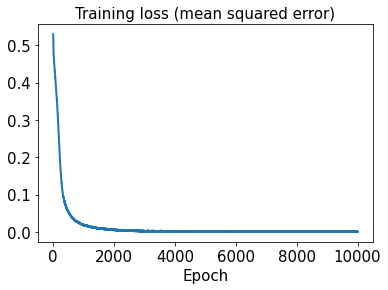

In [29]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

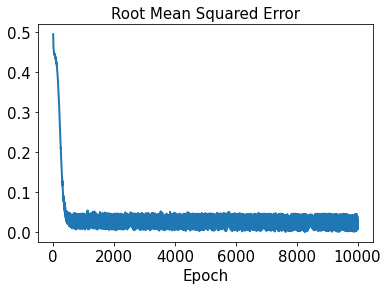

In [30]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [31]:
test_results1 = sd1.evaluate(x_test1)

1/1 [==============================] - 0s 110ms/step - loss: 3.8034e-06 - rmse: 0.0000e+00


In [32]:
decoded_sensor_train1 = sensor_pred1.predict(t_train)

In [33]:
decoded_sensor_test1 = sensor_pred1.predict(t_test)

In [34]:
decoded_train1 = sd1.predict(decoded_sensor_train1)

In [35]:
decoded_test1 = sd1.predict(decoded_sensor_test1)

In [36]:
error_train_abs1 = np.abs(decoded_train1 - y_train1)

In [37]:
error_test_abs1 = np.abs(decoded_test1 - y_test1)

In [38]:
l2_error_train1 = np.sqrt(np.sum((decoded_train1 - y_train1)**2) / np.sum(y_train1**2))
print(l2_error_train1)

0.2860942705028008


In [39]:
l2_error_test1 = np.sqrt(np.sum((decoded_test1 - y_test1)**2) / np.sum(y_test1**2))
print(l2_error_test1)

0.2939366808844398


In [40]:
l2_error_train_list1 = []
for i in range(0, len(x_train1)):
    l2_error_train_data1 = np.sqrt(np.sum((decoded_train1[i] - y_train1[i])**2) / np.sum(y_train1[i]**2))
    l2_error_train_list1.append(l2_error_train_data1)
print(l2_error_train_list1)

[0.36612138954073137, 0.3154662541557264, 0.2318603818059729, 0.39984631713574986, 0.19981081194311504, 0.4844909524544661, 0.24040048486399648, 0.4070310622350542, 0.22034387942734351, 0.37545551439458297, 0.38612616529759014, 0.024554099140423665, 0.3197489381056519, 0.2629101547535792, 0.4095503836524112, 0.06932267458698234, 0.38678317394567796, 0.030747083350320066, 0.11539461688715626, 0.4078851475420068, 0.3536739237845852, 0.1631148393424717, 0.36463780724552164, 0.08918060764364201, 0.39665100403390935, 0.44835821778035734, 0.047275993997382866, 0.17757594878442073, 0.08295057650437873, 0.3698747343882966, 0.2975743879859676, 0.3484426165999034, 0.342561909337865]


In [41]:
l2_error_test_list1 = []
for i in range(0, len(x_test1)):
    l2_error_test_data1 = np.sqrt(np.sum((decoded_test1[i] - y_test1[i])**2) / np.sum(y_test1[i]**2))
    l2_error_test_list1.append(l2_error_test_data1)
print(l2_error_test_list1)

[0.13384379971544716, 0.36600441436789555, 0.42619616513447683, 0.18136250577619462, 0.21214944345207962, 0.31989403713268494, 0.15344710918219528, 0.3313018969671408]


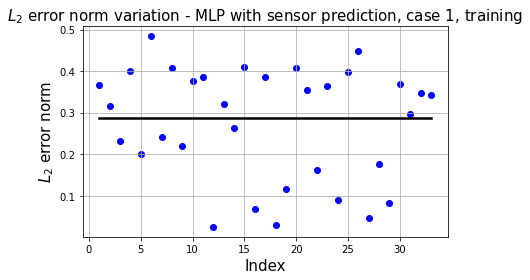

In [42]:
plt.plot(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train1*np.ones(x_train1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

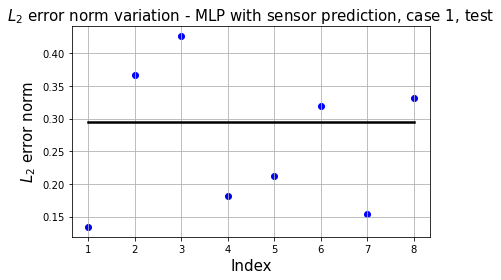

In [43]:
plt.plot(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test1*np.ones(x_test1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

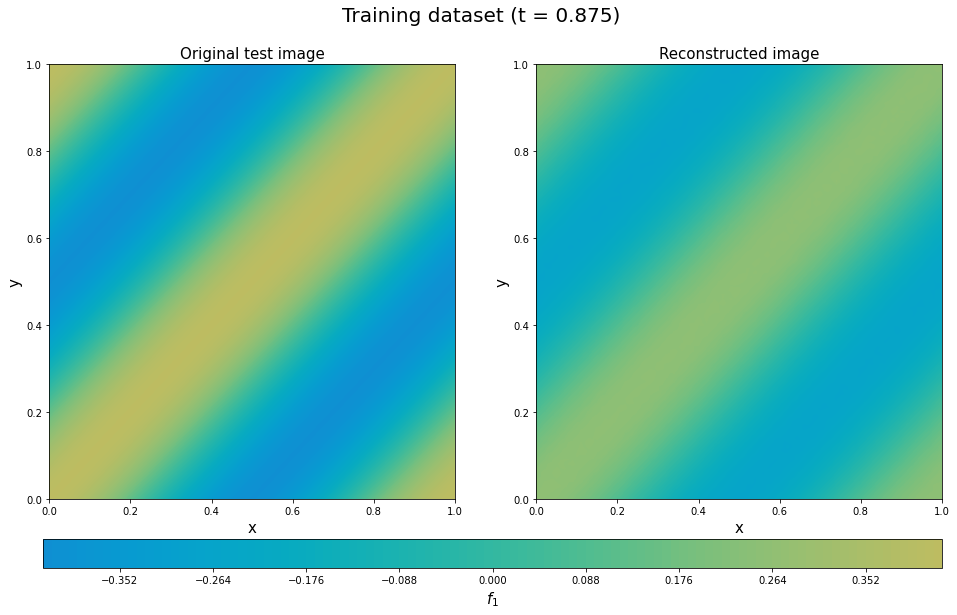

In [44]:
plt.figure(figsize=(16, 8))
y_train1_9_rotate = y_train1[9].T.reshape(101,101)
decoded_rotate1 = decoded_train1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_9_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[35]),fontsize=20)
plt.show()

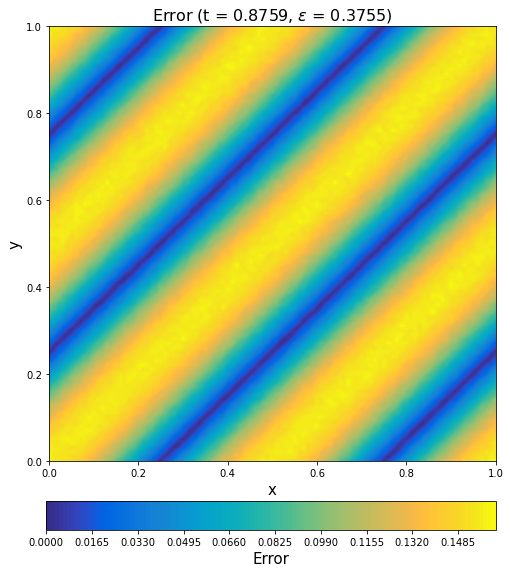

In [45]:
error_train_abs1_rotate9 = error_train_abs1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate9, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.8759, $\epsilon$ = %.4f)' %(l2_error_train_list1[9]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

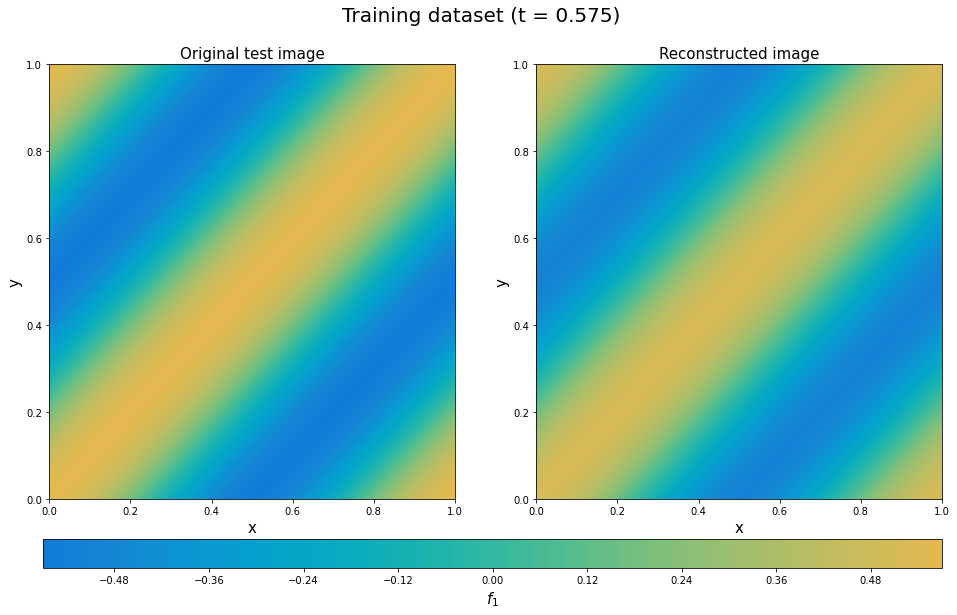

In [46]:
plt.figure(figsize=(16, 8))
y_train1_23_rotate = y_train1[23].T.reshape(101,101)
decoded_rotate1 = decoded_train1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_23_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[23]), fontsize=20)
plt.show()

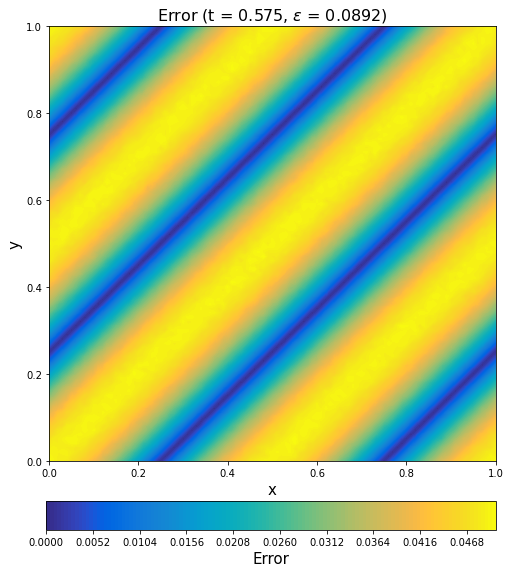

In [47]:
error_train_abs1_rotate23 = error_train_abs1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate23, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.575, $\epsilon$ = %.4f)' %(l2_error_train_list1[23]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

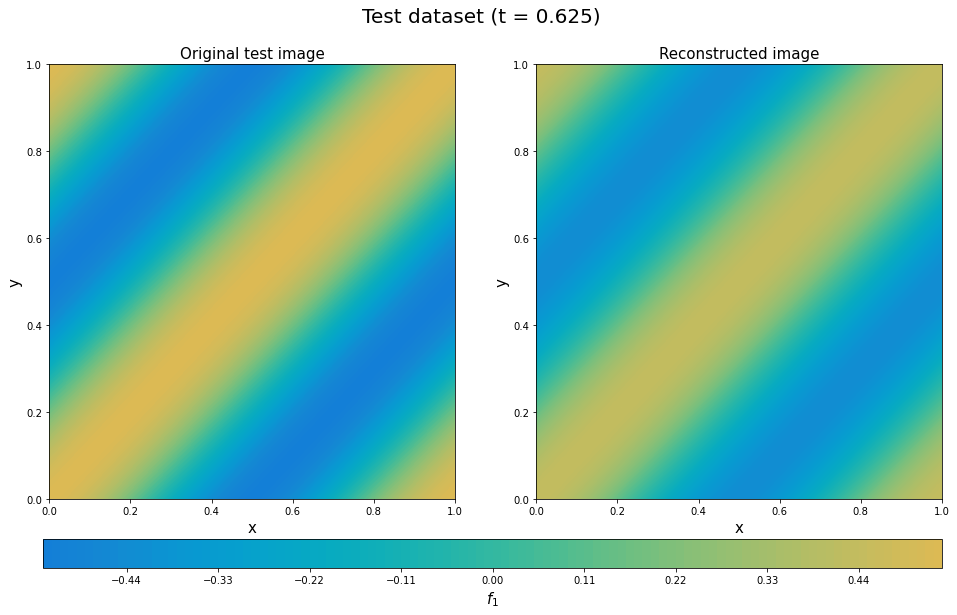

In [48]:
plt.figure(figsize=(16, 8))
y_test1_3_rotate = y_test1[3].T.reshape(101,101)
decoded_rotate1 = decoded_test1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_3_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[25]),fontsize=20)
plt.show()

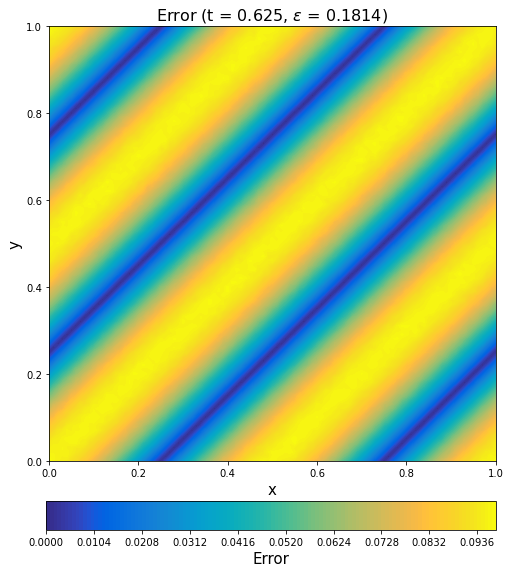

In [49]:
error_test_abs1_rotate3 = error_test_abs1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate3, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.625, $\epsilon$ = %.4f)' %(l2_error_test_list1[3]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

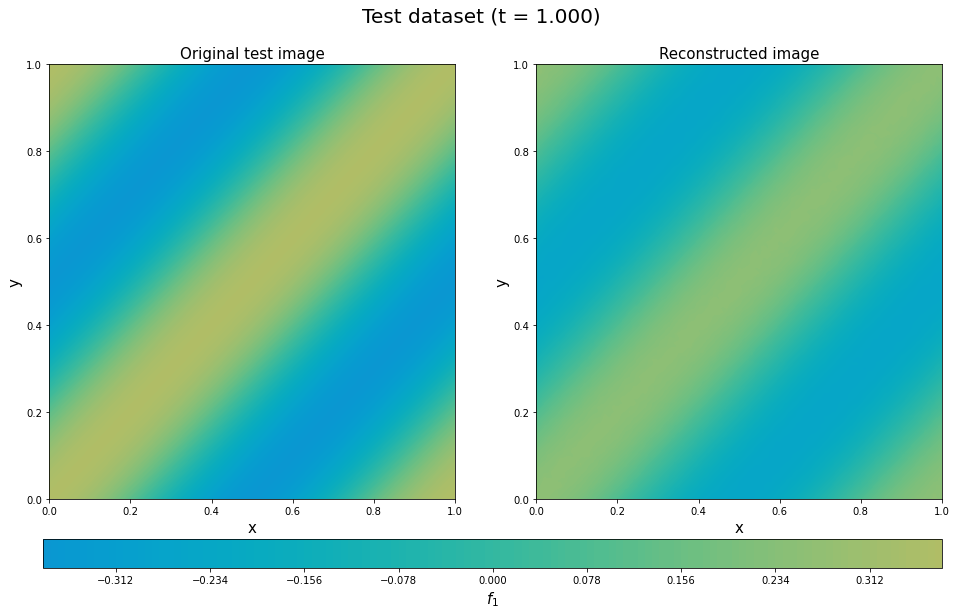

In [50]:
plt.figure(figsize=(16, 8))
y_test1_5_rotate = y_test1[5].T.reshape(101,101)
decoded_rotate1 = decoded_test1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_5_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[40]),fontsize=20)
plt.show()

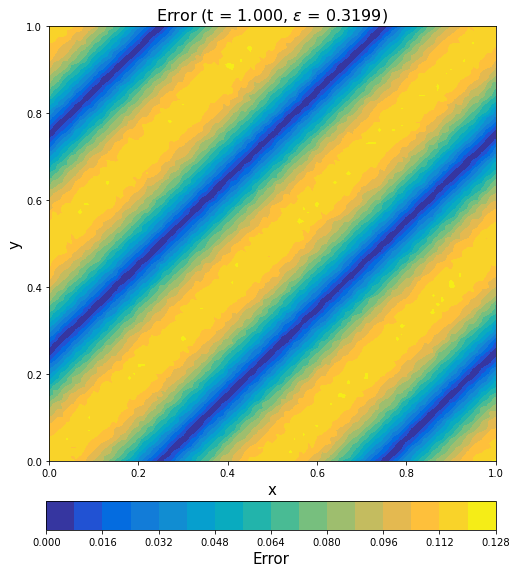

In [51]:
error_test_abs1_rotate5 = error_test_abs1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate5, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 1.000, $\epsilon$ = %.4f)' %(l2_error_test_list1[5]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 2: f2

In [52]:
out2 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out2[i, j, k] = x[j] + y[k] + t[i]

In [53]:
sensor2 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor2[i, j, k] = out2[i, 20*(j+1)+1, 20*(k+1)+1]

In [54]:
sensor2 = sensor2.reshape((41, 16, 1))

In [55]:
sensor2.shape

(41, 16, 1)

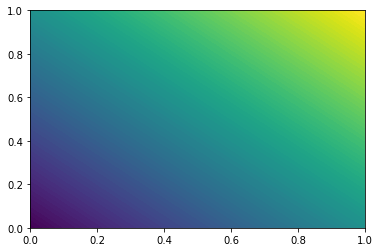

In [56]:
plt.contourf(xmesh, ymesh, out2[0,:,:], levels=128)

In [57]:
x_train2, x_test2, y_train2, y_test2, t_train, t_test = train_test_split(sensor2, out2, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [58]:
x_train2

array([[[1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945],
        [1.545],
        [1.745],
        [1.945],
        [2.145],
        [1.745],
        [1.945],
        [2.145],
        [2.345]],

       [[0.57 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.77 ]],

       [[1.07 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [2.27 ]],

       [[0.72 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [1.52 ],
        [1.12 ],
        [1.32 ],
        

In [59]:
x_test2

array([[[1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [2.22 ]],

       [[0.745],
        [0.945],
        [1.145],
        [1.345],
        [0.945],
        [1.145],
        [1.345],
        [1.545],
        [1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945]],

       [[0.62 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ]],

       [[1.045],
        [1.245],
        [1.445],
        [1.645],
        [1.245],
        [1.445],
        [1.645],
        [1.845],
        [1.445],
        [1.645],
        

In [60]:
sensor_pred2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [61]:
start2 = datetime.datetime.now()
history2 = sensor_pred2.fit(t_train, x_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 14ms/step - loss: 2.5928 - rmse: 1.6101
Epoch 2/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5899 - rmse: 1.6092
Epoch 3/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5876 - rmse: 1.6085
Epoch 4/10000
2/2 [==============================] - 0s 48ms/step - loss: 2.5854 - rmse: 1.6078
Epoch 5/10000
2/2 [==============================] - 0s 31ms/step - loss: 2.5832 - rmse: 1.6071
Epoch 6/10000
2/2 [==============================] - 0s 18ms/step - loss: 2.5812 - rmse: 1.6065
Epoch 7/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.5790 - rmse: 1.6058
Epoch 8/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.5770 - rmse: 1.6052
Epoch 9/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5752 - rmse: 1.6046
Epoch 10/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.5731 - rmse: 1.6040
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 9ms/step - loss: 2.4291 - rmse: 1.5585
Epoch 86/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.4253 - rmse: 1.5572
Epoch 87/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4253 - rmse: 1.5572
Epoch 88/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4219 - rmse: 1.5562
Epoch 89/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.4205 - rmse: 1.5557
Epoch 90/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4192 - rmse: 1.5553
Epoch 91/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.4165 - rmse: 1.5544
Epoch 92/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4151 - rmse: 1.5539
Epoch 93/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4127 - rmse: 1.5532
Epoch 94/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.4115 - rmse: 1.5528
Epoch 95/10000
2/2 [============================

2/2 [==============================] - 0s 9ms/step - loss: 2.2825 - rmse: 1.5107
Epoch 170/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2795 - rmse: 1.5097
Epoch 171/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2779 - rmse: 1.5092
Epoch 172/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2763 - rmse: 1.5086
Epoch 173/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2745 - rmse: 1.5080
Epoch 174/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2735 - rmse: 1.5077
Epoch 175/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2714 - rmse: 1.5070
Epoch 176/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2696 - rmse: 1.5064
Epoch 177/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2693 - rmse: 1.5063
Epoch 178/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2666 - rmse: 1.5054
Epoch 179/10000
2/2 [===================

2/2 [==============================] - 0s 10ms/step - loss: 2.1410 - rmse: 1.4631
Epoch 253/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1399 - rmse: 1.4627
Epoch 254/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1362 - rmse: 1.4615
Epoch 255/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1343 - rmse: 1.4608
Epoch 256/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1344 - rmse: 1.4608
Epoch 257/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1320 - rmse: 1.4600
Epoch 258/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1301 - rmse: 1.4594
Epoch 259/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1293 - rmse: 1.4591
Epoch 260/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.1274 - rmse: 1.4585
Epoch 261/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1254 - rmse: 1.4578
Epoch 262/10000
2/2 [================

2/2 [==============================] - 0s 16ms/step - loss: 1.9992 - rmse: 1.4138
Epoch 336/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.9996 - rmse: 1.4139
Epoch 337/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.9958 - rmse: 1.4126
Epoch 338/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.9938 - rmse: 1.4119
Epoch 339/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.9941 - rmse: 1.4120
Epoch 340/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.9907 - rmse: 1.4108
Epoch 341/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9896 - rmse: 1.4104
Epoch 342/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.9885 - rmse: 1.4100
Epoch 343/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.9878 - rmse: 1.4098
Epoch 344/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.9855 - rmse: 1.4090
Epoch 345/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 1.8645 - rmse: 1.3653
Epoch 419/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8597 - rmse: 1.3636
Epoch 420/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8573 - rmse: 1.3627
Epoch 421/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8568 - rmse: 1.3625
Epoch 422/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.8537 - rmse: 1.3614
Epoch 423/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8531 - rmse: 1.3611
Epoch 424/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8504 - rmse: 1.3602
Epoch 425/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8531 - rmse: 1.3612
Epoch 426/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8493 - rmse: 1.3598
Epoch 427/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8455 - rmse: 1.3583
Epoch 428/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 1.7189 - rmse: 1.3109
Epoch 502/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7175 - rmse: 1.3104
Epoch 503/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7176 - rmse: 1.3104
Epoch 504/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7139 - rmse: 1.3090
Epoch 505/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7121 - rmse: 1.3083
Epoch 506/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7142 - rmse: 1.3092
Epoch 507/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7138 - rmse: 1.3090
Epoch 508/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7067 - rmse: 1.3063
Epoch 509/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7104 - rmse: 1.3077
Epoch 510/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7059 - rmse: 1.3060
Epoch 511/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 1.5824 - rmse: 1.2578
Epoch 585/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5815 - rmse: 1.2574
Epoch 586/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5787 - rmse: 1.2563
Epoch 587/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5781 - rmse: 1.2561
Epoch 588/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5796 - rmse: 1.2567
Epoch 589/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5734 - rmse: 1.2542
Epoch 590/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5720 - rmse: 1.2537
Epoch 591/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5712 - rmse: 1.2533
Epoch 592/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5686 - rmse: 1.2523
Epoch 593/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5679 - rmse: 1.2520
Epoch 594/10000
2/2 [================

2/2 [==============================] - 0s 12ms/step - loss: 1.4509 - rmse: 1.2044
Epoch 668/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4488 - rmse: 1.2035
Epoch 669/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4476 - rmse: 1.2030
Epoch 670/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4438 - rmse: 1.2014
Epoch 671/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4423 - rmse: 1.2008
Epoch 672/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4393 - rmse: 1.1996
Epoch 673/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4421 - rmse: 1.2007
Epoch 674/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4428 - rmse: 1.2010
Epoch 675/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4411 - rmse: 1.2003
Epoch 676/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4369 - rmse: 1.1985
Epoch 677/10000
2/2 [==================

2/2 [==============================] - 0s 14ms/step - loss: 1.3188 - rmse: 1.1482
Epoch 751/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3191 - rmse: 1.1484
Epoch 752/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3190 - rmse: 1.1483
Epoch 753/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.3176 - rmse: 1.1477
Epoch 754/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3167 - rmse: 1.1473
Epoch 755/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3155 - rmse: 1.1468
Epoch 756/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3100 - rmse: 1.1444
Epoch 757/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3099 - rmse: 1.1443
Epoch 758/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.3117 - rmse: 1.1452
Epoch 759/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3057 - rmse: 1.1425
Epoch 760/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 1.1930 - rmse: 1.0921
Epoch 834/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.1915 - rmse: 1.0914
Epoch 835/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.1905 - rmse: 1.0910
Epoch 836/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.1887 - rmse: 1.0901
Epoch 837/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.1890 - rmse: 1.0903
Epoch 838/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.1856 - rmse: 1.0887
Epoch 839/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.1861 - rmse: 1.0889
Epoch 840/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.1833 - rmse: 1.0876
Epoch 841/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.1808 - rmse: 1.0865
Epoch 842/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.1804 - rmse: 1.0863
Epoch 843/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 1.0761 - rmse: 1.0372
Epoch 917/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.0712 - rmse: 1.0348
Epoch 918/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.0689 - rmse: 1.0337
Epoch 919/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0672 - rmse: 1.0329
Epoch 920/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0654 - rmse: 1.0320
Epoch 921/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.0640 - rmse: 1.0314
Epoch 922/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.0665 - rmse: 1.0326
Epoch 923/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.0673 - rmse: 1.0329
Epoch 924/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0613 - rmse: 1.0300
Epoch 925/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0596 - rmse: 1.0292
Epoch 926/10000
2/2 [===================

2/2 [==============================] - 0s 11ms/step - loss: 0.9558 - rmse: 0.9775
Epoch 1000/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.9553 - rmse: 0.9772
Epoch 1001/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.9537 - rmse: 0.9764
Epoch 1002/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.9570 - rmse: 0.9781
Epoch 1003/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.9508 - rmse: 0.9749
Epoch 1004/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.9525 - rmse: 0.9758
Epoch 1005/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9485 - rmse: 0.9737
Epoch 1006/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9471 - rmse: 0.9730
Epoch 1007/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.9479 - rmse: 0.9735
Epoch 1008/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9501 - rmse: 0.9746
Epoch 1009/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.8506 - rmse: 0.9221
Epoch 1082/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.8500 - rmse: 0.9218
Epoch 1083/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.8540 - rmse: 0.9239
Epoch 1084/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8482 - rmse: 0.9208
Epoch 1085/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.8488 - rmse: 0.9212
Epoch 1086/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.8463 - rmse: 0.9198
Epoch 1087/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.8467 - rmse: 0.9200
Epoch 1088/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8431 - rmse: 0.9180
Epoch 1089/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.8416 - rmse: 0.9172
Epoch 1090/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.8373 - rmse: 0.9149
Epoch 1091/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.7522 - rmse: 0.8671
Epoch 1164/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.7490 - rmse: 0.8653
Epoch 1165/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.7535 - rmse: 0.8678
Epoch 1166/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7447 - rmse: 0.8628
Epoch 1167/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.7443 - rmse: 0.8625
Epoch 1168/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.7432 - rmse: 0.8619
Epoch 1169/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.7431 - rmse: 0.8618
Epoch 1170/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.7412 - rmse: 0.8608
Epoch 1171/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7388 - rmse: 0.8594
Epoch 1172/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.7393 - rmse: 0.8597
Epoch 1173/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.6587 - rmse: 0.8114
Epoch 1246/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.6567 - rmse: 0.8102
Epoch 1247/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.6578 - rmse: 0.8109
Epoch 1248/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.6617 - rmse: 0.8133
Epoch 1249/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.6579 - rmse: 0.8109
Epoch 1250/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6552 - rmse: 0.8092
Epoch 1251/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.6555 - rmse: 0.8095
Epoch 1252/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.6560 - rmse: 0.8098
Epoch 1253/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.6552 - rmse: 0.8093
Epoch 1254/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.6496 - rmse: 0.8058
Epoch 1255/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.5788 - rmse: 0.7606
Epoch 1328/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5756 - rmse: 0.7585
Epoch 1329/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5782 - rmse: 0.7602
Epoch 1330/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5758 - rmse: 0.7586
Epoch 1331/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5697 - rmse: 0.7546
Epoch 1332/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5701 - rmse: 0.7548
Epoch 1333/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5689 - rmse: 0.7541
Epoch 1334/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5668 - rmse: 0.7527
Epoch 1335/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5660 - rmse: 0.7521
Epoch 1336/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5646 - rmse: 0.7512
Epoch 1337/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.5047 - rmse: 0.7102
Epoch 1410/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4976 - rmse: 0.7052
Epoch 1411/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4990 - rmse: 0.7062
Epoch 1412/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4959 - rmse: 0.7040
Epoch 1413/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.4964 - rmse: 0.7043
Epoch 1414/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4939 - rmse: 0.7026
Epoch 1415/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4944 - rmse: 0.7029
Epoch 1416/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4938 - rmse: 0.7025
Epoch 1417/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4928 - rmse: 0.7018
Epoch 1418/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4917 - rmse: 0.7010
Epoch 1419/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.4376 - rmse: 0.6613
Epoch 1492/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4320 - rmse: 0.6571
Epoch 1493/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4298 - rmse: 0.6553
Epoch 1494/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4309 - rmse: 0.6562
Epoch 1495/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4294 - rmse: 0.6551
Epoch 1496/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4275 - rmse: 0.6537
Epoch 1497/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4266 - rmse: 0.6529
Epoch 1498/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4319 - rmse: 0.6570
Epoch 1499/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4252 - rmse: 0.6518
Epoch 1500/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4243 - rmse: 0.6512
Epoch 1501/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.3703 - rmse: 0.6083
Epoch 1575/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3756 - rmse: 0.6126
Epoch 1576/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3705 - rmse: 0.6085
Epoch 1577/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3707 - rmse: 0.6086
Epoch 1578/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3669 - rmse: 0.6055
Epoch 1579/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3663 - rmse: 0.6050
Epoch 1580/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3668 - rmse: 0.6054
Epoch 1581/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3663 - rmse: 0.6050
Epoch 1582/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3632 - rmse: 0.6024
Epoch 1583/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3627 - rmse: 0.6020
Epoch 1584/10000
2/2 [=========

Epoch 1657/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3137 - rmse: 0.5599
Epoch 1658/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3153 - rmse: 0.5612
Epoch 1659/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3136 - rmse: 0.5597
Epoch 1660/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3149 - rmse: 0.5609
Epoch 1661/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3160 - rmse: 0.5619
Epoch 1662/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3101 - rmse: 0.5566
Epoch 1663/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.3147 - rmse: 0.5607
Epoch 1664/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.3078 - rmse: 0.5545
Epoch 1665/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3090 - rmse: 0.5557
Epoch 1666/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3064 - rmse: 0.5533
Epoch 1667

2/2 [==============================] - 0s 15ms/step - loss: 0.2690 - rmse: 0.5184
Epoch 1740/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2669 - rmse: 0.5164
Epoch 1741/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2662 - rmse: 0.5157
Epoch 1742/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2624 - rmse: 0.5119
Epoch 1743/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2642 - rmse: 0.5137
Epoch 1744/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2596 - rmse: 0.5092
Epoch 1745/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2623 - rmse: 0.5119
Epoch 1746/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2629 - rmse: 0.5125
Epoch 1747/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2623 - rmse: 0.5119
Epoch 1748/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2585 - rmse: 0.5082
Epoch 1749/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.2204 - rmse: 0.4691
Epoch 1822/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2237 - rmse: 0.4726
Epoch 1823/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2195 - rmse: 0.4682
Epoch 1824/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2209 - rmse: 0.4697
Epoch 1825/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2227 - rmse: 0.4716
Epoch 1826/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2202 - rmse: 0.4690
Epoch 1827/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2177 - rmse: 0.4663
Epoch 1828/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2171 - rmse: 0.4656
Epoch 1829/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2202 - rmse: 0.4690
Epoch 1830/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2176 - rmse: 0.4661
Epoch 1831/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.1848 - rmse: 0.4296
Epoch 1904/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1887 - rmse: 0.4341
Epoch 1905/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1831 - rmse: 0.4275
Epoch 1906/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1844 - rmse: 0.4291
Epoch 1907/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1880 - rmse: 0.4333
Epoch 1908/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1828 - rmse: 0.4272
Epoch 1909/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1840 - rmse: 0.4287
Epoch 1910/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1815 - rmse: 0.4257
Epoch 1911/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1812 - rmse: 0.4253
Epoch 1912/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1858 - rmse: 0.4307
Epoch 1913/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.1517 - rmse: 0.3892
Epoch 1986/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1539 - rmse: 0.3919
Epoch 1987/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1515 - rmse: 0.3889
Epoch 1988/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1527 - rmse: 0.3905
Epoch 1989/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1501 - rmse: 0.3870
Epoch 1990/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1508 - rmse: 0.3880
Epoch 1991/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1493 - rmse: 0.3861
Epoch 1992/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1497 - rmse: 0.3866
Epoch 1993/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1522 - rmse: 0.3898
Epoch 1994/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1481 - rmse: 0.3845
Epoch 1995/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.1268 - rmse: 0.3557
Epoch 2068/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1245 - rmse: 0.3525
Epoch 2069/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1264 - rmse: 0.3552
Epoch 2070/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1246 - rmse: 0.3526
Epoch 2071/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1240 - rmse: 0.3518
Epoch 2072/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1235 - rmse: 0.3510
Epoch 2073/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1233 - rmse: 0.3508
Epoch 2074/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1219 - rmse: 0.3488
Epoch 2075/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1220 - rmse: 0.3489
Epoch 2076/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1202 - rmse: 0.3463
Epoch 2077/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1005 - rmse: 0.3166
Epoch 2150/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1044 - rmse: 0.3227
Epoch 2151/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1048 - rmse: 0.3234
Epoch 2152/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1024 - rmse: 0.3195
Epoch 2153/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1037 - rmse: 0.3216
Epoch 2154/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1044 - rmse: 0.3228
Epoch 2155/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0989 - rmse: 0.3141
Epoch 2156/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0995 - rmse: 0.3151
Epoch 2157/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1033 - rmse: 0.3210
Epoch 2158/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1035 - rmse: 0.3214
Epoch 2159/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0812 - rmse: 0.2845
Epoch 2232/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0814 - rmse: 0.2849
Epoch 2233/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0799 - rmse: 0.2823
Epoch 2234/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0795 - rmse: 0.2815
Epoch 2235/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0838 - rmse: 0.2890
Epoch 2236/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0824 - rmse: 0.2866
Epoch 2237/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0802 - rmse: 0.2828
Epoch 2238/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0821 - rmse: 0.2860
Epoch 2239/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0784 - rmse: 0.2796
Epoch 2240/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0809 - rmse: 0.2840
Epoch 2241/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0686 - rmse: 0.2615
Epoch 2314/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0641 - rmse: 0.2526
Epoch 2315/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0685 - rmse: 0.2613
Epoch 2316/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0637 - rmse: 0.2519
Epoch 2317/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0637 - rmse: 0.2520
Epoch 2318/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0629 - rmse: 0.2503
Epoch 2319/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0679 - rmse: 0.2600
Epoch 2320/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0633 - rmse: 0.2510
Epoch 2321/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0623 - rmse: 0.2491
Epoch 2322/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0653 - rmse: 0.2550
Epoch 2323/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0513 - rmse: 0.2258
Epoch 2396/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0541 - rmse: 0.2320
Epoch 2397/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0503 - rmse: 0.2237
Epoch 2398/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0559 - rmse: 0.2359
Epoch 2399/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0531 - rmse: 0.2299
Epoch 2400/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0554 - rmse: 0.2348
Epoch 2401/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0497 - rmse: 0.2223
Epoch 2402/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0549 - rmse: 0.2339
Epoch 2403/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0504 - rmse: 0.2239
Epoch 2404/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0527 - rmse: 0.2289
Epoch 2405/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0400 - rmse: 0.1995
Epoch 2478/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0445 - rmse: 0.2104
Epoch 2479/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0446 - rmse: 0.2105
Epoch 2480/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0387 - rmse: 0.1960
Epoch 2481/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0420 - rmse: 0.2044
Epoch 2482/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0384 - rmse: 0.1954
Epoch 2483/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0395 - rmse: 0.1981
Epoch 2484/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0401 - rmse: 0.1996
Epoch 2485/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0408 - rmse: 0.2014
Epoch 2486/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0379 - rmse: 0.1939
Epoch 2487/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0361 - rmse: 0.1893
Epoch 2560/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0369 - rmse: 0.1915
Epoch 2561/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0324 - rmse: 0.1793
Epoch 2562/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0308 - rmse: 0.1747
Epoch 2563/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0334 - rmse: 0.1821
Epoch 2564/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0344 - rmse: 0.1848
Epoch 2565/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0306 - rmse: 0.1741
Epoch 2566/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0307 - rmse: 0.1744
Epoch 2567/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0365 - rmse: 0.1903
Epoch 2568/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0305 - rmse: 0.1740
Epoch 2569/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0233 - rmse: 0.1520
Epoch 2642/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0238 - rmse: 0.1535
Epoch 2643/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0232 - rmse: 0.1514
Epoch 2644/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0250 - rmse: 0.1573
Epoch 2645/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0269 - rmse: 0.1634
Epoch 2646/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0290 - rmse: 0.1697
Epoch 2647/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0225 - rmse: 0.1493
Epoch 2648/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0226 - rmse: 0.1497
Epoch 2649/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0227 - rmse: 0.1499
Epoch 2650/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0232 - rmse: 0.1516
Epoch 2651/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0207 - rmse: 0.1429
Epoch 2724/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0206 - rmse: 0.1425
Epoch 2725/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0173 - rmse: 0.1304
Epoch 2726/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0200 - rmse: 0.1404
Epoch 2727/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0181 - rmse: 0.1336
Epoch 2728/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0170 - rmse: 0.1295
Epoch 2729/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0182 - rmse: 0.1341
Epoch 2730/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0233 - rmse: 0.1518
Epoch 2731/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0231 - rmse: 0.1512
Epoch 2732/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0225 - rmse: 0.1491
Epoch 2733/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0132 - rmse: 0.1140
Epoch 2806/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0152 - rmse: 0.1223
Epoch 2807/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0149 - rmse: 0.1209
Epoch 2808/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0146 - rmse: 0.1197
Epoch 2809/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0164 - rmse: 0.1273
Epoch 2810/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0136 - rmse: 0.1155
Epoch 2811/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0191 - rmse: 0.1372
Epoch 2812/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0149 - rmse: 0.1212
Epoch 2813/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0132 - rmse: 0.1140
Epoch 2814/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0148 - rmse: 0.1208
Epoch 2815/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0118 - rmse: 0.1075
Epoch 2888/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0108 - rmse: 0.1026
Epoch 2889/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0141 - rmse: 0.1177
Epoch 2890/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0113 - rmse: 0.1050
Epoch 2891/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0102 - rmse: 0.0996
Epoch 2892/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0103 - rmse: 0.1002
Epoch 2893/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0176 - rmse: 0.1318
Epoch 2894/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0138 - rmse: 0.1164
Epoch 2895/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0103 - rmse: 0.1002
Epoch 2896/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0105 - rmse: 0.1015
Epoch 2897/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0081 - rmse: 0.0884
Epoch 2970/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0120 - rmse: 0.1085
Epoch 2971/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0118 - rmse: 0.1075
Epoch 2972/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0919
Epoch 2973/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0117 - rmse: 0.1069
Epoch 2974/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0130 - rmse: 0.1129
Epoch 2975/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0083 - rmse: 0.0898
Epoch 2976/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0862
Epoch 2977/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0081 - rmse: 0.0884
Epoch 2978/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0076 - rmse: 0.0858
Epoch 2979/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0099 - rmse: 0.0985
Epoch 3052/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0078 - rmse: 0.0872
Epoch 3053/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0118 - rmse: 0.1077
Epoch 3054/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0745
Epoch 3055/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0110 - rmse: 0.1037
Epoch 3056/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0096 - rmse: 0.0969
Epoch 3057/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0764
Epoch 3058/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0122 - rmse: 0.1093
Epoch 3059/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0090 - rmse: 0.0938
Epoch 3060/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0109 - rmse: 0.1032
Epoch 3061/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0081 - rmse: 0.0885
Epoch 3134/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0046 - rmse: 0.0662
Epoch 3135/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0806
Epoch 3136/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0773
Epoch 3137/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0084 - rmse: 0.0904
Epoch 3138/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0057 - rmse: 0.0736
Epoch 3139/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0647
Epoch 3140/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0779
Epoch 3141/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0086 - rmse: 0.0916
Epoch 3142/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0668
Epoch 3143/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0879
Epoch 3216/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0716
Epoch 3217/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0613
Epoch 3218/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0052 - rmse: 0.0705
Epoch 3219/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0611
Epoch 3220/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0625
Epoch 3221/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0106 - rmse: 0.1019
Epoch 3222/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0767
Epoch 3223/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0623
Epoch 3224/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0097 - rmse: 0.0973
Epoch 3225/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0067 - rmse: 0.0802
Epoch 3298/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0576
Epoch 3299/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0564
Epoch 3300/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0066 - rmse: 0.0800
Epoch 3301/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0063 - rmse: 0.0778
Epoch 3302/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0660
Epoch 3303/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0049 - rmse: 0.0686
Epoch 3304/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0065 - rmse: 0.0795
Epoch 3305/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0032 - rmse: 0.0546
Epoch 3306/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0795
Epoch 3307/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0074 - rmse: 0.0844
Epoch 3380/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0587
Epoch 3381/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0513
Epoch 3382/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0090 - rmse: 0.0935
Epoch 3383/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0099 - rmse: 0.0986
Epoch 3384/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0487
Epoch 3385/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0085 - rmse: 0.0908
Epoch 3386/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0493
Epoch 3387/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0092 - rmse: 0.0947
Epoch 3388/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0730
Epoch 3389/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0448
Epoch 3462/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0608
Epoch 3463/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0075 - rmse: 0.0852
Epoch 3464/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0455
Epoch 3465/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0578
Epoch 3466/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0544
Epoch 3467/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0453
Epoch 3468/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0805
Epoch 3469/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0088 - rmse: 0.0927
Epoch 3470/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0590
Epoch 3471/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0616
Epoch 3544/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0604
Epoch 3545/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0084 - rmse: 0.0903
Epoch 3546/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0450
Epoch 3547/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0429
Epoch 3548/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0069 - rmse: 0.0820
Epoch 3549/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0092 - rmse: 0.0949
Epoch 3550/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0439
Epoch 3551/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0052 - rmse: 0.0706
Epoch 3552/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0717
Epoch 3553/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0083 - rmse: 0.0900
Epoch 3626/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0808
Epoch 3627/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0729
Epoch 3628/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0522
Epoch 3629/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0588
Epoch 3630/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0768
Epoch 3631/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0080 - rmse: 0.0884
Epoch 3632/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0058 - rmse: 0.0746
Epoch 3633/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0393
Epoch 3634/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0404
Epoch 3635/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0381
Epoch 3708/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0358
Epoch 3709/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0049 - rmse: 0.0682
Epoch 3710/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0357
Epoch 3711/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0082 - rmse: 0.0890
Epoch 3712/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0410
Epoch 3713/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0428
Epoch 3714/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0356
Epoch 3715/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0357
Epoch 3716/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0447
Epoch 3717/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0412
Epoch 3790/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0671
Epoch 3791/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0412
Epoch 3792/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0047 - rmse: 0.0671
Epoch 3793/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0431
Epoch 3794/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0460
Epoch 3795/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0071 - rmse: 0.0830
Epoch 3796/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0052 - rmse: 0.0708
Epoch 3797/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0671
Epoch 3798/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0024 - rmse: 0.0461
Epoch 3799/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0325
Epoch 3872/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0637
Epoch 3873/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0491
Epoch 3874/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0825
Epoch 3875/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0052 - rmse: 0.0703
Epoch 3876/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0330
Epoch 3877/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0332
Epoch 3878/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0486
Epoch 3879/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0052 - rmse: 0.0707
Epoch 3880/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0355
Epoch 3881/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0406
Epoch 3954/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0050 - rmse: 0.0694
Epoch 3955/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0359
Epoch 3956/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0076 - rmse: 0.0858
Epoch 3957/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0514
Epoch 3958/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0062 - rmse: 0.0774
Epoch 3959/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0298
Epoch 3960/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0550
Epoch 3961/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0504
Epoch 3962/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0382
Epoch 3963/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0395
Epoch 4036/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0283
Epoch 4037/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0010 - rmse: 0.0284
Epoch 4038/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0320
Epoch 4039/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0393
Epoch 4040/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0700
Epoch 4041/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0620
Epoch 4042/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0041 - rmse: 0.0619
Epoch 4043/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0322
Epoch 4044/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0571
Epoch 4045/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0782
Epoch 4118/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0647
Epoch 4119/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0508
Epoch 4120/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0051 - rmse: 0.0698
Epoch 4121/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0608
Epoch 4122/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0822
Epoch 4123/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0317
Epoch 4124/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0046 - rmse: 0.0658
Epoch 4125/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.8136e-04 - rmse: 0.0275
Epoch 4126/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0868
Epoch 4127/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0295
Epoch 4200/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0321
Epoch 4201/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0417
Epoch 4202/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0452
Epoch 4203/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.7347e-04 - rmse: 0.0274
Epoch 4204/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0479
Epoch 4205/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0442
Epoch 4206/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0607
Epoch 4207/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.4179e-04 - rmse: 0.0248
Epoch 4208/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.4102e-04 - rmse: 0.0268
Epoch 4209/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0415
Epoch 4282/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0606
Epoch 4283/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0076 - rmse: 0.0858
Epoch 4284/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0636
Epoch 4285/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0677
Epoch 4286/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0492
Epoch 4287/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0445
Epoch 4288/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0638
Epoch 4289/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0636
Epoch 4290/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0074 - rmse: 0.0844
Epoch 4291/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0053 - rmse: 0.0714
Epoch 4364/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0524
Epoch 4365/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0550
Epoch 4366/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0444
Epoch 4367/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0446
Epoch 4368/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0600
Epoch 4369/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0766
Epoch 4370/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.1622e-04 - rmse: 0.0243
Epoch 4371/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0082 - rmse: 0.0895
Epoch 4372/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0342
Epoch 4373/10000
2/2 [=

2/2 [==============================] - 0s 16ms/step - loss: 0.0037 - rmse: 0.0586
Epoch 4446/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.6981e-04 - rmse: 0.0234
Epoch 4447/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0466
Epoch 4448/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0669
Epoch 4449/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0401
Epoch 4450/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0463
Epoch 4451/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.2563e-04 - rmse: 0.0246
Epoch 4452/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0595
Epoch 4453/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0294
Epoch 4454/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0424
Epoch 4455/10000
2/

2/2 [==============================] - 0s 14ms/step - loss: 8.4977e-04 - rmse: 0.0251
Epoch 4528/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0511
Epoch 4529/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0321
Epoch 4530/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.4121e-04 - rmse: 0.0205
Epoch 4531/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0060 - rmse: 0.0760
Epoch 4532/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.7490e-04 - rmse: 0.0235
Epoch 4533/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0046 - rmse: 0.0665
Epoch 4534/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0060 - rmse: 0.0760
Epoch 4535/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.8232e-04 - rmse: 0.0215
Epoch 4536/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0024 - rmse: 0.0472
Epoch 4537/

2/2 [==============================] - 0s 14ms/step - loss: 0.0073 - rmse: 0.0844
Epoch 4610/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0429
Epoch 4611/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0429
Epoch 4612/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0676
Epoch 4613/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.8953e-04 - rmse: 0.0216
Epoch 4614/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0046 - rmse: 0.0664
Epoch 4615/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0460
Epoch 4616/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0622
Epoch 4617/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0067 - rmse: 0.0802
Epoch 4618/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0385
Epoch 4619/10000
2/2 [=

Epoch 4691/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.1383e-04 - rmse: 0.0222
Epoch 4692/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0788
Epoch 4693/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0453
Epoch 4694/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0071 - rmse: 0.0831
Epoch 4695/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0035 - rmse: 0.0574
Epoch 4696/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0066 - rmse: 0.0798
Epoch 4697/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0385
Epoch 4698/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0657
Epoch 4699/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.7346e-04 - rmse: 0.0213
Epoch 4700/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0489
Ep

2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0443
Epoch 4773/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0051 - rmse: 0.0696
Epoch 4774/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0610
Epoch 4775/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0414
Epoch 4776/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0045 - rmse: 0.0652
Epoch 4777/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0442
Epoch 4778/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0400
Epoch 4779/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0412
Epoch 4780/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0695
Epoch 4781/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0566
Epoch 4782/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0072 - rmse: 0.0835
Epoch 4855/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0618
Epoch 4856/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0576
Epoch 4857/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0063 - rmse: 0.0779
Epoch 4858/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.6400e-04 - rmse: 0.0211
Epoch 4859/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.8858e-04 - rmse: 0.0217
Epoch 4860/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0367
Epoch 4861/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0397
Epoch 4862/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0607
Epoch 4863/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0316
Epoch 4864/10000
2/

2/2 [==============================] - 0s 14ms/step - loss: 0.0063 - rmse: 0.0779
Epoch 4936/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0406
Epoch 4937/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0790
Epoch 4938/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0448
Epoch 4939/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0478
Epoch 4940/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0353
Epoch 4941/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0748
Epoch 4942/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0035 - rmse: 0.0574
Epoch 4943/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.6756e-04 - rmse: 0.0212
Epoch 4944/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0446
Epoch 4945/10000
2/2 [=

2/2 [==============================] - 0s 14ms/step - loss: 4.7366e-04 - rmse: 0.0161
Epoch 5018/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0667
Epoch 5019/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0298
Epoch 5020/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.1869e-04 - rmse: 0.0201
Epoch 5021/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0065 - rmse: 0.0795
Epoch 5022/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0741
Epoch 5023/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.6776e-04 - rmse: 0.0213
Epoch 5024/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.5707e-04 - rmse: 0.0210
Epoch 5025/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0073 - rmse: 0.0842
Epoch 5026/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0303
Epoch 5027/

Epoch 5099/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0049 - rmse: 0.0687
Epoch 5100/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5661e-04 - rmse: 0.0119
Epoch 5101/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0062 - rmse: 0.0774
Epoch 5102/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0069 - rmse: 0.0817
Epoch 5103/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0347
Epoch 5104/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0730
Epoch 5105/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0346
Epoch 5106/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0558
Epoch 5107/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7926e-04 - rmse: 0.0163
Epoch 5108/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0072 - rmse: 0.0834
Ep

2/2 [==============================] - 0s 16ms/step - loss: 0.0045 - rmse: 0.0655
Epoch 5181/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.3422e-04 - rmse: 0.0205
Epoch 5182/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0656
Epoch 5183/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0499
Epoch 5184/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0488
Epoch 5185/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.5337e-04 - rmse: 0.0184
Epoch 5186/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.3674e-04 - rmse: 0.0229
Epoch 5187/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0331
Epoch 5188/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0370
Epoch 5189/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0532
Epoch 5190/1000

2/2 [==============================] - 0s 13ms/step - loss: 6.3273e-04 - rmse: 0.0205
Epoch 5262/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.2631e-04 - rmse: 0.0203
Epoch 5263/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0607
Epoch 5264/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0649
Epoch 5265/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0396
Epoch 5266/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0070 - rmse: 0.0823
Epoch 5267/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.9742e-04 - rmse: 0.0169
Epoch 5268/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0293
Epoch 5269/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0484
Epoch 5270/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0485
Epoch 5271/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.0050 - rmse: 0.0692
Epoch 5343/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0524
Epoch 5344/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0608
Epoch 5345/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0409
Epoch 5346/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0452
Epoch 5347/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0483
Epoch 5348/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0826
Epoch 5349/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0373
Epoch 5350/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0497
Epoch 5351/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.2524e-04 - rmse: 0.0177
Epoch 5352/10000
2/2 [=

2/2 [==============================] - 0s 14ms/step - loss: 0.0071 - rmse: 0.0828
Epoch 5424/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0437
Epoch 5425/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0554
Epoch 5426/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.3121e-04 - rmse: 0.0149
Epoch 5427/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0069 - rmse: 0.0818
Epoch 5428/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0478
Epoch 5429/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0069 - rmse: 0.0816
Epoch 5430/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.6180e-04 - rmse: 0.0159
Epoch 5431/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.2383e-04 - rmse: 0.0177
Epoch 5432/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0610
Epoch 5433/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0616
Epoch 5506/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0476
Epoch 5507/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0021 - rmse: 0.0434
Epoch 5508/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.2700e-04 - rmse: 0.0148
Epoch 5509/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.3101e-04 - rmse: 0.0149
Epoch 5510/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0563
Epoch 5511/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0563
Epoch 5512/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0029 - rmse: 0.0521
Epoch 5513/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0607
Epoch 5514/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.8208e-04 - rmse: 0.0194
Epoch 5515/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0729
Epoch 5587/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0078 - rmse: 0.0871
Epoch 5588/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0651
Epoch 5589/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.1059e-04 - rmse: 0.0102
Epoch 5590/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.8584e-04 - rmse: 0.0219
Epoch 5591/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0827
Epoch 5592/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0508
Epoch 5593/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0606
Epoch 5594/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0826
Epoch 5595/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0683
Epoch 5596/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0870
Epoch 5669/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.7384e-04 - rmse: 0.0259
Epoch 5670/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0010 - rmse: 0.0290
Epoch 5671/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.7460e-04 - rmse: 0.0164
Epoch 5672/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.1146e-04 - rmse: 0.0175
Epoch 5673/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0814
Epoch 5674/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0650
Epoch 5675/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0607
Epoch 5676/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0562
Epoch 5677/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0550
Epoch 5678/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0769
Epoch 5751/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0344
Epoch 5752/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.5445e-04 - rmse: 0.0123
Epoch 5753/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.8311e-04 - rmse: 0.0090
Epoch 5754/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0475
Epoch 5755/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0048 - rmse: 0.0682
Epoch 5756/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.7537e-04 - rmse: 0.0218
Epoch 5757/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.7756e-04 - rmse: 0.0166
Epoch 5758/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0418
Epoch 5759/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0332
Epoch 5760/

2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0729
Epoch 5832/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.9653e-04 - rmse: 0.0098
Epoch 5833/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.1403e-04 - rmse: 0.0177
Epoch 5834/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0393
Epoch 5835/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0741
Epoch 5836/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.6040e-04 - rmse: 0.0190
Epoch 5837/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0078 - rmse: 0.0873
Epoch 5838/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0078 - rmse: 0.0873
Epoch 5839/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0731
Epoch 5840/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0483
Epoch 5841/1000

2/2 [==============================] - 0s 15ms/step - loss: 2.8694e-04 - rmse: 0.0094
Epoch 5914/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0055 - rmse: 0.0725
Epoch 5915/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0768
Epoch 5916/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0681
Epoch 5917/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.0329e-04 - rmse: 0.0175
Epoch 5918/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0386
Epoch 5919/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0375
Epoch 5920/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.6854e-04 - rmse: 0.0084
Epoch 5921/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.5169e-04 - rmse: 0.0213
Epoch 5922/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.5550e-04 - rmse: 0.0256
Epoch 5

2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0650
Epoch 5996/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0024 - rmse: 0.0474
Epoch 5997/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.7674e-04 - rmse: 0.0090
Epoch 5998/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0827
Epoch 5999/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.9409e-04 - rmse: 0.0099
Epoch 6000/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0737
Epoch 6001/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.0133e-04 - rmse: 0.0175
Epoch 6002/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.5299e-04 - rmse: 0.0214
Epoch 6003/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8482e-04 - rmse: 0.0094
Epoch 6004/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0024 - rmse: 0.0473
Epoch 6

2/2 [==============================] - 0s 14ms/step - loss: 5.4000e-04 - rmse: 0.0186
Epoch 6077/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.4621e-04 - rmse: 0.0188
Epoch 6078/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0351
Epoch 6079/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0785
Epoch 6080/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0049 - rmse: 0.0686
Epoch 6081/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0341
Epoch 6082/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0069 - rmse: 0.0817
Epoch 6083/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0890e-04 - rmse: 0.0227
Epoch 6084/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0394
Epoch 6085/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0352
Epoch 6086/1000

2/2 [==============================] - 0s 14ms/step - loss: 2.7925e-04 - rmse: 0.0093
Epoch 6158/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0063 - rmse: 0.0782
Epoch 6159/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0638
Epoch 6160/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.7508e-04 - rmse: 0.0091
Epoch 6161/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0068 - rmse: 0.0813
Epoch 6162/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0429
Epoch 6163/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0286
Epoch 6164/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0342
Epoch 6165/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3419e-04 - rmse: 0.0119
Epoch 6166/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0430
Epoch 6167/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0372
Epoch 6240/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0372
Epoch 6241/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0460
Epoch 6242/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.2923e-04 - rmse: 0.0155
Epoch 6243/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0825
Epoch 6244/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.7446e-04 - rmse: 0.0092
Epoch 6245/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0473
Epoch 6246/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0417
Epoch 6247/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0342
Epoch 6248/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.3297e-04 - rmse: 0.0211
Epoch 6249/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0828
Epoch 6322/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0565
Epoch 6323/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.3320e-04 - rmse: 0.0186
Epoch 6324/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0296
Epoch 6325/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0742
Epoch 6326/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0599
Epoch 6327/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0785
Epoch 6328/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0471
Epoch 6329/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.2904e-04 - rmse: 0.0185
Epoch 6330/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0427
Epoch 6331/10000
2/

2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0425
Epoch 6403/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0062 - rmse: 0.0773
Epoch 6404/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.0316e-04 - rmse: 0.0268
Epoch 6405/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0339
Epoch 6406/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0055 - rmse: 0.0729
Epoch 6407/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.6628e-04 - rmse: 0.0134
Epoch 6408/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0553
Epoch 6409/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0337
Epoch 6410/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.4774e-04 - rmse: 0.0079
Epoch 6411/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0431
Epoch 6412/1000

2/2 [==============================] - 0s 15ms/step - loss: 8.8684e-04 - rmse: 0.0265
Epoch 6484/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0064 - rmse: 0.0787
Epoch 6485/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0305
Epoch 6486/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0071 - rmse: 0.0830
Epoch 6487/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0073 - rmse: 0.0841
Epoch 6488/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0786
Epoch 6489/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0530
Epoch 6490/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0080 - rmse: 0.0883
Epoch 6491/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0486
Epoch 6492/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.0770e-04 - rmse: 0.0180
Epoch 6493/10000
2/

2/2 [==============================] - 0s 15ms/step - loss: 4.3882e-04 - rmse: 0.0160
Epoch 6566/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0515
Epoch 6567/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0399
Epoch 6568/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0079 - rmse: 0.0876
Epoch 6569/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0401
Epoch 6570/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.6236e-04 - rmse: 0.0279
Epoch 6571/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0062 - rmse: 0.0779
Epoch 6572/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0521
Epoch 6573/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0823
Epoch 6574/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0519
Epoch 6575/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0415
Epoch 6648/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.1237e-04 - rmse: 0.0152
Epoch 6649/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.3187e-04 - rmse: 0.0072
Epoch 6650/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0371
Epoch 6651/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0604
Epoch 6652/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0384
Epoch 6653/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0077 - rmse: 0.0869
Epoch 6654/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.2826e-04 - rmse: 0.0122
Epoch 6655/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0560
Epoch 6656/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0559
Epoch 6657/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0681
Epoch 6730/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0637
Epoch 6731/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0725
Epoch 6732/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0385
Epoch 6733/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0724
Epoch 6734/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0340
Epoch 6735/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0768
Epoch 6736/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0768
Epoch 6737/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.5369e-04 - rmse: 0.0166
Epoch 6738/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.2008e-04 - rmse: 0.0253
Epoch 6739/10000
2/

2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0825
Epoch 6811/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0417
Epoch 6812/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5668e-04 - rmse: 0.0090
Epoch 6813/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.1118e-04 - rmse: 0.0252
Epoch 6814/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0559
Epoch 6815/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0061 - rmse: 0.0769
Epoch 6816/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.3949e-04 - rmse: 0.0128
Epoch 6817/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0077 - rmse: 0.0869
Epoch 6818/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.1923e-04 - rmse: 0.0211
Epoch 6819/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0068 - rmse: 0.0813
Epoch 6820/

2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0385
Epoch 6892/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0428
Epoch 6893/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0549
Epoch 6894/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0506
Epoch 6895/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.9931e-04 - rmse: 0.0287
Epoch 6896/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0605
Epoch 6897/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.2650e-04 - rmse: 0.0213
Epoch 6898/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0473
Epoch 6899/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0288
Epoch 6900/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0430
Epoch 6901/10000
2/

Epoch 6973/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0826
Epoch 6974/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0387
Epoch 6975/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.1218e-04 - rmse: 0.0155
Epoch 6976/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.5360e-04 - rmse: 0.0168
Epoch 6977/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0373
Epoch 6978/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0339
Epoch 6979/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0013 - rmse: 0.0340
Epoch 6980/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0724
Epoch 6981/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0724
Epoch 6982/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0780
Ep

2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0371
Epoch 7055/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.0355e-04 - rmse: 0.0153
Epoch 7056/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0370
Epoch 7057/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.6719e-04 - rmse: 0.0282
Epoch 7058/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0056 - rmse: 0.0736
Epoch 7059/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.9830e-04 - rmse: 0.0113
Epoch 7060/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0737
Epoch 7061/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0636
Epoch 7062/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.4176e-04 - rmse: 0.0165
Epoch 7063/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0682
Epoch 7064/

2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0739
Epoch 7136/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0389
Epoch 7137/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0816
Epoch 7138/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0815
Epoch 7139/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0420
Epoch 7140/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0422
Epoch 7141/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6390e-04 - rmse: 0.0140
Epoch 7142/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.3380e-04 - rmse: 0.0081
Epoch 7143/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0773
Epoch 7144/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.6705e-04 - rmse: 0.0141
Epoch 7145/1000

2/2 [==============================] - 0s 15ms/step - loss: 4.0534e-04 - rmse: 0.0154
Epoch 7218/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0374
Epoch 7219/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.0707e-04 - rmse: 0.0155
Epoch 7220/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0328
Epoch 7221/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0428
Epoch 7222/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0680
Epoch 7223/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.0208e-04 - rmse: 0.0209
Epoch 7224/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.3353e-04 - rmse: 0.0082
Epoch 7225/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0604
Epoch 7226/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.9183e-04 - rmse: 0.0050
Epoch 7

2/2 [==============================] - 0s 14ms/step - loss: 0.0049 - rmse: 0.0686
Epoch 7299/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0643
Epoch 7300/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0612
Epoch 7301/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0558
Epoch 7302/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.2145e-04 - rmse: 0.0275
Epoch 7303/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0305
Epoch 7304/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.5050e-04 - rmse: 0.0169
Epoch 7305/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0822
Epoch 7306/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.8409e-04 - rmse: 0.0249
Epoch 7307/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0562
Epoch 7308/1000

2/2 [==============================] - 0s 12ms/step - loss: 3.0714e-04 - rmse: 0.0120
Epoch 7381/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0032 - rmse: 0.0550
Epoch 7382/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0726
Epoch 7383/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0551
Epoch 7384/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.5774e-04 - rmse: 0.0097
Epoch 7385/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.5339e-04 - rmse: 0.0221
Epoch 7386/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0335
Epoch 7387/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4536e-04 - rmse: 0.0090
Epoch 7388/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0567
Epoch 7389/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0784
Epoch 7390/

2/2 [==============================] - 0s 9ms/step - loss: 3.5120e-04 - rmse: 0.0137
Epoch 7463/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6739e-04 - rmse: 0.0175
Epoch 7464/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0292
Epoch 7465/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5583e-04 - rmse: 0.0139
Epoch 7466/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0376
Epoch 7467/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6716e-04 - rmse: 0.0102
Epoch 7468/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0290
Epoch 7469/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4045e-04 - rmse: 0.0219
Epoch 7470/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0727
Epoch 7471/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3634e-04 - rmse: 0.0218
Epoc

2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0812
Epoch 7545/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7381e-04 - rmse: 0.0036
Epoch 7546/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0070 - rmse: 0.0827
Epoch 7547/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0475
Epoch 7548/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0428
Epoch 7549/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0506
Epoch 7550/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0471
Epoch 7551/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0560
Epoch 7552/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7852e-04 - rmse: 0.0042
Epoch 7553/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.1673e-04 - rmse: 0.0256
Epoch 7554/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0054 - rmse: 0.0724
Epoch 7627/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8464e-04 - rmse: 0.0050
Epoch 7628/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0383
Epoch 7629/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0814
Epoch 7630/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6075e-04 - rmse: 0.0101
Epoch 7631/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0547
Epoch 7632/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8833e-04 - rmse: 0.0113
Epoch 7633/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1086e-04 - rmse: 0.0072
Epoch 7634/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0825
Epoch 7635/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0474
Epoch 7636/10

2/2 [==============================] - 0s 15ms/step - loss: 1.8406e-04 - rmse: 0.0051
Epoch 7708/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0649
Epoch 7709/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.9723e-04 - rmse: 0.0209
Epoch 7710/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0769
Epoch 7711/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0592
Epoch 7712/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0547
Epoch 7713/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0813
Epoch 7714/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0737
Epoch 7715/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.1688e-04 - rmse: 0.0257
Epoch 7716/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1455e-04 - rmse: 0.0256
Epoch 7717/

2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0428
Epoch 7790/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0183e-04 - rmse: 0.0254
Epoch 7791/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0417
Epoch 7792/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.8929e-04 - rmse: 0.0115
Epoch 7793/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0460
Epoch 7794/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0548
Epoch 7795/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0077 - rmse: 0.0870
Epoch 7796/10000
2/2 [==============================] - 0s 16ms/step - loss: 9.8297e-04 - rmse: 0.0287
Epoch 7797/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0015 - rmse: 0.0372
Epoch 7798/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0070 - rmse: 0.0826
Epoch 7799/1000

2/2 [==============================] - 0s 10ms/step - loss: 5.9582e-04 - rmse: 0.0210
Epoch 7872/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0504
Epoch 7873/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0385
Epoch 7874/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0604
Epoch 7875/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0504
Epoch 7876/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9786e-04 - rmse: 0.0210
Epoch 7877/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0952e-04 - rmse: 0.0124
Epoch 7878/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0782
Epoch 7879/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0506
Epoch 7880/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0077 - rmse: 0.0869
Epoch 7881/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0461
Epoch 7954/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3710e-04 - rmse: 0.0168
Epoch 7955/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0738
Epoch 7956/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.6053e-04 - rmse: 0.0103
Epoch 7957/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0077 - rmse: 0.0870
Epoch 7958/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0726
Epoch 7959/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0430
Epoch 7960/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0462
Epoch 7961/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0077 - rmse: 0.0871
Epoch 7962/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.4610e-04 - rmse: 0.0263
Epoch 7963/1000

2/2 [==============================] - 0s 14ms/step - loss: 4.2185e-04 - rmse: 0.0164
Epoch 8036/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.0680e-04 - rmse: 0.0188
Epoch 8037/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.7446e-04 - rmse: 0.0110
Epoch 8038/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0655
Epoch 8039/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0513
Epoch 8040/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0069 - rmse: 0.0818
Epoch 8041/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0384
Epoch 8042/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0742
Epoch 8043/10000
2/2 [==============================] - 0s 16ms/step - loss: 8.6641e-04 - rmse: 0.0267
Epoch 8044/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0598
Epoch 8045/

Epoch 8117/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0331
Epoch 8118/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.0843e-04 - rmse: 0.0256
Epoch 8119/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.3590e-04 - rmse: 0.0092
Epoch 8120/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0562
Epoch 8121/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0825
Epoch 8122/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0465
Epoch 8123/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0330
Epoch 8124/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.4270e-04 - rmse: 0.0095
Epoch 8125/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0330
Epoch 8126/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.6288e-04 - rmse: 0

2/2 [==============================] - 0s 13ms/step - loss: 0.0070 - rmse: 0.0825
Epoch 8199/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0740
Epoch 8200/10000
2/2 [==============================] - 0s 29ms/step - loss: 4.0390e-04 - rmse: 0.0159
Epoch 8201/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0469
Epoch 8202/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0605
Epoch 8203/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0598
Epoch 8204/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0258e-04 - rmse: 0.0255
Epoch 8205/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0687
Epoch 8206/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0330
Epoch 8207/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0507
Epoch 8208/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0737
Epoch 8280/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0824
Epoch 8281/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.2287e-04 - rmse: 0.0132
Epoch 8282/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0372
Epoch 8283/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0551
Epoch 8284/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0329
Epoch 8285/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0736
Epoch 8286/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.1256e-04 - rmse: 0.0162
Epoch 8287/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.7051e-04 - rmse: 0.0046
Epoch 8288/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0370
Epoch 8289/1000

Epoch 8361/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0385
Epoch 8362/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0263e-04 - rmse: 0.0073
Epoch 8363/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0474
Epoch 8364/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.8851e-04 - rmse: 0.0253
Epoch 8365/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0428
Epoch 8366/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0592
Epoch 8367/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.9271e-04 - rmse: 0.0066
Epoch 8368/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.9115e-04 - rmse: 0.0119
Epoch 8369/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0503
Epoch 8370/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0

2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0739
Epoch 8443/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5625e-04 - rmse: 0.0029
Epoch 8444/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0383
Epoch 8445/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0470
Epoch 8446/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0825
Epoch 8447/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0549
Epoch 8448/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0808e-04 - rmse: 0.0078
Epoch 8449/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0727
Epoch 8450/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0503
Epoch 8451/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0605
Epoch 8452/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0415
Epoch 8525/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.5063e-04 - rmse: 0.0284
Epoch 8526/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0650
Epoch 8527/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.0472e-04 - rmse: 0.0257
Epoch 8528/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0725
Epoch 8529/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0417
Epoch 8530/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0782
Epoch 8531/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0376
Epoch 8532/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0374
Epoch 8533/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0332
Epoch 8534/10000
2/2 [======

2/2 [==============================] - 0s 14ms/step - loss: 0.0077 - rmse: 0.0870
Epoch 8607/10000
2/2 [==============================] - 0s 25ms/step - loss: 3.2315e-04 - rmse: 0.0133
Epoch 8608/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0373
Epoch 8609/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0474
Epoch 8610/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.2995e-04 - rmse: 0.0092
Epoch 8611/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0077 - rmse: 0.0870
Epoch 8612/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0593
Epoch 8613/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0504
Epoch 8614/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0605
Epoch 8615/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0384
Epoch 8616/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0785
Epoch 8688/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0078 - rmse: 0.0873
Epoch 8689/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.5151e-04 - rmse: 0.0225
Epoch 8690/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0049 - rmse: 0.0689
Epoch 8691/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0465
Epoch 8692/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0641
Epoch 8693/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.1903e-04 - rmse: 0.0132
Epoch 8694/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0351
Epoch 8695/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0509
Epoch 8696/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0641
Epoch 8697/10000
2/

2/2 [==============================] - 0s 13ms/step - loss: 0.0054 - rmse: 0.0724
Epoch 8770/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0473
Epoch 8771/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.7370e-04 - rmse: 0.0251
Epoch 8772/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0606
Epoch 8773/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0383
Epoch 8774/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0680
Epoch 8775/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0679
Epoch 8776/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0547
Epoch 8777/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0054 - rmse: 0.0724
Epoch 8778/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.9283e-04 - rmse: 0.0255
Epoch 8779/10000
2/

2/2 [==============================] - 0s 13ms/step - loss: 2.0145e-04 - rmse: 0.0077
Epoch 8851/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.8403e-04 - rmse: 0.0119
Epoch 8852/10000
2/2 [==============================] - 0s 21ms/step - loss: 9.5504e-04 - rmse: 0.0285
Epoch 8853/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0054 - rmse: 0.0725
Epoch 8854/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.6186e-04 - rmse: 0.0286
Epoch 8855/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.0231e-04 - rmse: 0.0127
Epoch 8856/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0739
Epoch 8857/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0463
Epoch 8858/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.9656e-04 - rmse: 0.0213
Epoch 8859/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.2041e-04 - rmse: 0.0089

2/2 [==============================] - 0s 13ms/step - loss: 0.0068 - rmse: 0.0814
Epoch 8932/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.0991e-04 - rmse: 0.0083
Epoch 8933/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.1090e-04 - rmse: 0.0084
Epoch 8934/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.8371e-04 - rmse: 0.0290
Epoch 8935/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.8941e-04 - rmse: 0.0255
Epoch 8936/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0593
Epoch 8937/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.9804e-04 - rmse: 0.0214
Epoch 8938/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.0329e-04 - rmse: 0.0079
Epoch 8939/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0374
Epoch 8940/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.1704e-04 - rmse: 0.0087

2/2 [==============================] - 0s 13ms/step - loss: 3.8947e-04 - rmse: 0.0158
Epoch 9013/10000
2/2 [==============================] - 0s 19ms/step - loss: 2.0543e-04 - rmse: 0.0081
Epoch 9014/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.9715e-04 - rmse: 0.0256
Epoch 9015/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0070 - rmse: 0.0825
Epoch 9016/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0017 - rmse: 0.0395
Epoch 9017/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0548
Epoch 9018/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0044 - rmse: 0.0652
Epoch 9019/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.7215e-04 - rmse: 0.0251
Epoch 9020/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0373
Epoch 9021/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0060 - rmse: 0.0768
Epoch 9022/

Epoch 9094/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0685
Epoch 9095/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.1722e-04 - rmse: 0.0088
Epoch 9096/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.2460e-04 - rmse: 0.0262
Epoch 9097/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0048 - rmse: 0.0685
Epoch 9098/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0564
Epoch 9099/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0349
Epoch 9100/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0054 - rmse: 0.0728
Epoch 9101/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0596
Epoch 9102/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0294
Epoch 9103/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0565
Ep

2/2 [==============================] - 0s 13ms/step - loss: 2.1602e-04 - rmse: 0.0088
Epoch 9176/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0504
Epoch 9177/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0561
Epoch 9178/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0068 - rmse: 0.0813
Epoch 9179/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0738
Epoch 9180/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.1966e-04 - rmse: 0.0168
Epoch 9181/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0024 - rmse: 0.0475
Epoch 9182/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0508
Epoch 9183/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0060 - rmse: 0.0769
Epoch 9184/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0815
Epoch 9185/10000
2/

2/2 [==============================] - 0s 13ms/step - loss: 5.7646e-04 - rmse: 0.0210
Epoch 9258/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.4009e-04 - rmse: 0.0283
Epoch 9259/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0649
Epoch 9260/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0427
Epoch 9261/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.8807e-04 - rmse: 0.0158
Epoch 9262/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0068 - rmse: 0.0814
Epoch 9263/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0548
Epoch 9264/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0604
Epoch 9265/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0428
Epoch 9266/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.1188e-04 - rmse: 0.0166
Epoch 9267/

2/2 [==============================] - 0s 13ms/step - loss: 1.9627e-04 - rmse: 0.0077
Epoch 9339/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0772
Epoch 9340/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0068 - rmse: 0.0816
Epoch 9341/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0338
Epoch 9342/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.4943e-04 - rmse: 0.0106
Epoch 9343/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0071 - rmse: 0.0832
Epoch 9344/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0434
Epoch 9345/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0070 - rmse: 0.0827
Epoch 9346/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.2008e-04 - rmse: 0.0220
Epoch 9347/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0512
Epoch 9348/1000

2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0785
Epoch 9420/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1308e-04 - rmse: 0.0260
Epoch 9421/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0682
Epoch 9422/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0826
Epoch 9423/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0770
Epoch 9424/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4881e-04 - rmse: 0.0106
Epoch 9425/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7400e-04 - rmse: 0.0062
Epoch 9426/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.9496e-04 - rmse: 0.0126
Epoch 9427/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0771
Epoch 9428/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0652
Epoch 9429/100

2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0680
Epoch 9502/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0060 - rmse: 0.0768
Epoch 9503/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9158e-04 - rmse: 0.0256
Epoch 9504/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0548
Epoch 9505/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8153e-04 - rmse: 0.0068
Epoch 9506/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.5955e-04 - rmse: 0.0206
Epoch 9507/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7958e-04 - rmse: 0.0120
Epoch 9508/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7344e-04 - rmse: 0.0118
Epoch 9509/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7590e-04 - rmse: 0.0064
Epoch 9510/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0031 - rmse: 0.0547
Epoch 

2/2 [==============================] - 0s 14ms/step - loss: 0.0055 - rmse: 0.0735
Epoch 9583/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.6836e-04 - rmse: 0.0153
Epoch 9584/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.6265e-04 - rmse: 0.0251
Epoch 9585/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0827
Epoch 9586/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.0016e-04 - rmse: 0.0129
Epoch 9587/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0385
Epoch 9588/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0650
Epoch 9589/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0560
Epoch 9590/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0429
Epoch 9591/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0682
Epoch 9592/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0776
Epoch 9665/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.9381e-04 - rmse: 0.0161
Epoch 9666/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0567
Epoch 9667/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0686
Epoch 9668/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0729
Epoch 9669/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8151e-04 - rmse: 0.0158
Epoch 9670/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0336
Epoch 9671/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0436
Epoch 9672/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0334
Epoch 9673/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.2345e-04 - rmse: 0.0170
Epoch 9674/1000

2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0504
Epoch 9746/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0503
Epoch 9747/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7195e-04 - rmse: 0.0063
Epoch 9748/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7328e-04 - rmse: 0.0064
Epoch 9749/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0563
Epoch 9750/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0724
Epoch 9751/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0067 - rmse: 0.0813
Epoch 9752/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0638
Epoch 9753/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.9747e-04 - rmse: 0.0163
Epoch 9754/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8797e-04 - rmse: 0.0075
Epoch 9755/

2/2 [==============================] - 0s 17ms/step - loss: 0.0027 - rmse: 0.0506
Epoch 9827/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0433
Epoch 9828/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0432
Epoch 9829/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0055 - rmse: 0.0729
Epoch 9830/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0347
Epoch 9831/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0337
Epoch 9832/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.9579e-04 - rmse: 0.0080
Epoch 9833/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0512
Epoch 9834/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0422
Epoch 9835/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0044 - rmse: 0.0653
Epoch 9836/10000
2/2 [=

2/2 [==============================] - 0s 17ms/step - loss: 0.0013 - rmse: 0.0338
Epoch 9908/10000
2/2 [==============================] - 0s 27ms/step - loss: 0.0061 - rmse: 0.0772
Epoch 9909/10000
2/2 [==============================] - 0s 22ms/step - loss: 0.0042 - rmse: 0.0635
Epoch 9910/10000
2/2 [==============================] - 0s 29ms/step - loss: 0.0042 - rmse: 0.0637
Epoch 9911/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.1461e-04 - rmse: 0.0091
Epoch 9912/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0340
Epoch 9913/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0552
Epoch 9914/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.5567e-04 - rmse: 0.0206
Epoch 9915/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.5160e-04 - rmse: 0.0286
Epoch 9916/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0647
Epoch 9917/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0736
Epoch 9990/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0559
Epoch 9991/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.5498e-04 - rmse: 0.0206
Epoch 9992/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0470
Epoch 9993/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0426
Epoch 9994/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4821e-04 - rmse: 0.0109
Epoch 9995/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0327
Epoch 9996/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0560
Epoch 9997/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0824
Epoch 9998/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0737
Epoch 9999/10000
2/2 [

In [62]:
time2_sensor = end2 - start2
print("Training time (Case 2, sensor prediction):", time2_sensor)

Training time (Case 2, sensor prediction): 0:04:51.966753


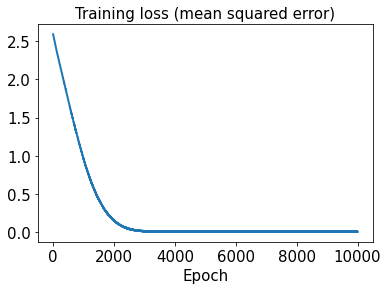

In [63]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

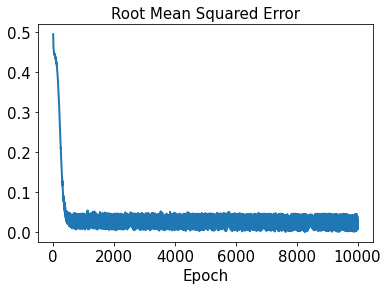

In [64]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [65]:
sd2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [66]:
start2 = datetime.datetime.now()
history2 = sd2.fit(x_train2, y_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 8ms/step - loss: 2.6768 - rmse: 1.6361
Epoch 2/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6675 - rmse: 1.6332
Epoch 3/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6590 - rmse: 1.6307
Epoch 4/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6507 - rmse: 1.6281
Epoch 5/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.6423 - rmse: 1.6255
Epoch 6/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6339 - rmse: 1.6229
Epoch 7/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6255 - rmse: 1.6204
Epoch 8/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6171 - rmse: 1.6178
Epoch 9/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6087 - rmse: 1.6151
Epoch 10/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6003 - rmse: 1.6125
Epoch 11/10000
2/2 [=============================

2/2 [==============================] - 0s 7ms/step - loss: 2.0032 - rmse: 1.4153
Epoch 87/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9968 - rmse: 1.4130
Epoch 88/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9903 - rmse: 1.4107
Epoch 89/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.9775 - rmse: 1.4062
Epoch 90/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.9702 - rmse: 1.4036
Epoch 91/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9670 - rmse: 1.4024
Epoch 92/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.9622 - rmse: 1.4007
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9546 - rmse: 1.3980
Epoch 94/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.9421 - rmse: 1.3935
Epoch 95/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.9407 - rmse: 1.3930
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 7ms/step - loss: 1.3948 - rmse: 1.1809
Epoch 171/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.3871 - rmse: 1.1777
Epoch 172/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3781 - rmse: 1.1739
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3751 - rmse: 1.1726
Epoch 174/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3691 - rmse: 1.1700
Epoch 175/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.3541 - rmse: 1.1636
Epoch 176/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3471 - rmse: 1.1606
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3401 - rmse: 1.1576
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3324 - rmse: 1.1543
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3242 - rmse: 1.1507
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.8221 - rmse: 0.9067
Epoch 255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8171 - rmse: 0.9039
Epoch 256/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.8093 - rmse: 0.8996
Epoch 257/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.8048 - rmse: 0.8971
Epoch 258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7977 - rmse: 0.8931
Epoch 259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7925 - rmse: 0.8902
Epoch 260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7913 - rmse: 0.8895
Epoch 261/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.7844 - rmse: 0.8856
Epoch 262/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.7744 - rmse: 0.8800
Epoch 263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7743 - rmse: 0.8799
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.4101 - rmse: 0.6403
Epoch 339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4039 - rmse: 0.6355
Epoch 340/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4000 - rmse: 0.6324
Epoch 341/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4006 - rmse: 0.6329
Epoch 342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3981 - rmse: 0.6309
Epoch 343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3890 - rmse: 0.6237
Epoch 344/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3869 - rmse: 0.6219
Epoch 345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3870 - rmse: 0.6220
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3819 - rmse: 0.6180
Epoch 347/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3768 - rmse: 0.6138
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.1748 - rmse: 0.4181
Epoch 423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1707 - rmse: 0.4131
Epoch 424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1675 - rmse: 0.4092
Epoch 425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1676 - rmse: 0.4093
Epoch 426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1657 - rmse: 0.4070
Epoch 427/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1602 - rmse: 0.4002
Epoch 428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1642 - rmse: 0.4051
Epoch 429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1565 - rmse: 0.3955
Epoch 430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1546 - rmse: 0.3931
Epoch 431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1538 - rmse: 0.3921
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 6ms/step - loss: 0.0726 - rmse: 0.2693
Epoch 507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0658 - rmse: 0.2564
Epoch 508/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0677 - rmse: 0.2601
Epoch 509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0679 - rmse: 0.2606
Epoch 510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0644 - rmse: 0.2537
Epoch 511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0699 - rmse: 0.2643
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0628 - rmse: 0.2505
Epoch 513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0673 - rmse: 0.2593
Epoch 514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0631 - rmse: 0.2511
Epoch 515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0674 - rmse: 0.2595
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0262 - rmse: 0.1618
Epoch 591/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0230 - rmse: 0.1514
Epoch 592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0228 - rmse: 0.1507
Epoch 593/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0232 - rmse: 0.1521
Epoch 594/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0226 - rmse: 0.1502
Epoch 595/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0273 - rmse: 0.1650
Epoch 596/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0220 - rmse: 0.1482
Epoch 597/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0267 - rmse: 0.1634
Epoch 598/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0246 - rmse: 0.1568
Epoch 599/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0275 - rmse: 0.1657
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0122 - rmse: 0.1103
Epoch 675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0150 - rmse: 0.1225
Epoch 676/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0164 - rmse: 0.1277
Epoch 677/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0115 - rmse: 0.1069
Epoch 678/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0164 - rmse: 0.1281
Epoch 679/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0098 - rmse: 0.0987
Epoch 680/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0102 - rmse: 0.1007
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0139 - rmse: 0.1177
Epoch 682/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0165 - rmse: 0.1285
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0128 - rmse: 0.1132
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 6ms/step - loss: 0.0090 - rmse: 0.0949
Epoch 759/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 760/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0704
Epoch 762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0102 - rmse: 0.1010
Epoch 763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0915
Epoch 765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0753
Epoch 766/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0502
Epoch 767/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 849/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 850/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0075 - rmse: 0.0866
Epoch 851/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0471
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0749
Epoch 926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 928/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 929/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 930/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2289e-04 - rmse: 0.0242
Epoch 931/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.4043e-04 - rmse: 0.0175
Epoch 932/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4567e-04 - rmse: 0.0302
Epoch 933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 934/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 935/10000
2/2 [============

2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 1009/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 1010/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7017e-04 - rmse: 0.0232
Epoch 1011/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6621e-04 - rmse: 0.0182
Epoch 1012/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 1013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 1014/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 1015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 1017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 1018/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 1091/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3459e-04 - rmse: 0.0142
Epoch 1092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0696
Epoch 1093/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5797e-04 - rmse: 0.0112
Epoch 1094/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4198e-04 - rmse: 0.0226
Epoch 1095/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.2762e-04 - rmse: 0.0098
Epoch 1096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 1097/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7671e-04 - rmse: 0.0186
Epoch 1098/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 1099/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.4011e-04 - rmse: 0.0226
Epoch 1100/10

2/2 [==============================] - 0s 9ms/step - loss: 1.2329e-04 - rmse: 0.0096
Epoch 1173/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 1174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 1175/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 1176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 1177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 1178/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2125e-04 - rmse: 0.0198
Epoch 1179/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.3618e-05 - rmse: 0.0073
Epoch 1180/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 1181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 1182/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 1255/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4716e-04 - rmse: 0.0205
Epoch 1256/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 1257/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0078 - rmse: 0.0881
Epoch 1258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 1259/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 1260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 1261/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 1262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 1263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 1264/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 1337/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 1338/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 1339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 1340/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3939e-04 - rmse: 0.0302
Epoch 1341/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 1342/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 1343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 1344/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8977e-04 - rmse: 0.0162
Epoch 1345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 1346/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0699
Epoch 1419/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 1420/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 1421/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 1422/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.6912e-04 - rmse: 0.0210
Epoch 1423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0847
Epoch 1424/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0398e-04 - rmse: 0.0166
Epoch 1425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 1426/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0879
Epoch 1427/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5705e-04 - rmse: 0.0182
Epoch 1428/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 1501/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 1502/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7015e-04 - rmse: 0.0120
Epoch 1503/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7058e-05 - rmse: 0.0084
Epoch 1504/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 1505/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 1506/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 1507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 1508/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8597e-05 - rmse: 0.0079
Epoch 1509/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8057e-04 - rmse: 0.0160
Epoch 1510/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 1583/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5227e-04 - rmse: 0.0181
Epoch 1584/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0064 - rmse: 0.0801
Epoch 1585/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 1586/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 1587/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 1588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0703
Epoch 1589/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6720e-04 - rmse: 0.0185
Epoch 1590/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 1591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 1592/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 1665/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 1666/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 1667/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 1668/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 1669/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 1670/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 1671/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 1672/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 1673/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0844
Epoch 1674/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 1747/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 1748/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1700e-04 - rmse: 0.0282
Epoch 1749/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 1750/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 1751/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 1752/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 1753/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 1754/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.2788e-04 - rmse: 0.0225
Epoch 1755/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 1756/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 1830/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0586
Epoch 1831/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0695
Epoch 1832/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 1833/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 1834/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 1835/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 1836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 1837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 1838/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7440e-04 - rmse: 0.0308
Epoch 1839/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 1912/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 1913/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1090e-04 - rmse: 0.0137
Epoch 1914/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 1915/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0522
Epoch 1916/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9847e-04 - rmse: 0.0194
Epoch 1917/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9923e-04 - rmse: 0.0240
Epoch 1918/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 1919/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0731
Epoch 1920/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 1921/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 1994/10000
2/2 [==============================] - ETA: 0s - loss: 1.7862e-04 - rmse: 0.01 - 0s 6ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 1995/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 1996/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3326e-04 - rmse: 0.0145
Epoch 1997/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 1998/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 1999/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 2000/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 2001/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7763e-04 - rmse: 0.0160
Epoch 2002/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - 

2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 2076/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 2077/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8365e-04 - rmse: 0.0162
Epoch 2078/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 2079/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2305e-04 - rmse: 0.0283
Epoch 2080/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 2081/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 2082/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 2083/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 2084/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0671e-04 - rmse: 0.0262
Epoch 2085/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 2158/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 2159/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 2160/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3506e-04 - rmse: 0.0107
Epoch 2161/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 2162/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 2163/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 2164/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 2165/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 2166/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.5748e-04 - rmse: 0.0306
Epoch 2167/10000
2/2 [==

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 2240/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 2241/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8307e-04 - rmse: 0.0237
Epoch 2242/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 2243/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 2244/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 2245/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 2246/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 2247/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 2248/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 2249/10000
2/2 [====

2/2 [==============================] - 0s 7ms/step - loss: 8.1191e-04 - rmse: 0.0281
Epoch 2322/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.2993e-04 - rmse: 0.0284
Epoch 2323/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 2324/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 2325/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 2326/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 2327/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 2328/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0757
Epoch 2329/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 2330/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 2331/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 2404/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0295e-04 - rmse: 0.0135
Epoch 2405/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 2406/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 2407/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 2408/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 2409/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6617e-05 - rmse: 0.0040
Epoch 2410/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 2411/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 2412/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 2413/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 2487/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 2488/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 2489/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 2490/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 2491/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 2492/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 2493/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 2494/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 2495/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 2496/10000
2/2 [===============

Epoch 2569/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 2570/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 2571/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5457e-04 - rmse: 0.0208
Epoch 2572/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4349e-04 - rmse: 0.0111
Epoch 2573/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 2574/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 2575/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 2576/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0162e-05 - rmse: 0.0084
Epoch 2577/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6569e-04 - rmse: 0.0186
Epoch 2578/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0517
Epoc

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 2652/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 2653/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 2654/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0868
Epoch 2655/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 2656/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0272e-05 - rmse: 0.0078
Epoch 2657/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0526e-04 - rmse: 0.0092
Epoch 2658/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 2659/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 2660/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 2661/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 2734/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 2735/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 2736/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 2737/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 2738/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 2739/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 2740/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0702
Epoch 2741/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 2742/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 2743/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 2817/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 2818/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9726e-04 - rmse: 0.0279
Epoch 2819/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 2820/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 2821/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 2822/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 2823/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 2824/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 2825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 2826/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 2899/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 2900/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 2901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 2902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 2903/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4194e-05 - rmse: 0.0080
Epoch 2904/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1024e-04 - rmse: 0.0222
Epoch 2905/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0917e-04 - rmse: 0.0170
Epoch 2906/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 2907/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0870
Epoch 2908/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 2.8059e-04 - rmse: 0.0162
Epoch 2982/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 2983/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 2984/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 2985/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 2986/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 2987/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0867
Epoch 2988/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 2989/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9113e-04 - rmse: 0.0131
Epoch 2990/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 2991/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 3064/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 3065/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 3066/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 3067/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0792
Epoch 3068/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0844
Epoch 3069/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0586
Epoch 3070/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 3071/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 3072/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 3073/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 3146/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 3147/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 3148/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0892
Epoch 3149/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 3150/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2249e-04 - rmse: 0.0283
Epoch 3151/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8827e-04 - rmse: 0.0295
Epoch 3152/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 3153/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 3154/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9403e-04 - rmse: 0.0296
Epoch 3155/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 3228/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0051 - rmse: 0.0710
Epoch 3229/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 3230/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 3231/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0088 - rmse: 0.0937
Epoch 3232/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 3233/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 3234/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0091 - rmse: 0.0951
Epoch 3235/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 3236/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0052 - rmse: 0.0720
Epoch 3237/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 8.6233e-05 - rmse: 0.0082
Epoch 3311/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 3312/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1441e-04 - rmse: 0.0244
Epoch 3313/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.6298e-04 - rmse: 0.0120
Epoch 3314/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9263e-04 - rmse: 0.0193
Epoch 3315/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 3316/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.5026e-04 - rmse: 0.0152
Epoch 3317/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0055 - rmse: 0.0737
Epoch 3318/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 3319/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 3320/10000


2/2 [==============================] - 0s 7ms/step - loss: 5.8721e-04 - rmse: 0.0238
Epoch 3393/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 3394/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 3395/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 3396/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 3397/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 3398/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 3399/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.7301e-04 - rmse: 0.0213
Epoch 3400/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0882
Epoch 3401/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6986e-04 - rmse: 0.0235
Epoch 3402/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 9.8043e-04 - rmse: 0.0310
Epoch 3476/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2961e-04 - rmse: 0.0302
Epoch 3477/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 3478/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 3479/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 3480/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7866e-04 - rmse: 0.0257
Epoch 3481/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 3482/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.4334e-04 - rmse: 0.0250
Epoch 3483/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 3484/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 3485/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 3558/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0847
Epoch 3559/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 3560/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 3561/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 3562/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2100e-04 - rmse: 0.0201
Epoch 3563/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 3564/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 3565/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 3566/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 3567/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 3640/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 3641/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 3642/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2537e-04 - rmse: 0.0266
Epoch 3643/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 3644/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 3645/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0545e-04 - rmse: 0.0281
Epoch 3646/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 3647/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.3872e-04 - rmse: 0.0179
Epoch 3648/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0754
Epoch 3649/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 3722/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0714
Epoch 3723/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 3724/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0908
Epoch 3725/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 3726/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 3727/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 3728/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 3729/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 3730/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0619
Epoch 3731/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 3804/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 3805/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 3806/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 3807/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0761
Epoch 3808/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 3809/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 3810/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 3811/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4215e-04 - rmse: 0.0180
Epoch 3812/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 3813/10000
2/2 [====

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 3886/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5748e-04 - rmse: 0.0118
Epoch 3887/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 3888/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5018e-04 - rmse: 0.0231
Epoch 3889/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 3890/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 3891/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 3892/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 3893/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 3894/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 3895/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 3968/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9163e-04 - rmse: 0.0165
Epoch 3969/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 3970/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.5455e-05 - rmse: 0.0069
Epoch 3971/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 3972/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 3973/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.4371e-04 - rmse: 0.0150
Epoch 3974/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 3975/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6842e-05 - rmse: 0.0077
Epoch 3976/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 3977/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 1.9708e-04 - rmse: 0.0134
Epoch 4050/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9354e-04 - rmse: 0.0133
Epoch 4051/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 4052/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 4053/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 4054/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 4055/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4417e-04 - rmse: 0.0181
Epoch 4056/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0726
Epoch 4057/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 4058/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 4059/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 4133/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0053 - rmse: 0.0726
Epoch 4134/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 4135/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 4136/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 4137/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0089 - rmse: 0.0942
Epoch 4138/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 4139/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 4140/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 4141/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 4142/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 4216/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 4217/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 4218/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0848
Epoch 4219/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6320e-04 - rmse: 0.0273
Epoch 4220/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 4221/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 4222/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 4223/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 4224/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0930
Epoch 4225/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 2.6946e-04 - rmse: 0.0159
Epoch 4298/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 4299/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9430e-04 - rmse: 0.0296
Epoch 4300/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 4301/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 4302/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9229e-04 - rmse: 0.0132
Epoch 4303/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4136e-04 - rmse: 0.0180
Epoch 4304/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 4305/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6415e-04 - rmse: 0.0157
Epoch 4306/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 4307/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 4380/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 4381/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 4382/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.7294e-04 - rmse: 0.0309
Epoch 4383/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0794
Epoch 4384/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 4385/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0064 - rmse: 0.0798
Epoch 4386/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1019e-04 - rmse: 0.0222
Epoch 4387/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.6239e-04 - rmse: 0.0157
Epoch 4388/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 4389/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 6.9441e-04 - rmse: 0.0260
Epoch 4462/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4183e-04 - rmse: 0.0112
Epoch 4463/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 4464/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2290e-04 - rmse: 0.0175
Epoch 4465/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 4466/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.5653e-05 - rmse: 0.0083
Epoch 4467/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 4468/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 4469/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 4470/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 4471/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 8.8355e-04 - rmse: 0.0294
Epoch 4544/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 4545/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 4546/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 4547/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 4548/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 4549/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 4550/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 4551/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 4552/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 4553/10000
2/2 [======

2/2 [==============================] - 0s 6ms/step - loss: 3.4087e-04 - rmse: 0.0180
Epoch 4627/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 4628/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7310e-04 - rmse: 0.0189
Epoch 4629/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 4630/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7020e-04 - rmse: 0.0235
Epoch 4631/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.6415e-04 - rmse: 0.0234
Epoch 4632/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 4633/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1422e-04 - rmse: 0.0282
Epoch 4634/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 4635/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 4636/10000


2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 4709/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 4710/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 4711/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 4712/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1263e-04 - rmse: 0.0223
Epoch 4713/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9961e-04 - rmse: 0.0241
Epoch 4714/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.7294e-04 - rmse: 0.0256
Epoch 4715/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1405e-04 - rmse: 0.0282
Epoch 4716/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0796
Epoch 4717/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 4718/

2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 4790/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 4791/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 4792/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 4793/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 4794/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 4795/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 4796/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 4797/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0731
Epoch 4798/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 4799/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 4872/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0881
Epoch 4873/10000
2/2 [==============================] - 0s 18ms/step - loss: 4.3934e-04 - rmse: 0.0206
Epoch 4874/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 4875/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 4876/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 4877/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 4878/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.0569e-04 - rmse: 0.0263
Epoch 4879/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3868e-04 - rmse: 0.0180
Epoch 4880/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 4881/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 4954/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8238e-04 - rmse: 0.0277
Epoch 4955/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 4956/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0808
Epoch 4957/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 4958/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 4959/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 4960/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 4961/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 4962/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 4963/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 5036/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.4079e-04 - rmse: 0.0269
Epoch 5037/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 5038/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6708e-04 - rmse: 0.0255
Epoch 5039/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1433e-04 - rmse: 0.0264
Epoch 5040/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.4913e-04 - rmse: 0.0271
Epoch 5041/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4427e-04 - rmse: 0.0251
Epoch 5042/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 5043/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 5044/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 50

2/2 [==============================] - 0s 7ms/step - loss: 9.3940e-04 - rmse: 0.0304
Epoch 5118/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 5119/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0048 - rmse: 0.0694
Epoch 5120/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.4579e-04 - rmse: 0.0207
Epoch 5121/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.7194e-04 - rmse: 0.0214
Epoch 5122/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 5123/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 5124/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0082 - rmse: 0.0905
Epoch 5125/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 5126/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 5127/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 5200/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 5201/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1823e-04 - rmse: 0.0142
Epoch 5202/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.9586e-04 - rmse: 0.0195
Epoch 5203/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 5204/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 5205/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 5206/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2090e-04 - rmse: 0.0201
Epoch 5207/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 5208/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.9923e-04 - rmse: 0.0261
Epoch 5209/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 5283/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 5284/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 5285/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 5286/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 5287/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 5288/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 5289/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 5290/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 5291/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 5292/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 5365/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0763
Epoch 5366/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0075 - rmse: 0.0867
Epoch 5367/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 5368/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 5369/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 5370/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 5371/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 5372/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 5373/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 5374/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 5448/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 5449/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0860
Epoch 5450/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 5451/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 5452/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 5453/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 5454/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6525e-04 - rmse: 0.0212
Epoch 5455/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0885
Epoch 5456/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 5457/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 5530/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0909
Epoch 5531/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9522e-04 - rmse: 0.0313
Epoch 5532/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0882
Epoch 5533/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 5534/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 5535/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 5536/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 5537/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 5538/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 5539/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 3.1533e-04 - rmse: 0.0173
Epoch 5612/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.9535e-04 - rmse: 0.0219
Epoch 5613/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 5614/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 5615/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.8472e-04 - rmse: 0.0259
Epoch 5616/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 5617/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 5618/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 5619/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0716
Epoch 5620/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7652e-04 - rmse: 0.0276
Epoch 5621/

2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 5694/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 5695/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 5696/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 5697/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 5698/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 5699/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 5700/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 5701/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 5702/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4633e-04 - rmse: 0.0115
Epoch 5703/10000
2/2 [=

2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 5776/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 5777/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 5778/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 5779/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 5780/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1420e-04 - rmse: 0.0173
Epoch 5781/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9867e-04 - rmse: 0.0280
Epoch 5782/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0823
Epoch 5783/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 5784/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.2228e-04 - rmse: 0.0202
Epoch 5785/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 5858/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 5859/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 5860/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4992e-04 - rmse: 0.0116
Epoch 5861/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 5862/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0783
Epoch 5863/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.1709e-04 - rmse: 0.0142
Epoch 5864/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 5865/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 5866/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.7300e-04 - rmse: 0.0257
Epoch 5867/10000
2/2 [===

2/2 [==============================] - 0s 13ms/step - loss: 7.5106e-04 - rmse: 0.0271
Epoch 5940/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 5941/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.7678e-04 - rmse: 0.0257
Epoch 5942/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 5943/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.2590e-04 - rmse: 0.0267
Epoch 5944/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 5945/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0075 - rmse: 0.0864
Epoch 5946/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 5947/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 5948/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 5949/10000

2/2 [==============================] - 0s 10ms/step - loss: 5.2259e-04 - rmse: 0.0225
Epoch 6022/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 6023/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 6024/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 6025/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 6026/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 6027/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9348e-04 - rmse: 0.0219
Epoch 6028/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 6029/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 6030/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 6031/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 6104/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 6105/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 6106/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5589e-05 - rmse: 0.0084
Epoch 6107/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 6108/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 6109/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 6110/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 6111/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 6112/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 6113/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 1.0304e-04 - rmse: 0.0094
Epoch 6186/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 6187/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3549e-04 - rmse: 0.0179
Epoch 6188/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0730
Epoch 6189/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 6190/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 6191/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 6192/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1935e-04 - rmse: 0.0143
Epoch 6193/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8306e-04 - rmse: 0.0164
Epoch 6194/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0865e-04 - rmse: 0.0199
Epoch 6195/1

2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 6268/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 6269/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 6270/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0634
Epoch 6271/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0473
Epoch 6272/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 6273/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 6274/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.6917e-04 - rmse: 0.0292
Epoch 6275/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 6276/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.5947e-04 - rmse: 0.0254
Epoch 6277/10000
2/2 [=====

2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 6350/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 6351/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 6352/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8999e-04 - rmse: 0.0133
Epoch 6353/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0731
Epoch 6354/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 6355/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8670e-04 - rmse: 0.0295
Epoch 6356/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 6357/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 6358/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 6359/10000
2/2 [=====

Epoch 6432/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 6433/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 6434/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2354e-05 - rmse: 0.0077
Epoch 6435/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 6436/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 6437/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 6438/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 6439/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 6440/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3777e-04 - rmse: 0.0180
Epoch 6441/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 

2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 6515/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 6516/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0762
Epoch 6517/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 6518/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 6519/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 6520/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 6521/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0733
Epoch 6522/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 6523/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 6524/10000
2/2 [===========

2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 6597/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2383e-05 - rmse: 0.0030
Epoch 6598/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5075e-04 - rmse: 0.0117
Epoch 6599/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2931e-05 - rmse: 0.0044
Epoch 6600/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 6601/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.4936e-04 - rmse: 0.0209
Epoch 6602/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.0297e-04 - rmse: 0.0221
Epoch 6603/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0730
Epoch 6604/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 6605/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3777e-04 - rmse: 0.0111
Epoch 660

2/2 [==============================] - 0s 12ms/step - loss: 4.8343e-04 - rmse: 0.0217
Epoch 6679/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 6680/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0544e-04 - rmse: 0.0222
Epoch 6681/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0751
Epoch 6682/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 6683/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 6684/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 6685/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 6686/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 6687/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 6688/10000
2/2 [

2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6761/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0687
Epoch 6762/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 6763/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 6764/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.8636e-04 - rmse: 0.0259
Epoch 6765/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 6766/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5763e-04 - rmse: 0.0186
Epoch 6767/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0750
Epoch 6768/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 6769/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.6351e-04 - rmse: 0.0274
Epoch 6770/10000
2/2 

2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 6843/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 6844/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 6845/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 6846/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0722
Epoch 6847/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 6848/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 6849/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2780e-04 - rmse: 0.0147
Epoch 6850/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 6851/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 6852/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 3.8200e-04 - rmse: 0.0192
Epoch 6926/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0100e-04 - rmse: 0.0170
Epoch 6927/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 6928/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5911e-04 - rmse: 0.0121
Epoch 6929/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0731
Epoch 6930/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0527e-04 - rmse: 0.0171
Epoch 6931/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3282e-04 - rmse: 0.0109
Epoch 6932/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 6933/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 6934/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 6935/100

2/2 [==============================] - 0s 13ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 7008/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 7009/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 7010/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.2195e-04 - rmse: 0.0284
Epoch 7011/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 7012/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.4511e-05 - rmse: 0.0078
Epoch 7013/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3367e-04 - rmse: 0.0110
Epoch 7014/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 7015/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 7016/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 7017/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 2.7957e-04 - rmse: 0.0163
Epoch 7091/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9129e-04 - rmse: 0.0219
Epoch 7092/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.9082e-04 - rmse: 0.0167
Epoch 7093/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 7094/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 7095/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0827
Epoch 7096/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0777
Epoch 7097/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 7098/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.7701e-04 - rmse: 0.0276
Epoch 7099/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 7100/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 7173/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 7174/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 7175/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 7176/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0921
Epoch 7177/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 7178/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 7179/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 7180/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0793
Epoch 7181/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 7182/10000
2/2 [==========

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 7256/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 7257/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0064 - rmse: 0.0802
Epoch 7258/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 7259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 7260/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5865e-04 - rmse: 0.0211
Epoch 7261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0698
Epoch 7262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 7263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 7264/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 7265/10000
2/2 [===========

Epoch 7338/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 7339/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 7340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0713
Epoch 7341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 7342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0587
Epoch 7343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 7344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0712
Epoch 7345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 7346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 7347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0379
Epoch 7348/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 7421/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 7422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 7423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 7424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 7425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 7426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 7427/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9570e-04 - rmse: 0.0135
Epoch 7428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 7429/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8903e-05 - rmse: 0.0082
Epoch 7430/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 7503/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 7504/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 7505/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 7506/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 7507/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0577e-04 - rmse: 0.0222
Epoch 7508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 7509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 7510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 7511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 7512/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 7585/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 7586/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 7587/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 7588/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 7589/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3745e-04 - rmse: 0.0206
Epoch 7590/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3912e-04 - rmse: 0.0207
Epoch 7591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0701
Epoch 7592/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5294e-04 - rmse: 0.0210
Epoch 7593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 7594/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0906
Epoch 7668/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 7669/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 7670/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 7671/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0967e-04 - rmse: 0.0264
Epoch 7672/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0528
Epoch 7673/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.6649e-04 - rmse: 0.0256
Epoch 7674/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7948e-04 - rmse: 0.0258
Epoch 7675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0695
Epoch 7676/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9189e-04 - rmse: 0.0297
Epoch 7677/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 7750/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 7751/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 7752/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.4104e-04 - rmse: 0.0270
Epoch 7753/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2248e-04 - rmse: 0.0105
Epoch 7754/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7756e-04 - rmse: 0.0129
Epoch 7755/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3504e-05 - rmse: 0.0078
Epoch 7756/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4783e-04 - rmse: 0.0183
Epoch 7757/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6327e-04 - rmse: 0.0123
Epoch 7758/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 7759/10

Epoch 7832/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 7833/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 7834/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 7835/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 7836/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3461e-04 - rmse: 0.0287
Epoch 7837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 7838/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9246e-04 - rmse: 0.0134
Epoch 7839/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 7840/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.6039e-04 - rmse: 0.0255
Epoch 7841/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0340e-05 - rmse: 0.0076
Epoc

2/2 [==============================] - 0s 17ms/step - loss: 1.8053e-04 - rmse: 0.0130
Epoch 7915/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3622e-04 - rmse: 0.0287
Epoch 7916/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 7917/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 7918/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0052 - rmse: 0.0723
Epoch 7919/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2569e-04 - rmse: 0.0107
Epoch 7920/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 7921/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0052 - rmse: 0.0724
Epoch 7922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 7923/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 7924/10000
2/2 [==

2/2 [==============================] - 0s 7ms/step - loss: 2.1854e-04 - rmse: 0.0144
Epoch 7997/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 7998/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 7999/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1028e-04 - rmse: 0.0223
Epoch 8000/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 8001/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4081e-04 - rmse: 0.0230
Epoch 8002/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7679e-04 - rmse: 0.0216
Epoch 8003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 8004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 8005/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6050e-04 - rmse: 0.0255
Epoch 8006/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 8079/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1040e-04 - rmse: 0.0300
Epoch 8080/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 8081/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0764
Epoch 8082/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 8083/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0866e-04 - rmse: 0.0172
Epoch 8084/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5487e-04 - rmse: 0.0185
Epoch 8085/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0694
Epoch 8086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 8087/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 8088/10000
2/2 [===

2/2 [==============================] - 0s 14ms/step - loss: 2.9674e-04 - rmse: 0.0169
Epoch 8161/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.0977e-04 - rmse: 0.0141
Epoch 8162/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 8163/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 8164/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 8165/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7633e-04 - rmse: 0.0294
Epoch 8166/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8227e-04 - rmse: 0.0193
Epoch 8167/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4018e-04 - rmse: 0.0181
Epoch 8168/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 8169/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 8170/100

2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 8243/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 8244/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3241e-04 - rmse: 0.0149
Epoch 8245/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 8246/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 8247/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3896e-04 - rmse: 0.0207
Epoch 8248/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 8249/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 8250/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 8251/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4271e-04 - rmse: 0.0305
Epoch 8252/10000
2/2 [==

2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 8325/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.6232e-04 - rmse: 0.0158
Epoch 8326/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 8327/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 8328/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 8329/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 8330/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 8331/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 8332/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2906e-04 - rmse: 0.0178
Epoch 8333/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 8334/10000
2/2 [==

2/2 [==============================] - 0s 20ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 8407/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 8408/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8674e-04 - rmse: 0.0132
Epoch 8409/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 8410/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 8411/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 8412/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 8413/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 8414/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 8415/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.4278e-04 - rmse: 0.0182
Epoch 8416/10000
2/2 [==

2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 8489/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4107e-04 - rmse: 0.0207
Epoch 8490/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 8491/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 8492/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 8493/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 8494/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0052 - rmse: 0.0717
Epoch 8495/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 8496/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 8497/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0090 - rmse: 0.0947
Epoch 8498/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 8571/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0850
Epoch 8572/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 8573/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0798e-04 - rmse: 0.0244
Epoch 8574/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 8575/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 8576/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 8577/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 8578/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.2932e-04 - rmse: 0.0228
Epoch 8579/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 8580/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 8654/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 8655/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 8656/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 8657/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 8658/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 8659/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0681
Epoch 8660/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 8661/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 8662/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 8663/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0075 - rmse: 0.0863
Epoch 8737/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0063 - rmse: 0.0794
Epoch 8738/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 8739/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.4102e-04 - rmse: 0.0305
Epoch 8740/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 8741/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 8742/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 8743/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6360e-04 - rmse: 0.0274
Epoch 8744/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 8745/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.1914e-04 - rmse: 0.0247
Epoch 8746/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 9.6317e-04 - rmse: 0.0309
Epoch 8819/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 8820/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0752e-04 - rmse: 0.0172
Epoch 8821/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8926e-04 - rmse: 0.0260
Epoch 8822/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 8823/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0651e-04 - rmse: 0.0140
Epoch 8824/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 8825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 8826/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7786e-04 - rmse: 0.0129
Epoch 8827/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0103e-04 - rmse: 0.0281
Epoch 8828/10

2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 8901/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4801e-05 - rmse: 0.0066
Epoch 8902/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 8903/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 8904/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 8905/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 8906/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0744
Epoch 8907/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0823
Epoch 8908/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.1171e-04 - rmse: 0.0173
Epoch 8909/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 8910/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 1.5179e-04 - rmse: 0.0119
Epoch 8984/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1162e-05 - rmse: 0.0084
Epoch 8985/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3795e-04 - rmse: 0.0151
Epoch 8986/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4774e-04 - rmse: 0.0184
Epoch 8987/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0821
Epoch 8988/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5940e-04 - rmse: 0.0187
Epoch 8989/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 8990/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 8991/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 8992/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4437e-04 - rmse: 0.0231
Epoch 8993/10

2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 9066/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3646e-04 - rmse: 0.0206
Epoch 9067/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0504
Epoch 9068/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0635
Epoch 9069/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 9070/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.5019e-05 - rmse: 0.0086
Epoch 9071/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 9072/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 9073/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 9074/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 9075/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 4.5295e-04 - rmse: 0.0210
Epoch 9149/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 9150/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 9151/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3980e-04 - rmse: 0.0114
Epoch 9152/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 9153/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 9154/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 9155/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0814
Epoch 9156/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.9105e-05 - rmse: 0.0076
Epoch 9157/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2402e-04 - rmse: 0.0177
Epoch 9158/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 9231/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 9232/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 9233/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5816e-04 - rmse: 0.0186
Epoch 9234/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 9235/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 9236/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 9237/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 9238/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 9239/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6045e-04 - rmse: 0.0187
Epoch 9240/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 9314/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 9315/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0603
Epoch 9316/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6654e-04 - rmse: 0.0275
Epoch 9317/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 9318/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 9319/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 9320/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0044 - rmse: 0.0666
Epoch 9321/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4690e-04 - rmse: 0.0289
Epoch 9322/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 9323/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 9396/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 9397/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 9398/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 9399/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7392e-04 - rmse: 0.0128
Epoch 9400/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 9401/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 9402/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 9403/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 9404/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5654e-04 - rmse: 0.0211
Epoch 9405/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 9478/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0799
Epoch 9479/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 9480/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 9481/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.4994e-04 - rmse: 0.0232
Epoch 9482/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.9410e-04 - rmse: 0.0241
Epoch 9483/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0603
Epoch 9484/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.6578e-04 - rmse: 0.0275
Epoch 9485/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0071 - rmse: 0.0845
Epoch 9486/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4316e-04 - rmse: 0.0251
Epoch 9487/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0473
Epoch 9560/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9561/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 9562/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 9563/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5158e-04 - rmse: 0.0210
Epoch 9564/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 9565/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4607e-04 - rmse: 0.0252
Epoch 9566/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.4274e-04 - rmse: 0.0152
Epoch 9567/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6643e-04 - rmse: 0.0125
Epoch 9568/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 9569/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 9642/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 9643/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0664e-04 - rmse: 0.0199
Epoch 9644/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 9645/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 9646/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 9647/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 9648/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0379
Epoch 9649/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4341e-04 - rmse: 0.0153
Epoch 9650/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 9651/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0823
Epoch 9724/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3941e-04 - rmse: 0.0251
Epoch 9725/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2971e-04 - rmse: 0.0286
Epoch 9726/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0800
Epoch 9727/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 9728/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2534e-04 - rmse: 0.0285
Epoch 9729/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6283e-04 - rmse: 0.0159
Epoch 9730/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 9731/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0499
Epoch 9732/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 9733/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 9806/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 9807/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.7307e-04 - rmse: 0.0162
Epoch 9808/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0887
Epoch 9809/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 9810/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7983e-04 - rmse: 0.0164
Epoch 9811/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7881e-04 - rmse: 0.0216
Epoch 9812/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 9813/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8831e-04 - rmse: 0.0167
Epoch 9814/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 9815/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 0.0063 - rmse: 0.0791
Epoch 9888/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6518e-04 - rmse: 0.0235
Epoch 9889/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 9890/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 9891/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 9892/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5211e-04 - rmse: 0.0272
Epoch 9893/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 9894/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 9895/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 9896/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.9844e-04 - rmse: 0.0221
Epoch 9897/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 9970/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.5488e-04 - rmse: 0.0120
Epoch 9971/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1211e-04 - rmse: 0.0101
Epoch 9972/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8779e-05 - rmse: 0.0053
Epoch 9973/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0789
Epoch 9974/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 9975/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 9976/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 9977/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0227e-04 - rmse: 0.0138
Epoch 9978/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1222e-04 - rmse: 0.0265
Epoch 9979/10000


In [67]:
time2 = end2 - start2
print("Training time (Case 2):", time2)

Training time (Case 2): 0:03:01.100950


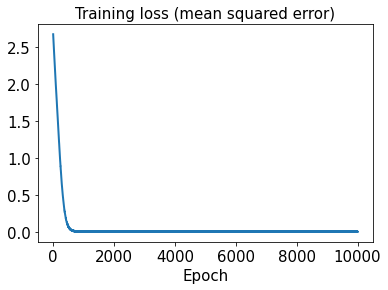

In [68]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

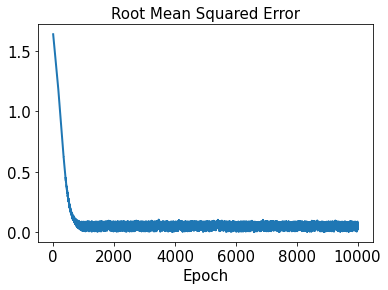

In [69]:
plt.plot(hist2['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [70]:
test_results2 = sd2.evaluate(x_test2)

1/1 [==============================] - 0s 83ms/step - loss: 1.0747e-05 - rmse: 0.0000e+00


In [71]:
decoded_sensor_train2 = sensor_pred2.predict(t_train)

In [72]:
decoded_sensor_test2 = sensor_pred2.predict(t_test)

In [73]:
decoded_train2 = sd2.predict(decoded_sensor_train2)

In [74]:
decoded_test2 = sd2.predict(decoded_sensor_test2)

In [75]:
error_train_abs2 = np.abs(decoded_train2 - y_train2)

In [76]:
error_test_abs2 = np.abs(decoded_test2 - y_test2)

In [77]:
l2_error_train2 = np.sqrt(np.sum((decoded_train2 - y_train2)**2) / np.sum(y_train2**2))
print(l2_error_train2)

0.11932755527394281


In [78]:
l2_error_test2 = np.sqrt(np.sum((decoded_test2 - y_test2)**2) / np.sum(y_test2**2))
print(l2_error_test2)

0.09089528814706227


In [79]:
l2_error_train_list2 = []
for i in range(0, len(x_train2)):
    l2_error_train_data2 = np.sqrt(np.sum((decoded_train2[i] - y_train2[i])**2) / np.sum(y_train2[i]**2))
    l2_error_train_list2.append(l2_error_train_data2)
print(l2_error_train_list2)

[0.14773532821913457, 0.19567273984998226, 0.11531746921555106, 0.10455826494656316, 0.012900578103711327, 0.1631499739083028, 0.048928470049330736, 0.14321692697502666, 0.03052316684061354, 0.11777001684973995, 0.13107532720886952, 0.13675715384164153, 0.12775571773405534, 0.19177861485744271, 0.12467311891180387, 0.14988456079665619, 0.15486814292469028, 0.048204706008944054, 0.1625716700807944, 0.14953088634557724, 0.08075642682017105, 0.1747172195701137, 0.09964152766777515, 0.07592023717194853, 0.137067116000562, 0.14345625953723096, 0.06227175661529889, 0.003308578359330182, 0.0337010643753638, 0.19508292017982468, 0.0663013378846737, 0.13933124915633932, 0.06233996442702119]


In [80]:
l2_error_test_list2 = []
for i in range(0, len(x_test2)):
    l2_error_test_data2 = np.sqrt(np.sum((decoded_test2[i] - y_test2[i])**2) / np.sum(y_test2[i]**2))
    l2_error_test_list2.append(l2_error_test_data2)
print(l2_error_test_list2)

[0.0891685307728343, 0.0848477920265275, 0.1830181921395034, 0.10211075534684677, 0.18525758716012328, 0.007774153684319644, 0.018739293199016203, 0.04030246211478315]


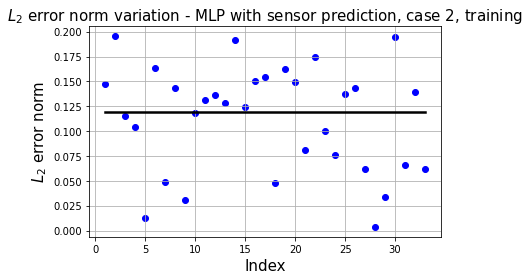

In [81]:
plt.plot(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train2*np.ones(x_train2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

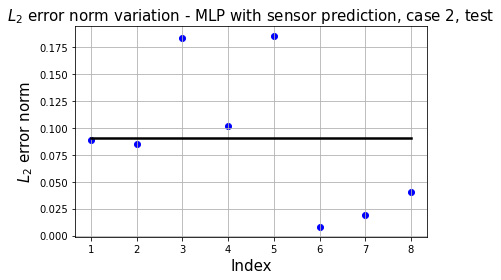

In [82]:
plt.plot(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test2*np.ones(x_test2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

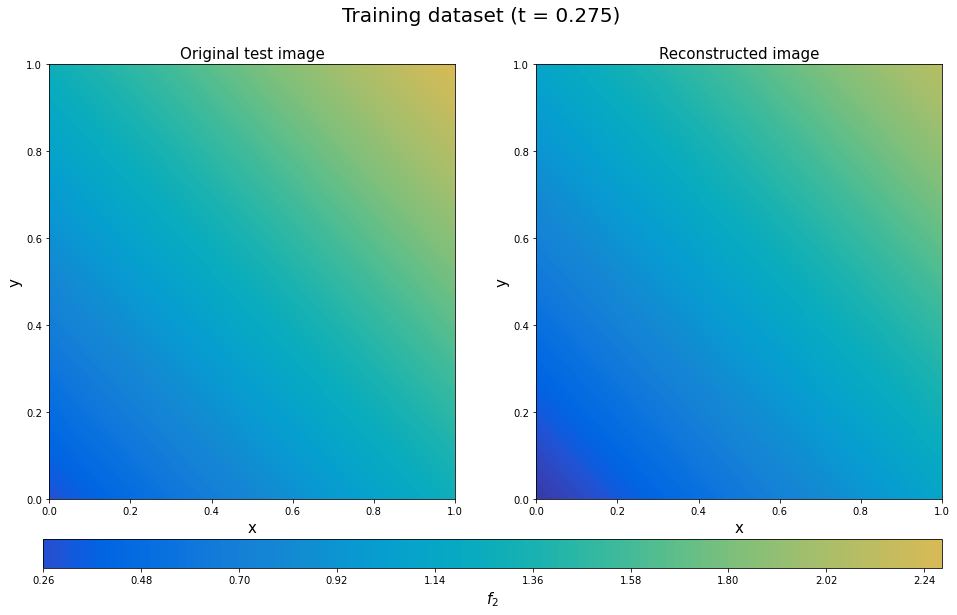

In [83]:
plt.figure(figsize=(16, 8))
y_train2_14_rotate = y_train2[14].T.reshape(101,101)
decoded_rotate2 = decoded_train2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_14_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[11]),fontsize=20)
plt.show()

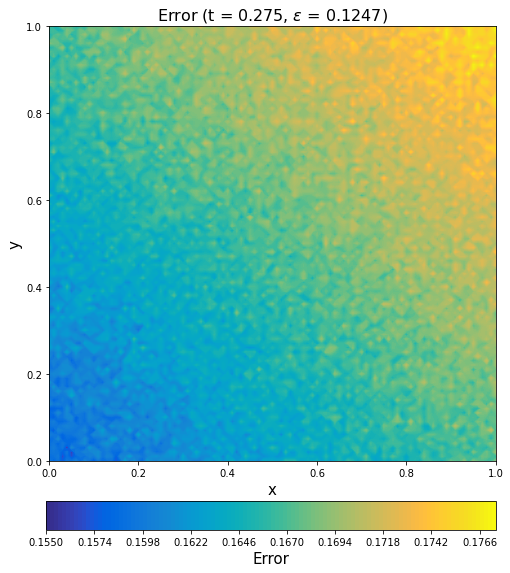

In [84]:
error_train_abs2_rotate14 = error_train_abs2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate14, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.275, $\epsilon$ = %.4f)' %(l2_error_train_list2[14]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

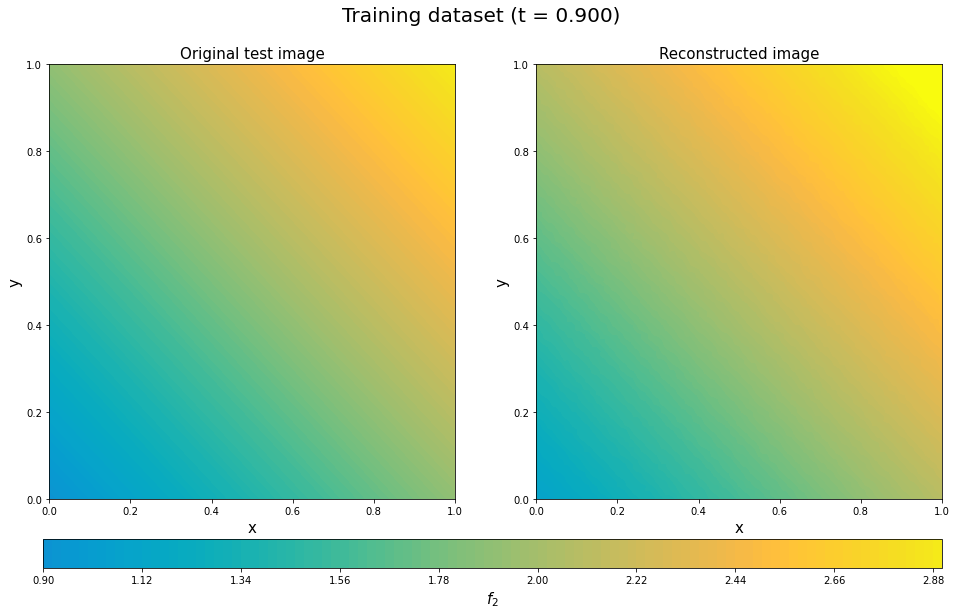

In [85]:
plt.figure(figsize=(16, 8))
y_train2_22_rotate = y_train2[22].T.reshape(101,101)
decoded_rotate2 = decoded_train2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_22_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[36]), fontsize=20)
plt.show()

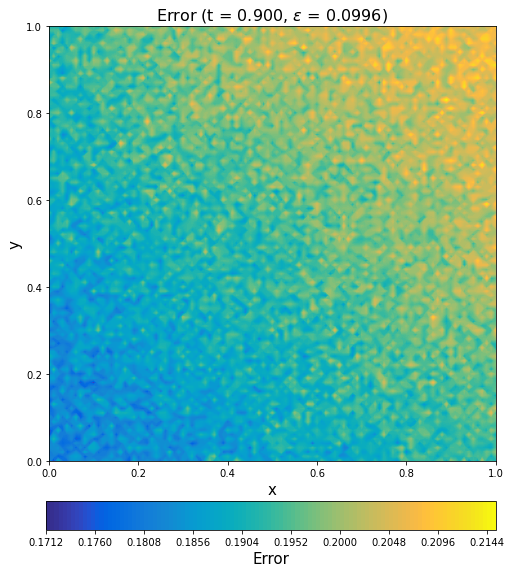

In [86]:
error_train_abs2_rotate22 = error_train_abs2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate22, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.900, $\epsilon$ = %.4f)' %(l2_error_train_list2[22]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

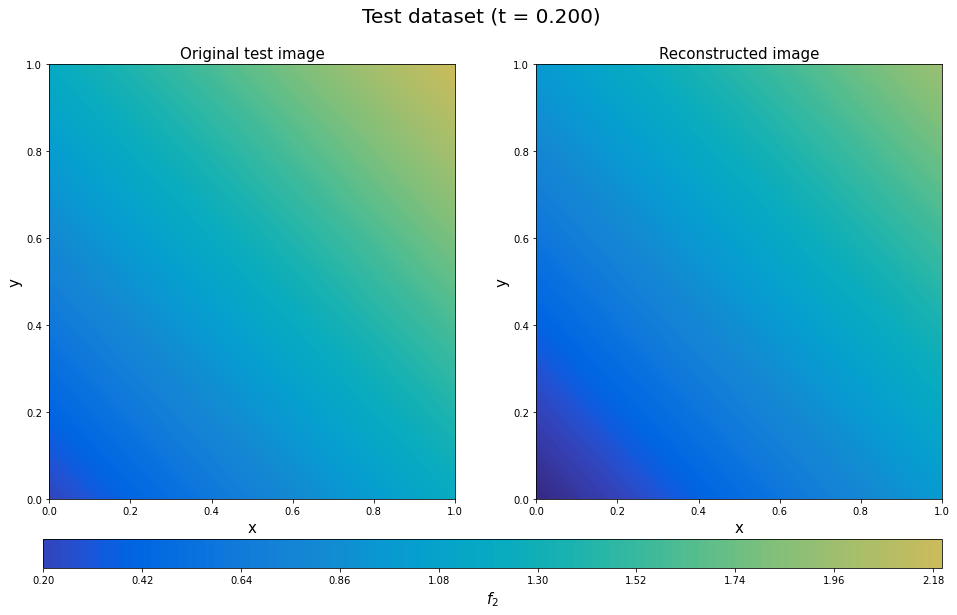

In [87]:
plt.figure(figsize=(16, 8))
y_test2_2_rotate = y_test2[2].T.reshape(101,101)
decoded_rotate2 = decoded_test2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

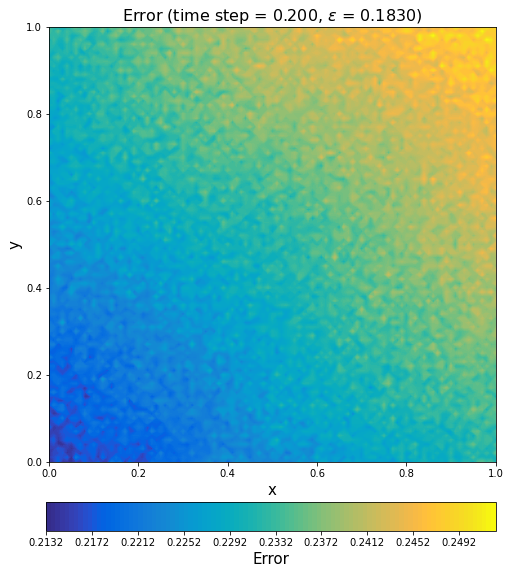

In [88]:
error_test_abs2_rotate2 = error_test_abs2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (time step = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list2[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

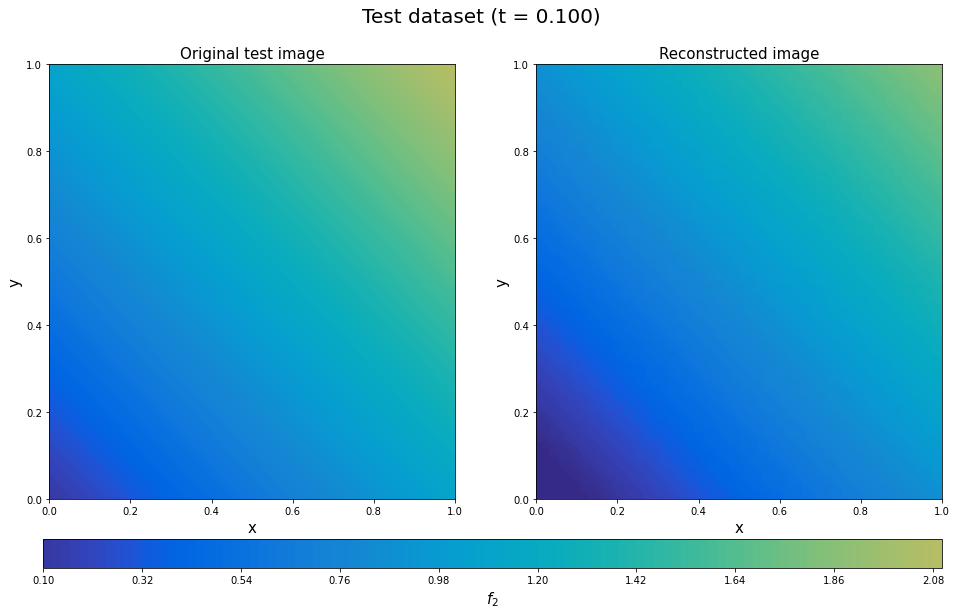

In [89]:
plt.figure(figsize=(16, 8))
y_test2_4_rotate = y_test2[4].T.reshape(101,101)
decoded_rotate2 = decoded_test2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_4_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[4]),fontsize=20)
plt.show()

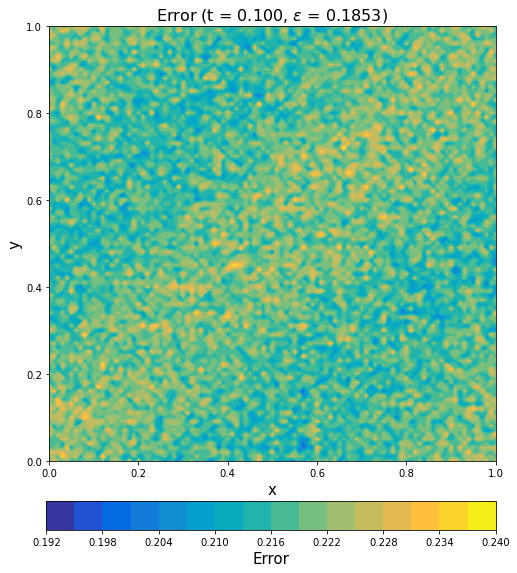

In [90]:
error_test_abs2_rotate4 = error_test_abs2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate4, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.100, $\epsilon$ = %.4f)' %(l2_error_test_list2[4]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 3: f3

In [91]:
out3 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out3[i, j, k] = np.exp(-t[i])*(2*np.sin(2*np.pi*x[j]) + np.sin(2*np.pi*x[j])*np.cos(2*np.pi*y[k]))

In [92]:
sensor3 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor3[i, j, k] = out3[i, 20*(j+1)+1, 20*(k+1)+1]

In [93]:
sensor3 = sensor3.reshape((41, 16, 1))

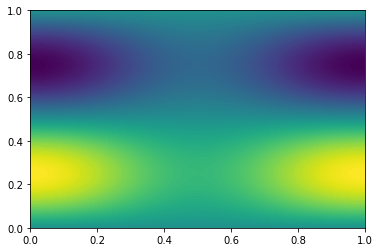

In [94]:
plt.contourf(xmesh, ymesh, out3[0,:,:], levels=128)

In [95]:
x_train3, x_test3, y_train3, y_test3, t_train, t_test = train_test_split(sensor3, out3, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [96]:
x_test3

array([[[ 1.19533543],
        [ 0.61432027],
        [ 0.65355792],
        [ 1.25882328],
        [ 0.66126769],
        [ 0.33984615],
        [ 0.36155269],
        [ 0.6963896 ],
        [-0.78664952],
        [-0.4042838 ],
        [-0.43010607],
        [-0.82843084],
        [-1.14744383],
        [-0.58970728],
        [-0.62737286],
        [-1.20838802]],

       [[ 1.57369576],
        [ 0.80877148],
        [ 0.86042905],
        [ 1.65727946],
        [ 0.8705792 ],
        [ 0.44741788],
        [ 0.4759952 ],
        [ 0.91681827],
        [-1.03564822],
        [-0.53225202],
        [-0.56624783],
        [-1.09065461],
        [-1.510645  ],
        [-0.77636772],
        [-0.82595561],
        [-1.59087989]],

       [[ 1.78323092],
        [ 0.91645815],
        [ 0.97499384],
        [ 1.87794366],
        [ 0.98649548],
        [ 0.50699088],
        [ 0.53937323],
        [ 1.03889121],
        [-1.17354318],
        [-0.60312055],
        [-0.64164286],
       

In [97]:
sensor_pred3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [98]:
start3 = datetime.datetime.now()
history3 = sensor_pred3.fit(t_train, x_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 15ms/step - loss: 3.8217 - rmse: 1.9549
Epoch 2/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.8017 - rmse: 1.9498
Epoch 3/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7860 - rmse: 1.9457
Epoch 4/10000
2/2 [==============================] - 0s 57ms/step - loss: 3.7735 - rmse: 1.9425
Epoch 5/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7622 - rmse: 1.9396
Epoch 6/10000
2/2 [==============================] - 0s 25ms/step - loss: 3.7513 - rmse: 1.9368
Epoch 7/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7428 - rmse: 1.9346
Epoch 8/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7345 - rmse: 1.9324
Epoch 9/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.7292 - rmse: 1.9311
Epoch 10/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7246 - rmse: 1.9299
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 13ms/step - loss: 3.4314 - rmse: 1.8524
Epoch 86/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.4277 - rmse: 1.8514
Epoch 87/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.4239 - rmse: 1.8503
Epoch 88/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.4203 - rmse: 1.8494
Epoch 89/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.4166 - rmse: 1.8484
Epoch 90/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.4128 - rmse: 1.8473
Epoch 91/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.4091 - rmse: 1.8463
Epoch 92/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.4054 - rmse: 1.8453
Epoch 93/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.4017 - rmse: 1.8443
Epoch 94/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.3980 - rmse: 1.8433
Epoch 95/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 3.1195 - rmse: 1.7662
Epoch 170/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.1161 - rmse: 1.7652
Epoch 171/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1123 - rmse: 1.7641
Epoch 172/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1090 - rmse: 1.7632
Epoch 173/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.1050 - rmse: 1.7621
Epoch 174/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1011 - rmse: 1.7609
Epoch 175/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0974 - rmse: 1.7599
Epoch 176/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0943 - rmse: 1.7590
Epoch 177/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.0899 - rmse: 1.7578
Epoch 178/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0866 - rmse: 1.7568
Epoch 179/10000
2/2 [===================

2/2 [==============================] - 0s 10ms/step - loss: 2.8491 - rmse: 1.6879
Epoch 254/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8455 - rmse: 1.6868
Epoch 255/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8433 - rmse: 1.6862
Epoch 256/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8398 - rmse: 1.6851
Epoch 257/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8370 - rmse: 1.6843
Epoch 258/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8340 - rmse: 1.6834
Epoch 259/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8312 - rmse: 1.6826
Epoch 260/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8280 - rmse: 1.6816
Epoch 261/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8254 - rmse: 1.6809
Epoch 262/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8224 - rmse: 1.6800
Epoch 263/10000
2/2 [===================

2/2 [==============================] - 0s 14ms/step - loss: 2.6184 - rmse: 1.6181
Epoch 337/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6155 - rmse: 1.6172
Epoch 338/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6129 - rmse: 1.6164
Epoch 339/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6110 - rmse: 1.6158
Epoch 340/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6077 - rmse: 1.6148
Epoch 341/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6059 - rmse: 1.6142
Epoch 342/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6029 - rmse: 1.6133
Epoch 343/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6013 - rmse: 1.6128
Epoch 344/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.5974 - rmse: 1.6116
Epoch 345/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.5969 - rmse: 1.6114
Epoch 346/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 2.4123 - rmse: 1.5531
Epoch 420/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4102 - rmse: 1.5524
Epoch 421/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.4077 - rmse: 1.5516
Epoch 422/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.4058 - rmse: 1.5510
Epoch 423/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.4028 - rmse: 1.5501
Epoch 424/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4008 - rmse: 1.5494
Epoch 425/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.3982 - rmse: 1.5486
Epoch 426/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.3969 - rmse: 1.5482
Epoch 427/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.3935 - rmse: 1.5471
Epoch 428/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3918 - rmse: 1.5465
Epoch 429/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 2.2266 - rmse: 1.4922
Epoch 503/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.2255 - rmse: 1.4918
Epoch 504/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.2235 - rmse: 1.4911
Epoch 505/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.2215 - rmse: 1.4904
Epoch 506/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.2185 - rmse: 1.4894
Epoch 507/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2161 - rmse: 1.4886
Epoch 508/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.2140 - rmse: 1.4879
Epoch 509/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.2132 - rmse: 1.4877
Epoch 510/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.2102 - rmse: 1.4866
Epoch 511/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.2089 - rmse: 1.4862
Epoch 512/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 2.0584 - rmse: 1.4347
Epoch 586/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.0577 - rmse: 1.4344
Epoch 587/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0559 - rmse: 1.4338
Epoch 588/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0527 - rmse: 1.4327
Epoch 589/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0517 - rmse: 1.4323
Epoch 590/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0493 - rmse: 1.4315
Epoch 591/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0476 - rmse: 1.4309
Epoch 592/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.0463 - rmse: 1.4304
Epoch 593/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0432 - rmse: 1.4294
Epoch 594/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0435 - rmse: 1.4295
Epoch 595/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 1.9056 - rmse: 1.3804
Epoch 669/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.9042 - rmse: 1.3799
Epoch 670/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.9023 - rmse: 1.3792
Epoch 671/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.9007 - rmse: 1.3786
Epoch 672/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8986 - rmse: 1.3778
Epoch 673/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8974 - rmse: 1.3774
Epoch 674/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8957 - rmse: 1.3768
Epoch 675/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8960 - rmse: 1.3769
Epoch 676/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8921 - rmse: 1.3755
Epoch 677/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8898 - rmse: 1.3746
Epoch 678/10000
2/2 [===============

2/2 [==============================] - 0s 13ms/step - loss: 1.7667 - rmse: 1.3291
Epoch 752/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.7653 - rmse: 1.3286
Epoch 753/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7633 - rmse: 1.3279
Epoch 754/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7617 - rmse: 1.3273
Epoch 755/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7599 - rmse: 1.3266
Epoch 756/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7585 - rmse: 1.3260
Epoch 757/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7575 - rmse: 1.3257
Epoch 758/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7551 - rmse: 1.3247
Epoch 759/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7559 - rmse: 1.3251
Epoch 760/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7522 - rmse: 1.3237
Epoch 761/10000
2/2 [===============

2/2 [==============================] - 0s 13ms/step - loss: 1.6389 - rmse: 1.2801
Epoch 835/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6375 - rmse: 1.2796
Epoch 836/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6354 - rmse: 1.2788
Epoch 837/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6340 - rmse: 1.2782
Epoch 838/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6356 - rmse: 1.2788
Epoch 839/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.6341 - rmse: 1.2783
Epoch 840/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6304 - rmse: 1.2768
Epoch 841/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6280 - rmse: 1.2759
Epoch 842/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6281 - rmse: 1.2759
Epoch 843/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6257 - rmse: 1.2750
Epoch 844/10000
2/2 [===============

2/2 [==============================] - 0s 13ms/step - loss: 1.5249 - rmse: 1.2348
Epoch 918/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5215 - rmse: 1.2334
Epoch 919/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5216 - rmse: 1.2335
Epoch 920/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5198 - rmse: 1.2328
Epoch 921/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5175 - rmse: 1.2318
Epoch 922/10000
2/2 [==============================] - 0s 20ms/step - loss: 1.5169 - rmse: 1.2316
Epoch 923/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5160 - rmse: 1.2312
Epoch 924/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5137 - rmse: 1.2303
Epoch 925/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5130 - rmse: 1.2300
Epoch 926/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5110 - rmse: 1.2292
Epoch 927/10000
2/2 [===============

2/2 [==============================] - 0s 13ms/step - loss: 1.4171 - rmse: 1.1904
Epoch 1001/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4147 - rmse: 1.1894
Epoch 1002/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.4132 - rmse: 1.1887
Epoch 1003/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.4108 - rmse: 1.1877
Epoch 1004/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4097 - rmse: 1.1873
Epoch 1005/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.4083 - rmse: 1.1867
Epoch 1006/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.4070 - rmse: 1.1861
Epoch 1007/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4057 - rmse: 1.1856
Epoch 1008/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4057 - rmse: 1.1856
Epoch 1009/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4033 - rmse: 1.1845
Epoch 1010/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 1.3175 - rmse: 1.1477
Epoch 1083/10000
2/2 [==============================] - 0s 24ms/step - loss: 1.3166 - rmse: 1.1474
Epoch 1084/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3139 - rmse: 1.1462
Epoch 1085/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3127 - rmse: 1.1457
Epoch 1086/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3126 - rmse: 1.1456
Epoch 1087/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3105 - rmse: 1.1447
Epoch 1088/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3100 - rmse: 1.1445
Epoch 1089/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3096 - rmse: 1.1443
Epoch 1090/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3084 - rmse: 1.1438
Epoch 1091/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3059 - rmse: 1.1427
Epoch 1092/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 1.2267 - rmse: 1.1075
Epoch 1165/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2273 - rmse: 1.1078
Epoch 1166/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2238 - rmse: 1.1062
Epoch 1167/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2215 - rmse: 1.1052
Epoch 1168/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2209 - rmse: 1.1049
Epoch 1169/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.2222 - rmse: 1.1054
Epoch 1170/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.2211 - rmse: 1.1050
Epoch 1171/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2189 - rmse: 1.1040
Epoch 1172/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2167 - rmse: 1.1030
Epoch 1173/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2170 - rmse: 1.1031
Epoch 1174/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 1.1410 - rmse: 1.0681
Epoch 1247/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1393 - rmse: 1.0673
Epoch 1248/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1391 - rmse: 1.0672
Epoch 1249/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1379 - rmse: 1.0667
Epoch 1250/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1376 - rmse: 1.0665
Epoch 1251/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1361 - rmse: 1.0658
Epoch 1252/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1345 - rmse: 1.0651
Epoch 1253/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1351 - rmse: 1.0653
Epoch 1254/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1355 - rmse: 1.0655
Epoch 1255/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1335 - rmse: 1.0646
Epoch 1256/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 1.0621 - rmse: 1.0305
Epoch 1329/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0625 - rmse: 1.0307
Epoch 1330/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.0609 - rmse: 1.0299
Epoch 1331/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.0596 - rmse: 1.0293
Epoch 1332/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0587 - rmse: 1.0289
Epoch 1333/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0578 - rmse: 1.0284
Epoch 1334/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0587 - rmse: 1.0288
Epoch 1335/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.0568 - rmse: 1.0279
Epoch 1336/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0550 - rmse: 1.0271
Epoch 1337/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0546 - rmse: 1.0268
Epoch 1338/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.9922 - rmse: 0.9960
Epoch 1411/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9883 - rmse: 0.9941
Epoch 1412/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9874 - rmse: 0.9936
Epoch 1413/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9878 - rmse: 0.9938
Epoch 1414/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.9859 - rmse: 0.9928
Epoch 1415/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.9866 - rmse: 0.9932
Epoch 1416/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9888 - rmse: 0.9943
Epoch 1417/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.9842 - rmse: 0.9920
Epoch 1418/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9844 - rmse: 0.9921
Epoch 1419/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9825 - rmse: 0.9911
Epoch 1420/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.9222 - rmse: 0.9602
Epoch 1493/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9200 - rmse: 0.9591
Epoch 1494/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9206 - rmse: 0.9594
Epoch 1495/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9185 - rmse: 0.9583
Epoch 1496/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9192 - rmse: 0.9586
Epoch 1497/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.9180 - rmse: 0.9581
Epoch 1498/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9160 - rmse: 0.9570
Epoch 1499/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9166 - rmse: 0.9573
Epoch 1500/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.9151 - rmse: 0.9565
Epoch 1501/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.9149 - rmse: 0.9564
Epoch 1502/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.8593 - rmse: 0.9269
Epoch 1575/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.8577 - rmse: 0.9261
Epoch 1576/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8570 - rmse: 0.9257
Epoch 1577/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.8596 - rmse: 0.9271
Epoch 1578/10000
2/2 [==============================] - 0s 30ms/step - loss: 0.8558 - rmse: 0.9250
Epoch 1579/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8564 - rmse: 0.9253
Epoch 1580/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.8554 - rmse: 0.9248
Epoch 1581/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.8538 - rmse: 0.9239
Epoch 1582/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.8540 - rmse: 0.9240
Epoch 1583/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8514 - rmse: 0.9226
Epoch 1584/10000
2/2 [=====

Epoch 1657/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7983 - rmse: 0.8934
Epoch 1658/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.8027 - rmse: 0.8959
Epoch 1659/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7973 - rmse: 0.8928
Epoch 1660/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8013 - rmse: 0.8951
Epoch 1661/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7963 - rmse: 0.8923
Epoch 1662/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7962 - rmse: 0.8922
Epoch 1663/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7947 - rmse: 0.8914
Epoch 1664/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7944 - rmse: 0.8912
Epoch 1665/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7932 - rmse: 0.8905
Epoch 1666/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7963 - rmse: 0.8923
Epoch 1667/1

2/2 [==============================] - 0s 14ms/step - loss: 0.7473 - rmse: 0.8644
Epoch 1740/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.7437 - rmse: 0.8623
Epoch 1741/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.7421 - rmse: 0.8613
Epoch 1742/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.7431 - rmse: 0.8619
Epoch 1743/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7415 - rmse: 0.8610
Epoch 1744/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.7407 - rmse: 0.8606
Epoch 1745/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.7395 - rmse: 0.8599
Epoch 1746/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.7388 - rmse: 0.8595
Epoch 1747/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.7382 - rmse: 0.8591
Epoch 1748/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.7379 - rmse: 0.8589
Epoch 1749/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.6931 - rmse: 0.8324
Epoch 1823/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6905 - rmse: 0.8309
Epoch 1824/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6909 - rmse: 0.8311
Epoch 1825/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6908 - rmse: 0.8310
Epoch 1826/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6886 - rmse: 0.8297
Epoch 1827/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6881 - rmse: 0.8294
Epoch 1828/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6876 - rmse: 0.8291
Epoch 1829/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6876 - rmse: 0.8291
Epoch 1830/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6863 - rmse: 0.8284
Epoch 1831/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6874 - rmse: 0.8290
Epoch 1832/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.6438 - rmse: 0.8023
Epoch 1906/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6420 - rmse: 0.8012
Epoch 1907/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6410 - rmse: 0.8005
Epoch 1908/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6422 - rmse: 0.8013
Epoch 1909/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6449 - rmse: 0.8030
Epoch 1910/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6396 - rmse: 0.7996
Epoch 1911/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6384 - rmse: 0.7989
Epoch 1912/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6395 - rmse: 0.7996
Epoch 1913/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6420 - rmse: 0.8012
Epoch 1914/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.6385 - rmse: 0.7990
Epoch 1915/10000
2/2 [========

2/2 [==============================] - 0s 12ms/step - loss: 0.5995 - rmse: 0.7742
Epoch 1989/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5968 - rmse: 0.7724
Epoch 1990/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6019 - rmse: 0.7757
Epoch 1991/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5983 - rmse: 0.7734
Epoch 1992/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5955 - rmse: 0.7716
Epoch 1993/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5984 - rmse: 0.7734
Epoch 1994/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5958 - rmse: 0.7718
Epoch 1995/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5958 - rmse: 0.7718
Epoch 1996/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5953 - rmse: 0.7715
Epoch 1997/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5927 - rmse: 0.7698
Epoch 1998/10000
2/2 [======

2/2 [==============================] - 0s 12ms/step - loss: 0.5565 - rmse: 0.7459
Epoch 2072/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5545 - rmse: 0.7446
Epoch 2073/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5555 - rmse: 0.7452
Epoch 2074/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5558 - rmse: 0.7454
Epoch 2075/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5545 - rmse: 0.7445
Epoch 2076/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5579 - rmse: 0.7468
Epoch 2077/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5529 - rmse: 0.7435
Epoch 2078/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5535 - rmse: 0.7438
Epoch 2079/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5529 - rmse: 0.7435
Epoch 2080/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5502 - rmse: 0.7417
Epoch 2081/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.5160 - rmse: 0.7183
Epoch 2154/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5147 - rmse: 0.7173
Epoch 2155/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5145 - rmse: 0.7172
Epoch 2156/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5154 - rmse: 0.7178
Epoch 2157/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5161 - rmse: 0.7183
Epoch 2158/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5162 - rmse: 0.7184
Epoch 2159/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5117 - rmse: 0.7152
Epoch 2160/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5122 - rmse: 0.7156
Epoch 2161/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5114 - rmse: 0.7150
Epoch 2162/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5109 - rmse: 0.7147
Epoch 2163/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.4795 - rmse: 0.6924
Epoch 2236/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4783 - rmse: 0.6915
Epoch 2237/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4796 - rmse: 0.6924
Epoch 2238/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4755 - rmse: 0.6894
Epoch 2239/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4809 - rmse: 0.6933
Epoch 2240/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4748 - rmse: 0.6889
Epoch 2241/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4763 - rmse: 0.6900
Epoch 2242/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4743 - rmse: 0.6886
Epoch 2243/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4741 - rmse: 0.6885
Epoch 2244/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4736 - rmse: 0.6880
Epoch 2245/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.4440 - rmse: 0.6662
Epoch 2318/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4413 - rmse: 0.6642
Epoch 2319/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4430 - rmse: 0.6654
Epoch 2320/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4432 - rmse: 0.6656
Epoch 2321/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4412 - rmse: 0.6641
Epoch 2322/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4397 - rmse: 0.6630
Epoch 2323/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4392 - rmse: 0.6626
Epoch 2324/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4400 - rmse: 0.6632
Epoch 2325/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4393 - rmse: 0.6627
Epoch 2326/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4389 - rmse: 0.6624
Epoch 2327/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.4111 - rmse: 0.6411
Epoch 2400/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4091 - rmse: 0.6395
Epoch 2401/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4093 - rmse: 0.6397
Epoch 2402/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4095 - rmse: 0.6398
Epoch 2403/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4089 - rmse: 0.6394
Epoch 2404/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4071 - rmse: 0.6379
Epoch 2405/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4067 - rmse: 0.6376
Epoch 2406/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4062 - rmse: 0.6372
Epoch 2407/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4077 - rmse: 0.6384
Epoch 2408/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4056 - rmse: 0.6367
Epoch 2409/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.3798 - rmse: 0.6161
Epoch 2482/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3782 - rmse: 0.6149
Epoch 2483/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3827 - rmse: 0.6185
Epoch 2484/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3786 - rmse: 0.6151
Epoch 2485/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3764 - rmse: 0.6134
Epoch 2486/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3756 - rmse: 0.6127
Epoch 2487/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3805 - rmse: 0.6167
Epoch 2488/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3756 - rmse: 0.6127
Epoch 2489/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3744 - rmse: 0.6118
Epoch 2490/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.3742 - rmse: 0.6116
Epoch 2491/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.3476 - rmse: 0.5894
Epoch 2564/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3482 - rmse: 0.5900
Epoch 2565/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3480 - rmse: 0.5898
Epoch 2566/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3476 - rmse: 0.5894
Epoch 2567/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3480 - rmse: 0.5898
Epoch 2568/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3473 - rmse: 0.5892
Epoch 2569/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3460 - rmse: 0.5881
Epoch 2570/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3480 - rmse: 0.5898
Epoch 2571/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.3471 - rmse: 0.5891
Epoch 2572/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3447 - rmse: 0.5870
Epoch 2573/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.3213 - rmse: 0.5667
Epoch 2646/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3208 - rmse: 0.5663
Epoch 2647/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.3199 - rmse: 0.5655
Epoch 2648/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3202 - rmse: 0.5657
Epoch 2649/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3189 - rmse: 0.5646
Epoch 2650/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3202 - rmse: 0.5657
Epoch 2651/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3202 - rmse: 0.5657
Epoch 2652/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3182 - rmse: 0.5640
Epoch 2653/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3173 - rmse: 0.5632
Epoch 2654/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3187 - rmse: 0.5644
Epoch 2655/10000
2/2 [=====

2/2 [==============================] - 0s 9ms/step - loss: 0.2934 - rmse: 0.5415
Epoch 2729/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2971 - rmse: 0.5450
Epoch 2730/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2937 - rmse: 0.5418
Epoch 2731/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2940 - rmse: 0.5421
Epoch 2732/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2970 - rmse: 0.5449
Epoch 2733/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2906 - rmse: 0.5390
Epoch 2734/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2955 - rmse: 0.5435
Epoch 2735/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2906 - rmse: 0.5390
Epoch 2736/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2898 - rmse: 0.5382
Epoch 2737/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2905 - rmse: 0.5388
Epoch 2738/10000
2/2 [=========

2/2 [==============================] - 0s 9ms/step - loss: 0.2682 - rmse: 0.5178
Epoch 2812/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2670 - rmse: 0.5166
Epoch 2813/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2649 - rmse: 0.5145
Epoch 2814/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2666 - rmse: 0.5162
Epoch 2815/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2657 - rmse: 0.5153
Epoch 2816/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2658 - rmse: 0.5154
Epoch 2817/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2644 - rmse: 0.5140
Epoch 2818/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2645 - rmse: 0.5142
Epoch 2819/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2632 - rmse: 0.5129
Epoch 2820/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2632 - rmse: 0.5129
Epoch 2821/10000
2/2 [=========

2/2 [==============================] - 0s 14ms/step - loss: 0.2427 - rmse: 0.4925
Epoch 2895/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2438 - rmse: 0.4936
Epoch 2896/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2425 - rmse: 0.4923
Epoch 2897/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2467 - rmse: 0.4965
Epoch 2898/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2427 - rmse: 0.4925
Epoch 2899/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2403 - rmse: 0.4901
Epoch 2900/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2410 - rmse: 0.4907
Epoch 2901/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2409 - rmse: 0.4907
Epoch 2902/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2391 - rmse: 0.4889
Epoch 2903/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2392 - rmse: 0.4889
Epoch 2904/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.2178 - rmse: 0.4666
Epoch 2977/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2217 - rmse: 0.4707
Epoch 2978/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2173 - rmse: 0.4660
Epoch 2979/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2168 - rmse: 0.4655
Epoch 2980/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2190 - rmse: 0.4679
Epoch 2981/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2193 - rmse: 0.4681
Epoch 2982/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2161 - rmse: 0.4647
Epoch 2983/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2182 - rmse: 0.4669
Epoch 2984/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2155 - rmse: 0.4641
Epoch 2985/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2183 - rmse: 0.4671
Epoch 2986/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.1970 - rmse: 0.4437
Epoch 3059/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1977 - rmse: 0.4445
Epoch 3060/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1975 - rmse: 0.4442
Epoch 3061/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1955 - rmse: 0.4420
Epoch 3062/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1975 - rmse: 0.4442
Epoch 3063/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1980 - rmse: 0.4448
Epoch 3064/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1955 - rmse: 0.4420
Epoch 3065/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1966 - rmse: 0.4432
Epoch 3066/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1945 - rmse: 0.4408
Epoch 3067/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1968 - rmse: 0.4435
Epoch 3068/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.1784 - rmse: 0.4221
Epoch 3141/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1751 - rmse: 0.4183
Epoch 3142/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1766 - rmse: 0.4201
Epoch 3143/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1773 - rmse: 0.4209
Epoch 3144/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1750 - rmse: 0.4182
Epoch 3145/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1754 - rmse: 0.4186
Epoch 3146/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1766 - rmse: 0.4201
Epoch 3147/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1757 - rmse: 0.4190
Epoch 3148/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1735 - rmse: 0.4163
Epoch 3149/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1757 - rmse: 0.4190
Epoch 3150/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.1563 - rmse: 0.3951
Epoch 3223/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1561 - rmse: 0.3950
Epoch 3224/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1585 - rmse: 0.3979
Epoch 3225/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1567 - rmse: 0.3957
Epoch 3226/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1567 - rmse: 0.3956
Epoch 3227/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1614 - rmse: 0.4016
Epoch 3228/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1560 - rmse: 0.3948
Epoch 3229/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1556 - rmse: 0.3943
Epoch 3230/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1571 - rmse: 0.3962
Epoch 3231/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1551 - rmse: 0.3936
Epoch 3232/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.1403 - rmse: 0.3743
Epoch 3305/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1413 - rmse: 0.3757
Epoch 3306/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1391 - rmse: 0.3728
Epoch 3307/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1409 - rmse: 0.3752
Epoch 3308/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1434 - rmse: 0.3785
Epoch 3309/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1391 - rmse: 0.3728
Epoch 3310/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1375 - rmse: 0.3707
Epoch 3311/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1405 - rmse: 0.3747
Epoch 3312/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1378 - rmse: 0.3711
Epoch 3313/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1401 - rmse: 0.3741
Epoch 3314/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.1256 - rmse: 0.3542
Epoch 3388/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1266 - rmse: 0.3556
Epoch 3389/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1235 - rmse: 0.3512
Epoch 3390/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1280 - rmse: 0.3575
Epoch 3391/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1214 - rmse: 0.3482
Epoch 3392/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1267 - rmse: 0.3557
Epoch 3393/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1243 - rmse: 0.3524
Epoch 3394/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1241 - rmse: 0.3520
Epoch 3395/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1209 - rmse: 0.3475
Epoch 3396/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1206 - rmse: 0.3471
Epoch 3397/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.1086 - rmse: 0.3294
Epoch 3471/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1092 - rmse: 0.3302
Epoch 3472/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1133 - rmse: 0.3363
Epoch 3473/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1067 - rmse: 0.3264
Epoch 3474/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1092 - rmse: 0.3302
Epoch 3475/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1082 - rmse: 0.3287
Epoch 3476/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1071 - rmse: 0.3271
Epoch 3477/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1061 - rmse: 0.3255
Epoch 3478/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1057 - rmse: 0.3249
Epoch 3479/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1066 - rmse: 0.3263
Epoch 3480/10000
2/2 [==========

2/2 [==============================] - 0s 9ms/step - loss: 0.0948 - rmse: 0.3076
Epoch 3554/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0963 - rmse: 0.3101
Epoch 3555/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0990 - rmse: 0.3144
Epoch 3556/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0989 - rmse: 0.3142
Epoch 3557/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0930 - rmse: 0.3047
Epoch 3558/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0929 - rmse: 0.3045
Epoch 3559/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0952 - rmse: 0.3083
Epoch 3560/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0933 - rmse: 0.3052
Epoch 3561/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0951 - rmse: 0.3082
Epoch 3562/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0955 - rmse: 0.3089
Epoch 3563/10000
2/2 [===============

2/2 [==============================] - 0s 13ms/step - loss: 0.0851 - rmse: 0.2916
Epoch 3637/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0821 - rmse: 0.2863
Epoch 3638/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0814 - rmse: 0.2850
Epoch 3639/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0816 - rmse: 0.2854
Epoch 3640/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0867 - rmse: 0.2942
Epoch 3641/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0839 - rmse: 0.2894
Epoch 3642/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0834 - rmse: 0.2886
Epoch 3643/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0839 - rmse: 0.2894
Epoch 3644/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0852 - rmse: 0.2917
Epoch 3645/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0822 - rmse: 0.2865
Epoch 3646/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0718 - rmse: 0.2677
Epoch 3719/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0723 - rmse: 0.2686
Epoch 3720/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0711 - rmse: 0.2664
Epoch 3721/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0704 - rmse: 0.2651
Epoch 3722/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0710 - rmse: 0.2663
Epoch 3723/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0703 - rmse: 0.2649
Epoch 3724/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0702 - rmse: 0.2648
Epoch 3725/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0710 - rmse: 0.2663
Epoch 3726/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0730 - rmse: 0.2699
Epoch 3727/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0726 - rmse: 0.2691
Epoch 3728/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0617 - rmse: 0.2482
Epoch 3801/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0616 - rmse: 0.2480
Epoch 3802/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0613 - rmse: 0.2473
Epoch 3803/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0608 - rmse: 0.2463
Epoch 3804/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0616 - rmse: 0.2479
Epoch 3805/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0626 - rmse: 0.2500
Epoch 3806/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0617 - rmse: 0.2482
Epoch 3807/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0678 - rmse: 0.2601
Epoch 3808/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0598 - rmse: 0.2443
Epoch 3809/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0633 - rmse: 0.2513
Epoch 3810/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0541 - rmse: 0.2323
Epoch 3883/10000
2/2 [==============================] - 0s 33ms/step - loss: 0.0596 - rmse: 0.2439
Epoch 3884/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.0534 - rmse: 0.2307
Epoch 3885/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0525 - rmse: 0.2289
Epoch 3886/10000
2/2 [==============================] - 0s 22ms/step - loss: 0.0524 - rmse: 0.2287
Epoch 3887/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0538 - rmse: 0.2316
Epoch 3888/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0510 - rmse: 0.2255
Epoch 3889/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0559 - rmse: 0.2363
Epoch 3890/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0537 - rmse: 0.2315
Epoch 3891/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0557 - rmse: 0.2358
Epoch 3892/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0450 - rmse: 0.2117
Epoch 3966/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0429 - rmse: 0.2069
Epoch 3967/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0436 - rmse: 0.2086
Epoch 3968/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0431 - rmse: 0.2072
Epoch 3969/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0433 - rmse: 0.2077
Epoch 3970/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0426 - rmse: 0.2060
Epoch 3971/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0437 - rmse: 0.2087
Epoch 3972/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0452 - rmse: 0.2122
Epoch 3973/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0433 - rmse: 0.2078
Epoch 3974/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0422 - rmse: 0.2052
Epoch 3975/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0368 - rmse: 0.1916
Epoch 4049/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0383 - rmse: 0.1955
Epoch 4050/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0375 - rmse: 0.1933
Epoch 4051/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0365 - rmse: 0.1908
Epoch 4052/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0368 - rmse: 0.1916
Epoch 4053/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0357 - rmse: 0.1886
Epoch 4054/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0364 - rmse: 0.1904
Epoch 4055/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0363 - rmse: 0.1903
Epoch 4056/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0406 - rmse: 0.2013
Epoch 4057/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0361 - rmse: 0.1898
Epoch 4058/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0295 - rmse: 0.1714
Epoch 4132/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0325 - rmse: 0.1799
Epoch 4133/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0321 - rmse: 0.1789
Epoch 4134/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0345 - rmse: 0.1856
Epoch 4135/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0345 - rmse: 0.1854
Epoch 4136/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0292 - rmse: 0.1706
Epoch 4137/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0292 - rmse: 0.1707
Epoch 4138/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0303 - rmse: 0.1736
Epoch 4139/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0320 - rmse: 0.1786
Epoch 4140/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0288 - rmse: 0.1695
Epoch 4141/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0253 - rmse: 0.1587
Epoch 4215/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0241 - rmse: 0.1549
Epoch 4216/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0262 - rmse: 0.1614
Epoch 4217/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0247 - rmse: 0.1568
Epoch 4218/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0266 - rmse: 0.1628
Epoch 4219/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0240 - rmse: 0.1546
Epoch 4220/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0245 - rmse: 0.1563
Epoch 4221/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0238 - rmse: 0.1539
Epoch 4222/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0321 - rmse: 0.1788
Epoch 4223/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0238 - rmse: 0.1538
Epoch 4224/10000
2/2 [=========

2/2 [==============================] - 0s 12ms/step - loss: 0.0199 - rmse: 0.1407
Epoch 4298/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0197 - rmse: 0.1400
Epoch 4299/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0214 - rmse: 0.1459
Epoch 4300/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0200 - rmse: 0.1409
Epoch 4301/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0221 - rmse: 0.1484
Epoch 4302/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0204 - rmse: 0.1424
Epoch 4303/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0220 - rmse: 0.1481
Epoch 4304/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0207 - rmse: 0.1434
Epoch 4305/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0222 - rmse: 0.1487
Epoch 4306/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0194 - rmse: 0.1389
Epoch 4307/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0173 - rmse: 0.1312
Epoch 4380/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0227 - rmse: 0.1503
Epoch 4381/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0165 - rmse: 0.1282
Epoch 4382/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0163 - rmse: 0.1273
Epoch 4383/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0194 - rmse: 0.1388
Epoch 4384/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0164 - rmse: 0.1277
Epoch 4385/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0184 - rmse: 0.1353
Epoch 4386/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0168 - rmse: 0.1290
Epoch 4387/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0161 - rmse: 0.1263
Epoch 4388/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0160 - rmse: 0.1261
Epoch 4389/10000
2/2 [==========

2/2 [==============================] - 0s 12ms/step - loss: 0.0134 - rmse: 0.1152
Epoch 4463/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0147 - rmse: 0.1208
Epoch 4464/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0216 - rmse: 0.1466
Epoch 4465/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0161 - rmse: 0.1266
Epoch 4466/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0214 - rmse: 0.1460
Epoch 4467/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0133 - rmse: 0.1150
Epoch 4468/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0136 - rmse: 0.1161
Epoch 4469/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0201 - rmse: 0.1415
Epoch 4470/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0143 - rmse: 0.1192
Epoch 4471/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0138 - rmse: 0.1171
Epoch 4472/10000
2/2 [=====

Epoch 4545/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0136 - rmse: 0.1162
Epoch 4546/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0142 - rmse: 0.1187
Epoch 4547/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0136 - rmse: 0.1160
Epoch 4548/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0127 - rmse: 0.1121
Epoch 4549/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0116 - rmse: 0.1074
Epoch 4550/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0135 - rmse: 0.1156
Epoch 4551/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0138 - rmse: 0.1169
Epoch 4552/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0118 - rmse: 0.1081
Epoch 4553/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0125 - rmse: 0.1116
Epoch 4554/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0105 - rmse: 0.1018
Epoch 4555/10

2/2 [==============================] - 0s 14ms/step - loss: 0.0171 - rmse: 0.1303
Epoch 4628/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0097 - rmse: 0.0982
Epoch 4629/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0085 - rmse: 0.0917
Epoch 4630/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0087 - rmse: 0.0927
Epoch 4631/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0110 - rmse: 0.1043
Epoch 4632/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0084 - rmse: 0.0912
Epoch 4633/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0085 - rmse: 0.0914
Epoch 4634/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0158 - rmse: 0.1255
Epoch 4635/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0084 - rmse: 0.0913
Epoch 4636/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0971
Epoch 4637/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0090 - rmse: 0.0941
Epoch 4710/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0883
Epoch 4711/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0101 - rmse: 0.1001
Epoch 4712/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 4713/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 4714/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 4715/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0826
Epoch 4716/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0089 - rmse: 0.0937
Epoch 4717/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 4718/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0878
Epoch 4719/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0089 - rmse: 0.0938
Epoch 4792/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0781
Epoch 4793/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0062 - rmse: 0.0780
Epoch 4794/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0108 - rmse: 0.1034
Epoch 4795/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0741
Epoch 4796/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0117 - rmse: 0.1076
Epoch 4797/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0076 - rmse: 0.0865
Epoch 4798/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0913
Epoch 4799/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0737
Epoch 4800/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0065 - rmse: 0.0799
Epoch 4801/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0733
Epoch 4874/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0818
Epoch 4875/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0655
Epoch 4876/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 4877/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 4878/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0779
Epoch 4879/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0128 - rmse: 0.1128
Epoch 4880/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 4881/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0095 - rmse: 0.0972
Epoch 4882/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0654
Epoch 4883/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0774
Epoch 4956/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 4957/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0073 - rmse: 0.0850
Epoch 4958/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0032 - rmse: 0.0555
Epoch 4959/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0044 - rmse: 0.0658
Epoch 4960/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 4961/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0624
Epoch 4962/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0548
Epoch 4963/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 4964/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 4965/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0041 - rmse: 0.0631
Epoch 5038/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 5039/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0050 - rmse: 0.0703
Epoch 5040/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 5041/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 5042/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0053 - rmse: 0.0720
Epoch 5043/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 5044/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0699
Epoch 5045/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 5046/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 5047/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 5120/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 5121/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 5122/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 5123/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0074 - rmse: 0.0855
Epoch 5124/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0042 - rmse: 0.0640
Epoch 5125/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 5126/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 5127/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 5128/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0050 - rmse: 0.0703
Epoch 5129/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 5203/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0587
Epoch 5204/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0679
Epoch 5205/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 5206/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0101 - rmse: 0.1003
Epoch 5207/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0564
Epoch 5208/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 5209/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0564
Epoch 5210/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0677
Epoch 5211/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0741
Epoch 5212/10000
2/2 [========

2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0697
Epoch 5286/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0575
Epoch 5287/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 5288/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0348
Epoch 5289/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 5290/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0717
Epoch 5291/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0694
Epoch 5292/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 5293/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0450
Epoch 5294/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 5295/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 5369/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0528
Epoch 5370/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 5371/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0848
Epoch 5372/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 5373/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.8199e-04 - rmse: 0.0286
Epoch 5374/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 5375/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0788
Epoch 5376/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0372
Epoch 5377/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0083 - rmse: 0.0908
Epoch 5378/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 5451/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 5452/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 5453/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0405
Epoch 5454/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 5455/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0425
Epoch 5456/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8496e-04 - rmse: 0.0229
Epoch 5457/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0082 - rmse: 0.0900
Epoch 5458/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 5459/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.5776e-04 - rmse: 0.0282
Epoch 5460/10000
2/

2/2 [==============================] - 0s 13ms/step - loss: 0.0080 - rmse: 0.0892
Epoch 5532/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 5533/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.2237e-04 - rmse: 0.0215
Epoch 5534/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.6740e-04 - rmse: 0.0284
Epoch 5535/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0413
Epoch 5536/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.2419e-04 - rmse: 0.0258
Epoch 5537/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 5538/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.7092e-04 - rmse: 0.0203
Epoch 5539/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 5540/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.1309e-04 - rmse: 0.0235
Epoch 5

2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0609
Epoch 5613/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.0267e-04 - rmse: 0.0233
Epoch 5614/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 5615/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.9631e-04 - rmse: 0.0232
Epoch 5616/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 5617/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 5618/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0583
Epoch 5619/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.5537e-04 - rmse: 0.0244
Epoch 5620/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 5621/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 5622/1000

2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 5695/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.2937e-04 - rmse: 0.0217
Epoch 5696/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0347
Epoch 5697/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 5698/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 5699/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 5700/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 5701/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.1173e-04 - rmse: 0.0256
Epoch 5702/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 5703/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0567
Epoch 5704/10000
2/

2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0529
Epoch 5777/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5068e-04 - rmse: 0.0140
Epoch 5778/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.0999e-04 - rmse: 0.0213
Epoch 5779/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.5969e-04 - rmse: 0.0201
Epoch 5780/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.6155e-04 - rmse: 0.0175
Epoch 5781/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0333
Epoch 5782/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0058 - rmse: 0.0759
Epoch 5783/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0610
Epoch 5784/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 5785/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 5786/

2/2 [==============================] - 0s 19ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 5859/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0090 - rmse: 0.0944
Epoch 5860/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 5861/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.9214e-04 - rmse: 0.0184
Epoch 5862/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 5863/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 5864/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.8268e-04 - rmse: 0.0152
Epoch 5865/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 5866/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.0679e-04 - rmse: 0.0159
Epoch 5867/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0376
Epoch 5868/1000

2/2 [==============================] - 0s 11ms/step - loss: 1.3218e-04 - rmse: 0.0090
Epoch 5940/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 5941/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0657
Epoch 5942/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 5943/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6835e-04 - rmse: 0.0108
Epoch 5944/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2998e-04 - rmse: 0.0134
Epoch 5945/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 5946/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 5947/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.9319e-04 - rmse: 0.0119
Epoch 5948/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 5949/

2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0937
Epoch 6022/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2201e-04 - rmse: 0.0165
Epoch 6023/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 6024/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.3735e-04 - rmse: 0.0281
Epoch 6025/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 6026/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 6027/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0520
Epoch 6028/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 6029/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 6030/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 6031/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 6104/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 6105/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6106/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 6107/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 6108/10000
2/2 [==============================] - 0s 24ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 6109/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 6110/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 6111/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 6112/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7493e-04 - rmse: 0.0113
Epoch 6113/10000
2/2 [=

Epoch 6185/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 6186/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 6187/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 6188/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.0687e-04 - rmse: 0.0276
Epoch 6189/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.6132e-04 - rmse: 0.0177
Epoch 6190/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0522
Epoch 6191/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 6192/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.6455e-04 - rmse: 0.0147
Epoch 6193/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 6194/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.062

2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 6267/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0401
Epoch 6268/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 6269/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.4854e-04 - rmse: 0.0174
Epoch 6270/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 6271/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5447e-04 - rmse: 0.0104
Epoch 6272/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 6273/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0600
Epoch 6274/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.5491e-04 - rmse: 0.0202
Epoch 6275/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.6969e-04 - rmse: 0.0180
Epoch 6276/

Epoch 6348/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 6349/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 6350/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 6351/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1875e-04 - rmse: 0.0086
Epoch 6352/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 6353/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 6354/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4713e-04 - rmse: 0.0101
Epoch 6355/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.5632e-04 - rmse: 0.0267
Epoch 6356/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 6357/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.062

2/2 [==============================] - 0s 13ms/step - loss: 8.6647e-05 - rmse: 0.0066
Epoch 6430/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 6431/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.4124e-05 - rmse: 0.0064
Epoch 6432/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 6433/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.5294e-04 - rmse: 0.0202
Epoch 6434/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.5059e-05 - rmse: 0.0056
Epoch 6435/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 6436/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 6437/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 6438/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.2629e-04 - rmse: 0.0168
Epoch 6

2/2 [==============================] - 0s 13ms/step - loss: 9.9416e-04 - rmse: 0.0309
Epoch 6511/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0403
Epoch 6512/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 6513/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0404
Epoch 6514/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.3539e-04 - rmse: 0.0097
Epoch 6515/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 6516/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 6517/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0089 - rmse: 0.0941
Epoch 6518/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 6519/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.1003e-04 - rmse: 0.0164
Epoch 6520/1000

2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 6592/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 6593/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 6594/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 6595/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 6596/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0625
Epoch 6597/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 6598/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 6599/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4327e-04 - rmse: 0.0101
Epoch 6600/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.2485e-04 - rmse: 0.0092
Epoch 6601/10000
2/

2/2 [==============================] - 0s 22ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 6673/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 6674/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3425e-04 - rmse: 0.0139
Epoch 6675/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 6676/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 6677/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6045e-04 - rmse: 0.0179
Epoch 6678/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 6679/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.4490e-05 - rmse: 0.0059
Epoch 6680/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 6681/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 6682/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 6754/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 6755/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0088 - rmse: 0.0938
Epoch 6756/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 6757/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.8012e-04 - rmse: 0.0307
Epoch 6758/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.9243e-04 - rmse: 0.0188
Epoch 6759/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 6760/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 6761/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 6762/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 6763/10000
2/

2/2 [==============================] - 0s 13ms/step - loss: 2.3505e-04 - rmse: 0.0140
Epoch 6835/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 6836/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.4813e-04 - rmse: 0.0202
Epoch 6837/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 6838/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 6839/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 6840/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.8706e-05 - rmse: 0.0078
Epoch 6841/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4716e-04 - rmse: 0.0104
Epoch 6842/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 6843/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.2246e-04 - rmse: 0.0136
Epoch 6

2/2 [==============================] - 0s 11ms/step - loss: 2.5436e-04 - rmse: 0.0147
Epoch 6916/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 6917/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 6918/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3266e-04 - rmse: 0.0098
Epoch 6919/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0088 - rmse: 0.0938
Epoch 6920/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0088 - rmse: 0.0936
Epoch 6921/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 6922/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 6923/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4933e-04 - rmse: 0.0177
Epoch 6924/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6999e-04 - rmse: 0.0182
Epoch 6925/

2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 6997/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 6998/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 6999/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 7000/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 7001/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 7002/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 7003/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0320
Epoch 7004/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 7005/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 7006/10000
2/2 [=====

2/2 [==============================] - 0s 51ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 7078/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.5507e-04 - rmse: 0.0205
Epoch 7079/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4791e-04 - rmse: 0.0203
Epoch 7080/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0939
Epoch 7081/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.9757e-05 - rmse: 0.0066
Epoch 7082/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0935
Epoch 7083/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 7084/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 7085/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3294e-04 - rmse: 0.0140
Epoch 7086/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3995e-04 - rmse: 0.0174
Epoch 7087/1000

2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 7160/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 7161/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 7162/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 7163/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 7164/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0935
Epoch 7165/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5693e-04 - rmse: 0.0110
Epoch 7166/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 7167/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3753e-04 - rmse: 0.0101
Epoch 7168/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1630e-04 - rmse: 0.0135
Epoch 7169/10000
2/2 [===

2/2 [==============================] - 0s 12ms/step - loss: 2.3780e-04 - rmse: 0.0143
Epoch 7242/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 7243/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.3633e-04 - rmse: 0.0200
Epoch 7244/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 7245/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 7246/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.2070e-04 - rmse: 0.0136
Epoch 7247/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 7248/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 7249/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 7250/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 7251/1000

2/2 [==============================] - 0s 14ms/step - loss: 9.8706e-04 - rmse: 0.0309
Epoch 7323/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 7324/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0521
Epoch 7325/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 7326/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0057 - rmse: 0.0750
Epoch 7327/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 7328/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 7329/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.8194e-04 - rmse: 0.0157
Epoch 7330/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 7331/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 7332/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 7404/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 7405/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 7406/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.2741e-04 - rmse: 0.0139
Epoch 7407/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0088 - rmse: 0.0939
Epoch 7408/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 7409/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.2082e-04 - rmse: 0.0170
Epoch 7410/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 7411/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 7412/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 7413/10000
2/

2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0744
Epoch 7485/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 7486/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 7487/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 7488/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 7489/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7303e-04 - rmse: 0.0118
Epoch 7490/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 7491/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 7492/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 7493/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.9806e-04 - rmse: 0.0129
Epoch 7494/10000
2/

2/2 [==============================] - 0s 13ms/step - loss: 3.4038e-04 - rmse: 0.0176
Epoch 7566/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.1986e-04 - rmse: 0.0170
Epoch 7567/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 7568/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 7569/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2081e-04 - rmse: 0.0094
Epoch 7570/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2061e-04 - rmse: 0.0094
Epoch 7571/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 7572/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.3253e-04 - rmse: 0.0200
Epoch 7573/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 7574/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0088 - rmse: 0.0938
Epoch 7

2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 7647/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 7648/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 7649/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 7650/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.5227e-04 - rmse: 0.0179
Epoch 7651/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.3492e-04 - rmse: 0.0143
Epoch 7652/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 7653/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.5590e-04 - rmse: 0.0206
Epoch 7654/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 7655/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 7656/1000

2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 7728/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 7729/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 7730/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.1295e-04 - rmse: 0.0195
Epoch 7731/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 7732/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0493
Epoch 7733/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 7734/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0089 - rmse: 0.0940
Epoch 7735/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.3591e-04 - rmse: 0.0225
Epoch 7736/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.6411e-04 - rmse: 0.0231
Epoch 7737/1000

2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 7810/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 7811/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 7812/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 7813/10000
2/2 [==============================] - 0s 32ms/step - loss: 4.6003e-04 - rmse: 0.0207
Epoch 7814/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.7958e-04 - rmse: 0.0187
Epoch 7815/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.0513e-04 - rmse: 0.0278
Epoch 7816/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.7817e-04 - rmse: 0.0157
Epoch 7817/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0472
Epoch 7818/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.1492e-04 - rmse: 0.0196
Epoch 7

2/2 [==============================] - 0s 13ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 7891/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.1076e-04 - rmse: 0.0134
Epoch 7892/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 7893/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 7894/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.6275e-04 - rmse: 0.0208
Epoch 7895/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 7896/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 7897/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 7898/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 7899/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 7900/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 3.4717e-04 - rmse: 0.0178
Epoch 7973/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 7974/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 7975/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 7976/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.1366e-04 - rmse: 0.0168
Epoch 7977/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 7978/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.8335e-04 - rmse: 0.0256
Epoch 7979/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.5308e-04 - rmse: 0.0206
Epoch 7980/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 7981/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.4946e-04 - rmse: 0.0228
Epoch 7

2/2 [==============================] - 0s 13ms/step - loss: 3.4124e-04 - rmse: 0.0177
Epoch 8054/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 8055/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 8056/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5234e-04 - rmse: 0.0111
Epoch 8057/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 8058/10000
2/2 [==============================] - 0s 21ms/step - loss: 3.2467e-04 - rmse: 0.0172
Epoch 8059/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 8060/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.2137e-04 - rmse: 0.0138
Epoch 8061/10000
2/2 [==============================] - 0s 22ms/step - loss: 6.0536e-05 - rmse: 0.0056
Epoch 8062/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 8

2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 8136/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 8137/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 8138/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.4083e-04 - rmse: 0.0177
Epoch 8139/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4456e-04 - rmse: 0.0204
Epoch 8140/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0102e-04 - rmse: 0.0131
Epoch 8141/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3169e-04 - rmse: 0.0201
Epoch 8142/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0946
Epoch 8143/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3880e-04 - rmse: 0.0176
Epoch 8144/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7835e-05 - rmse: 0.0070
Epoch 8145/1

2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 8218/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 8219/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 8220/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 8221/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 8222/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 8223/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 8224/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 8225/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 8226/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 8227/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 3.8113e-04 - rmse: 0.0188
Epoch 8299/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 8300/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.2059e-04 - rmse: 0.0198
Epoch 8301/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 8302/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5200e-04 - rmse: 0.0111
Epoch 8303/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0497
Epoch 8304/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 8305/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 8306/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.6348e-04 - rmse: 0.0209
Epoch 8307/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 8308/

2/2 [==============================] - 0s 13ms/step - loss: 5.5101e-04 - rmse: 0.0229
Epoch 8380/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.3274e-04 - rmse: 0.0143
Epoch 8381/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6544e-04 - rmse: 0.0154
Epoch 8382/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.5992e-04 - rmse: 0.0115
Epoch 8383/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.0005e-05 - rmse: 0.0079
Epoch 8384/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 8385/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.5450e-04 - rmse: 0.0181
Epoch 8386/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 8387/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.0414e-04 - rmse: 0.0087
Epoch 8388/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0749

2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 8461/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 8462/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 8463/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 8464/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 8465/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 8466/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0087 - rmse: 0.0933
Epoch 8467/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 8468/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.9613e-04 - rmse: 0.0216
Epoch 8469/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 8470/10000
2/2 [=

2/2 [==============================] - 0s 13ms/step - loss: 4.3442e-04 - rmse: 0.0202
Epoch 8542/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.3532e-04 - rmse: 0.0266
Epoch 8543/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.9465e-04 - rmse: 0.0163
Epoch 8544/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.9322e-04 - rmse: 0.0163
Epoch 8545/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.9483e-05 - rmse: 0.0056
Epoch 8546/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 8547/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.9518e-04 - rmse: 0.0164
Epoch 8548/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 8549/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.3400e-04 - rmse: 0.0301
Epoch 8550/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0428

2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 8623/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.3594e-04 - rmse: 0.0266
Epoch 8624/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0089 - rmse: 0.0942
Epoch 8625/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0335
Epoch 8626/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4406e-04 - rmse: 0.0108
Epoch 8627/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 8628/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 8629/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0335
Epoch 8630/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 8631/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 8632/10000
2/

2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 8705/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1034e-04 - rmse: 0.0135
Epoch 8706/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 8707/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 8708/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0482e-04 - rmse: 0.0133
Epoch 8709/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 8710/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2720e-05 - rmse: 0.0075
Epoch 8711/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 8712/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.4359e-04 - rmse: 0.0268
Epoch 8713/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 8714/10000
2/2 

2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 8787/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0748e-04 - rmse: 0.0134
Epoch 8788/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.2711e-05 - rmse: 0.0068
Epoch 8789/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 8790/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 8791/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 8792/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 8793/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.5289e-04 - rmse: 0.0181
Epoch 8794/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 8795/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3989e-04 - rmse: 0.0267
Epoch 8796/

2/2 [==============================] - 0s 9ms/step - loss: 2.5586e-04 - rmse: 0.0151
Epoch 8869/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 8870/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 8871/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 8872/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.2037e-04 - rmse: 0.0139
Epoch 8873/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 8874/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.3593e-04 - rmse: 0.0302
Epoch 8875/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 8876/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 8877/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1851e-04 - rmse: 0.0096
Epoch 8878/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 8951/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1246e-04 - rmse: 0.0169
Epoch 8952/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3555e-04 - rmse: 0.0202
Epoch 8953/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 8954/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 8955/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 8956/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.5939e-04 - rmse: 0.0305
Epoch 8957/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5005e-04 - rmse: 0.0111
Epoch 8958/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 8959/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 8960/10000
2

2/2 [==============================] - 0s 9ms/step - loss: 2.2799e-04 - rmse: 0.0142
Epoch 9033/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5589e-04 - rmse: 0.0182
Epoch 9034/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 9035/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 9036/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 9037/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3839e-04 - rmse: 0.0302
Epoch 9038/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9039/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 9040/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2081e-04 - rmse: 0.0097
Epoch 9041/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1634e-04 - rmse: 0.0095
Epoch 9042/10000


2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9114/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.7204e-04 - rmse: 0.0273
Epoch 9115/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.4967e-04 - rmse: 0.0111
Epoch 9116/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.6097e-04 - rmse: 0.0183
Epoch 9117/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 9118/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0090 - rmse: 0.0945
Epoch 9119/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9120/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7642e-04 - rmse: 0.0123
Epoch 9121/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 9122/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.9648e-04 - rmse: 0.0192
Epoch 9

2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 9195/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0716e-04 - rmse: 0.0135
Epoch 9196/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.9109e-04 - rmse: 0.0129
Epoch 9197/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8996e-04 - rmse: 0.0191
Epoch 9198/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0831e-04 - rmse: 0.0091
Epoch 9199/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 9200/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0881
Epoch 9201/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 9202/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 9203/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0088 - rmse: 0.0936
Epoch 9204/

2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 9276/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 9277/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0088 - rmse: 0.0937
Epoch 9278/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 9279/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 9280/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 9281/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0087 - rmse: 0.0933
Epoch 9282/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.6590e-04 - rmse: 0.0118
Epoch 9283/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 9284/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 9285/10000
2/2 [=

2/2 [==============================] - 0s 14ms/step - loss: 9.6876e-04 - rmse: 0.0307
Epoch 9357/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5172e-04 - rmse: 0.0150
Epoch 9358/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 9359/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 9360/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.5428e-04 - rmse: 0.0181
Epoch 9361/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 9362/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 9363/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2707e-04 - rmse: 0.0101
Epoch 9364/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9365/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 9366/

2/2 [==============================] - 0s 13ms/step - loss: 2.2916e-04 - rmse: 0.0143
Epoch 9438/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.2969e-04 - rmse: 0.0143
Epoch 9439/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 9440/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 9441/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 9442/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 9443/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 9444/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 9445/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 9446/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0527e-04 - rmse: 0.0089
Epoch 9447/1000

2/2 [==============================] - 0s 22ms/step - loss: 3.6179e-04 - rmse: 0.0183
Epoch 9519/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0804e-04 - rmse: 0.0135
Epoch 9520/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1851e-04 - rmse: 0.0097
Epoch 9521/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 9522/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 9523/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.3937e-04 - rmse: 0.0302
Epoch 9524/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 9525/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 9526/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 9527/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.2184e-04 - rmse: 0.0140
Epoch 9

2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 9601/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 9602/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 9603/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 9604/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 9605/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.3592e-04 - rmse: 0.0145
Epoch 9606/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 9607/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.7024e-05 - rmse: 0.0085
Epoch 9608/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0575
Epoch 9609/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 9610/10000
2/

2/2 [==============================] - 0s 21ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 9682/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 9683/10000
2/2 [==============================] - 0s 16ms/step - loss: 8.4522e-04 - rmse: 0.0286
Epoch 9684/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0089 - rmse: 0.0944
Epoch 9685/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 9686/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.4692e-04 - rmse: 0.0179
Epoch 9687/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.7609e-04 - rmse: 0.0292
Epoch 9688/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 9689/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 9690/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 9691/1000

Epoch 9763/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 9764/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.3562e-04 - rmse: 0.0176
Epoch 9765/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 9766/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 9767/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 9768/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0523
Epoch 9769/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 9770/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0808
Epoch 9771/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 9772/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 

2/2 [==============================] - 0s 16ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 9845/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.9432e-04 - rmse: 0.0239
Epoch 9846/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0078 - rmse: 0.0884
Epoch 9847/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.2672e-04 - rmse: 0.0142
Epoch 9848/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.5231e-04 - rmse: 0.0151
Epoch 9849/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 9850/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 9851/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.5619e-04 - rmse: 0.0152
Epoch 9852/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 9853/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 9854/

Epoch 9926/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0091 - rmse: 0.0953
Epoch 9927/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.4201e-04 - rmse: 0.0204
Epoch 9928/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 9929/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 9930/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 9931/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0091 - rmse: 0.0950
Epoch 9932/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0404
Epoch 9933/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.1940e-04 - rmse: 0.0199
Epoch 9934/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.8460e-04 - rmse: 0.0215
Epoch 9935/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0091 - rmse: 0.095

In [99]:
time3_sensor = end3 - start3
print("Training time (Case 3, sensor prediction):", time3_sensor)

Training time (Case 3, sensor prediction): 0:04:32.881264


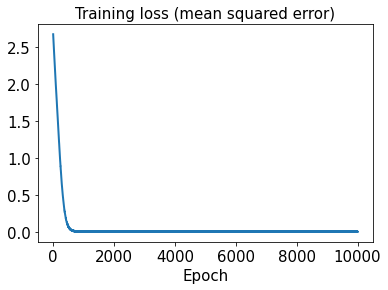

In [100]:
hist3 = history3.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

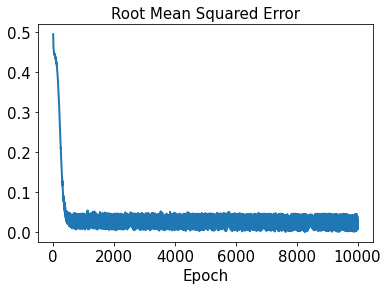

In [101]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [102]:
sd3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [103]:
start3 = datetime.datetime.now()
history3 = sd3.fit(x_train3, y_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 28ms/step - loss: 3.7621 - rmse: 1.9396
Epoch 2/10000
2/2 [==============================] - 0s 22ms/step - loss: 3.7416 - rmse: 1.9343
Epoch 3/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.7210 - rmse: 1.9290
Epoch 4/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7004 - rmse: 1.9236
Epoch 5/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6801 - rmse: 1.9183
Epoch 6/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6598 - rmse: 1.9131
Epoch 7/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6396 - rmse: 1.9078
Epoch 8/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6195 - rmse: 1.9025
Epoch 9/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5995 - rmse: 1.8972
Epoch 10/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5796 - rmse: 1.8920
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 10ms/step - loss: 2.3849 - rmse: 1.5443
Epoch 86/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3744 - rmse: 1.5409
Epoch 87/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3596 - rmse: 1.5361
Epoch 88/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3493 - rmse: 1.5327
Epoch 89/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3364 - rmse: 1.5285
Epoch 90/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3261 - rmse: 1.5251
Epoch 91/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3127 - rmse: 1.5207
Epoch 92/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3043 - rmse: 1.5180
Epoch 93/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2910 - rmse: 1.5136
Epoch 94/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2799 - rmse: 1.5099
Epoch 95/10000
2/2 [===========================

2/2 [==============================] - 0s 10ms/step - loss: 1.6037 - rmse: 1.2662
Epoch 170/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5959 - rmse: 1.2632
Epoch 171/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5902 - rmse: 1.2609
Epoch 172/10000
2/2 [==============================] - 0s 18ms/step - loss: 1.5833 - rmse: 1.2582
Epoch 173/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5776 - rmse: 1.2559
Epoch 174/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5720 - rmse: 1.2537
Epoch 175/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5642 - rmse: 1.2506
Epoch 176/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5587 - rmse: 1.2484
Epoch 177/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5494 - rmse: 1.2446
Epoch 178/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5430 - rmse: 1.2420
Epoch 179/10000
2/2 [=================

2/2 [==============================] - 0s 10ms/step - loss: 1.1366 - rmse: 1.0660
Epoch 253/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1330 - rmse: 1.0643
Epoch 254/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1266 - rmse: 1.0612
Epoch 255/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1236 - rmse: 1.0598
Epoch 256/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1188 - rmse: 1.0576
Epoch 257/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1125 - rmse: 1.0546
Epoch 258/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1075 - rmse: 1.0522
Epoch 259/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1028 - rmse: 1.0500
Epoch 260/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1020 - rmse: 1.0496
Epoch 261/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0942 - rmse: 1.0459
Epoch 262/10000
2/2 [================

2/2 [==============================] - 0s 10ms/step - loss: 0.8224 - rmse: 0.9067
Epoch 336/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8209 - rmse: 0.9059
Epoch 337/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8154 - rmse: 0.9028
Epoch 338/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.8148 - rmse: 0.9025
Epoch 339/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8164 - rmse: 0.9033
Epoch 340/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8079 - rmse: 0.8986
Epoch 341/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8030 - rmse: 0.8959
Epoch 342/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8000 - rmse: 0.8942
Epoch 343/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7973 - rmse: 0.8927
Epoch 344/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.7939 - rmse: 0.8908
Epoch 345/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.5938 - rmse: 0.7704
Epoch 420/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.5954 - rmse: 0.7714
Epoch 421/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5906 - rmse: 0.7683
Epoch 422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5868 - rmse: 0.7659
Epoch 423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5847 - rmse: 0.7645
Epoch 424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5833 - rmse: 0.7635
Epoch 425/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.5799 - rmse: 0.7613
Epoch 426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5780 - rmse: 0.7600
Epoch 427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5768 - rmse: 0.7593
Epoch 428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5733 - rmse: 0.7570
Epoch 429/10000
2/2 [=========================

2/2 [==============================] - 0s 6ms/step - loss: 0.4327 - rmse: 0.6576
Epoch 504/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.4289 - rmse: 0.6547
Epoch 505/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4273 - rmse: 0.6535
Epoch 506/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4263 - rmse: 0.6527
Epoch 507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4232 - rmse: 0.6504
Epoch 508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4228 - rmse: 0.6500
Epoch 509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4230 - rmse: 0.6502
Epoch 510/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.4174 - rmse: 0.6459
Epoch 511/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.4158 - rmse: 0.6446
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4142 - rmse: 0.6434
Epoch 513/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.3122 - rmse: 0.5586
Epoch 588/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3058 - rmse: 0.5528
Epoch 589/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3019 - rmse: 0.5493
Epoch 590/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3023 - rmse: 0.5496
Epoch 591/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2994 - rmse: 0.5470
Epoch 592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2982 - rmse: 0.5459
Epoch 593/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2965 - rmse: 0.5443
Epoch 594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2964 - rmse: 0.5442
Epoch 595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2970 - rmse: 0.5448
Epoch 596/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2938 - rmse: 0.5419
Epoch 597/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.2126 - rmse: 0.4609
Epoch 672/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2111 - rmse: 0.4593
Epoch 673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2097 - rmse: 0.4577
Epoch 674/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2082 - rmse: 0.4561
Epoch 675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2067 - rmse: 0.4544
Epoch 676/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2054 - rmse: 0.4531
Epoch 677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2045 - rmse: 0.4520
Epoch 678/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2070 - rmse: 0.4548
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2027 - rmse: 0.4500
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2046 - rmse: 0.4521
Epoch 681/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.1419 - rmse: 0.3766
Epoch 756/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1390 - rmse: 0.3727
Epoch 757/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1364 - rmse: 0.3692
Epoch 758/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1382 - rmse: 0.3716
Epoch 759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1364 - rmse: 0.3692
Epoch 760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1437 - rmse: 0.3789
Epoch 761/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1374 - rmse: 0.3706
Epoch 762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1333 - rmse: 0.3650
Epoch 763/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1391 - rmse: 0.3728
Epoch 764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1316 - rmse: 0.3626
Epoch 765/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0842 - rmse: 0.2900
Epoch 840/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0854 - rmse: 0.2920
Epoch 841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0847 - rmse: 0.2909
Epoch 842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0825 - rmse: 0.2871
Epoch 843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0889 - rmse: 0.2980
Epoch 844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0816 - rmse: 0.2854
Epoch 845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0824 - rmse: 0.2869
Epoch 846/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0832 - rmse: 0.2883
Epoch 847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0824 - rmse: 0.2869
Epoch 848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0795 - rmse: 0.2817
Epoch 849/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0533 - rmse: 0.2307
Epoch 924/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0492 - rmse: 0.2217
Epoch 925/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0471 - rmse: 0.2168
Epoch 926/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0523 - rmse: 0.2286
Epoch 927/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0465 - rmse: 0.2154
Epoch 928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0459 - rmse: 0.2141
Epoch 929/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0456 - rmse: 0.2133
Epoch 930/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0521 - rmse: 0.2280
Epoch 931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0462 - rmse: 0.2147
Epoch 932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0447 - rmse: 0.2113
Epoch 933/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0292 - rmse: 0.1706
Epoch 1008/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0297 - rmse: 0.1720
Epoch 1009/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0271 - rmse: 0.1643
Epoch 1010/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0268 - rmse: 0.1636
Epoch 1011/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0271 - rmse: 0.1644
Epoch 1012/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0278 - rmse: 0.1664
Epoch 1013/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0292 - rmse: 0.1706
Epoch 1014/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0284 - rmse: 0.1682
Epoch 1015/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0261 - rmse: 0.1613
Epoch 1016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0330 - rmse: 0.1815
Epoch 1017/10000
2/2 [=============

2/2 [==============================] - 0s 8ms/step - loss: 0.0169 - rmse: 0.1299
Epoch 1091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0161 - rmse: 0.1265
Epoch 1092/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0180 - rmse: 0.1340
Epoch 1093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0222 - rmse: 0.1488
Epoch 1094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0144 - rmse: 0.1198
Epoch 1095/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0183 - rmse: 0.1350
Epoch 1096/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0166 - rmse: 0.1285
Epoch 1097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0139 - rmse: 0.1177
Epoch 1098/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0230 - rmse: 0.1514
Epoch 1099/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0135 - rmse: 0.1160
Epoch 1100/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 1174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0894
Epoch 1175/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0157 - rmse: 0.1249
Epoch 1176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0110 - rmse: 0.1044
Epoch 1177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0092 - rmse: 0.0954
Epoch 1178/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0132 - rmse: 0.1145
Epoch 1179/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0114 - rmse: 0.1063
Epoch 1180/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0100 - rmse: 0.0995
Epoch 1181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0843
Epoch 1182/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0974
Epoch 1183/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0749
Epoch 1257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0097 - rmse: 0.0981
Epoch 1258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 1259/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 1260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0656
Epoch 1261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 1262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0873
Epoch 1263/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0061 - rmse: 0.0774
Epoch 1264/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 1265/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0666
Epoch 1266/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0058 - rmse: 0.0758
Epoch 1340/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 1341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 1342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 1343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0697
Epoch 1344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 1345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 1346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 1347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 1348/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0600
Epoch 1349/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 1423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 1424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 1425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 1426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0425
Epoch 1427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0099 - rmse: 0.0994
Epoch 1428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 1429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 1430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0558
Epoch 1431/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0624
Epoch 1432/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 1506/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0332
Epoch 1507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0601
Epoch 1508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 1509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 1510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0334
Epoch 1511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 1512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 1513/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6298e-04 - rmse: 0.0301
Epoch 1514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 1515/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 5.6717e-04 - rmse: 0.0226
Epoch 1589/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 1590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0912
Epoch 1591/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4376e-04 - rmse: 0.0221
Epoch 1592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0528
Epoch 1593/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9742e-04 - rmse: 0.0155
Epoch 1594/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 1595/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8579e-04 - rmse: 0.0251
Epoch 1596/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0310
Epoch 1597/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 1598/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 1671/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9341e-04 - rmse: 0.0155
Epoch 1672/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 1673/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0062 - rmse: 0.0782
Epoch 1674/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3422e-04 - rmse: 0.0134
Epoch 1675/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4918e-04 - rmse: 0.0140
Epoch 1676/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9204e-04 - rmse: 0.0232
Epoch 1677/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 1678/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0096 - rmse: 0.0978
Epoch 1679/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0335
Epoch 1680/10000
2

2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 1753/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 1754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 1755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 1756/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 1757/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 1758/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1644e-04 - rmse: 0.0162
Epoch 1759/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.7697e-04 - rmse: 0.0111
Epoch 1760/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3308e-04 - rmse: 0.0167
Epoch 1761/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7521e-04 - rmse: 0.0206
Epoch 1762/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 3.0350e-04 - rmse: 0.0159
Epoch 1835/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 1836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0438
Epoch 1837/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7388e-04 - rmse: 0.0111
Epoch 1838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 1839/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 1840/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0680
Epoch 1841/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0320
Epoch 1842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0900
Epoch 1843/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0348
Epoch 1844/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 2.4383e-04 - rmse: 0.0139
Epoch 1917/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 1918/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2005e-04 - rmse: 0.0217
Epoch 1919/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8463e-04 - rmse: 0.0153
Epoch 1920/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2039e-04 - rmse: 0.0084
Epoch 1921/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9377e-04 - rmse: 0.0120
Epoch 1922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0680
Epoch 1923/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3249e-04 - rmse: 0.0195
Epoch 1924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 1925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 1926/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0086 - rmse: 0.0923
Epoch 1999/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0850
Epoch 2000/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 2001/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8214e-04 - rmse: 0.0271
Epoch 2002/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 2003/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0100 - rmse: 0.0999
Epoch 2004/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0437
Epoch 2005/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0573e-04 - rmse: 0.0236
Epoch 2006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0988
Epoch 2007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 2008/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 6.7727e-04 - rmse: 0.0251
Epoch 2081/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3213e-04 - rmse: 0.0196
Epoch 2082/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.5500e-04 - rmse: 0.0144
Epoch 2083/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.5626e-04 - rmse: 0.0225
Epoch 2084/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0522
Epoch 2085/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 2086/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0348
Epoch 2087/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.1217e-04 - rmse: 0.0128
Epoch 2088/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.4345e-04 - rmse: 0.0199
Epoch 2089/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0342
Epo

2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 2163/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 2164/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2415e-04 - rmse: 0.0279
Epoch 2165/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 2166/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0832
Epoch 2167/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3747e-04 - rmse: 0.0095
Epoch 2168/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 2169/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8958e-04 - rmse: 0.0273
Epoch 2170/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0900
Epoch 2171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 2172/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0540
Epoch 2245/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0414
Epoch 2246/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4878e-04 - rmse: 0.0174
Epoch 2247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 2248/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3225e-04 - rmse: 0.0093
Epoch 2249/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 2250/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6424e-04 - rmse: 0.0109
Epoch 2251/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2277e-04 - rmse: 0.0279
Epoch 2252/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2530e-04 - rmse: 0.0167
Epoch 2253/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 2254/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 2327/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 2328/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 2329/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 2330/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 2331/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4040e-04 - rmse: 0.0098
Epoch 2332/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 2333/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5451e-04 - rmse: 0.0145
Epoch 2334/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0905
Epoch 2335/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0403
Epoch 2336/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 2409/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 2410/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 2411/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5257e-04 - rmse: 0.0226
Epoch 2412/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.5627e-04 - rmse: 0.0106
Epoch 2413/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.9638e-04 - rmse: 0.0188
Epoch 2414/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 2415/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2325e-04 - rmse: 0.0219
Epoch 2416/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 2417/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 2418/10000
2/2 

2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0788
Epoch 2491/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 2492/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.0708e-04 - rmse: 0.0238
Epoch 2493/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 2494/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 2495/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0705
Epoch 2496/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.1182e-04 - rmse: 0.0259
Epoch 2497/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 2498/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6551e-04 - rmse: 0.0206
Epoch 2499/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0618
Epoch 2500/10000

2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 2574/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 2575/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 2576/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 2577/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 2578/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4194e-04 - rmse: 0.0200
Epoch 2579/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 2580/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 2581/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4166e-04 - rmse: 0.0142
Epoch 2582/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 2583/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 4.2591e-04 - rmse: 0.0196
Epoch 2656/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 2657/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0310
Epoch 2658/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 2659/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 2660/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9996e-05 - rmse: 0.0063
Epoch 2661/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8831e-04 - rmse: 0.0187
Epoch 2662/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 2663/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 2664/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.7360e-04 - rmse: 0.0115
Epoch 2665/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 4.2024e-04 - rmse: 0.0195
Epoch 2738/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 2739/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0405
Epoch 2740/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 2741/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 2742/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.8242e-04 - rmse: 0.0185
Epoch 2743/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3263e-04 - rmse: 0.0198
Epoch 2744/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 2745/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 2746/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 2747/10000
2/2 [==

2/2 [==============================] - 0s 6ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 2820/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 2821/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 2822/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0679
Epoch 2823/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 2824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 2825/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0720e-04 - rmse: 0.0217
Epoch 2826/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 2827/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7332e-04 - rmse: 0.0231
Epoch 2828/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8120e-04 - rmse: 0.0254
Epoch 2829/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 2902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 2903/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 2904/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 2905/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0505e-04 - rmse: 0.0258
Epoch 2906/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 2907/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 2908/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0086 - rmse: 0.0923
Epoch 2909/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 2910/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 2911/10000
2/2 [===========

2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 2984/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 2985/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6455e-04 - rmse: 0.0113
Epoch 2986/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 2987/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.3349e-04 - rmse: 0.0140
Epoch 2988/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 2989/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 2990/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 2991/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0641
Epoch 2992/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 2993/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 3066/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 3067/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 3068/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 3069/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 3070/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0071 - rmse: 0.0838
Epoch 3071/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 3072/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1362e-04 - rmse: 0.0133
Epoch 3073/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0891e-04 - rmse: 0.0132
Epoch 3074/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 3075/10000
2/2 [======

2/2 [==============================] - 0s 12ms/step - loss: 6.8454e-04 - rmse: 0.0255
Epoch 3148/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 3149/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 3150/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.5463e-04 - rmse: 0.0205
Epoch 3151/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.7227e-04 - rmse: 0.0272
Epoch 3152/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 3153/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4695e-04 - rmse: 0.0285
Epoch 3154/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 3155/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 3156/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 3157/1000

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 3230/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 3231/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0376
Epoch 3232/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 3233/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 3234/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4339e-04 - rmse: 0.0145
Epoch 3235/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.5908e-04 - rmse: 0.0180
Epoch 3236/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 3237/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0966
Epoch 3238/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 3239/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 3312/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 3313/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 3314/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5297e-04 - rmse: 0.0109
Epoch 3315/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3864e-04 - rmse: 0.0103
Epoch 3316/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 3317/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 3318/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0896
Epoch 3319/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0540
Epoch 3320/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 3321/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 3394/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 3395/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3217e-05 - rmse: 0.0055
Epoch 3396/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1593e-04 - rmse: 0.0168
Epoch 3397/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 3398/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 3399/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 3400/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6494e-04 - rmse: 0.0152
Epoch 3401/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.7401e-04 - rmse: 0.0272
Epoch 3402/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 3403/10000
2

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 3476/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 3477/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 3478/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 3479/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 3480/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 3481/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.4400e-04 - rmse: 0.0146
Epoch 3482/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 3483/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5080e-04 - rmse: 0.0179
Epoch 3484/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 3485/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 3.5813e-05 - rmse: 0.0021
Epoch 3558/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 3559/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 3560/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 3561/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 3562/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3239e-04 - rmse: 0.0142
Epoch 3563/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 3564/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 3565/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 3566/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 3567/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 3640/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 3641/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 3642/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 3643/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 3644/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 3645/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 3646/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7943e-05 - rmse: 0.0082
Epoch 3647/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 3648/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 3649/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 3722/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 3723/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 3724/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 3725/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 3726/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 3727/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 3728/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5067e-04 - rmse: 0.0268
Epoch 3729/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.7886e-04 - rmse: 0.0291
Epoch 3730/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5449e-04 - rmse: 0.0287
Epoch 3731/10000
2/2 [===

2/2 [==============================] - 0s 11ms/step - loss: 9.6582e-05 - rmse: 0.0082
Epoch 3804/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 3805/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 3806/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 3807/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0777
Epoch 3808/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 3809/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.1071e-04 - rmse: 0.0135
Epoch 3810/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 3811/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.0856e-04 - rmse: 0.0219
Epoch 3812/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6186e-04 - rmse: 0.0152
Epoch 3813/1

2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 3886/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 3887/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2641e-04 - rmse: 0.0199
Epoch 3888/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0451
Epoch 3889/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 3890/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 3891/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 3892/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 3893/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 3894/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 3895/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 5.3439e-04 - rmse: 0.0225
Epoch 3968/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9158e-04 - rmse: 0.0215
Epoch 3969/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 3970/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4520e-04 - rmse: 0.0303
Epoch 3971/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 3972/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 3973/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 3974/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 3975/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 3976/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 3977/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 4050/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 4051/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 4052/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 4053/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 4054/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0472
Epoch 4055/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0658
Epoch 4056/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 4057/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0493
Epoch 4058/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 4059/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 6.8390e-05 - rmse: 0.0064
Epoch 4132/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5520e-05 - rmse: 0.0076
Epoch 4133/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.5339e-05 - rmse: 0.0069
Epoch 4134/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 4135/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 4136/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 4137/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 4138/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 4139/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6917e-04 - rmse: 0.0156
Epoch 4140/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 4141/10000
2/2 

2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 4214/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 4215/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 4216/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 4217/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 4218/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 4219/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 4220/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 4221/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2554e-04 - rmse: 0.0141
Epoch 4222/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 4223/10000
2/2 [===

Epoch 4296/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 4297/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 4298/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 4299/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 4300/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8959e-04 - rmse: 0.0191
Epoch 4301/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 4302/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 4303/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 4304/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 4305/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3151e-05 - rmse: 0.0041
Epoch 4306/1

2/2 [==============================] - 0s 6ms/step - loss: 0.0052 - rmse: 0.0720
Epoch 4380/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 4381/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0101 - rmse: 0.1006
Epoch 4382/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 4383/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 4384/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.9830e-04 - rmse: 0.0278
Epoch 4385/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 4386/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 4387/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 4388/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2126e-04 - rmse: 0.0172
Epoch 4389/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 4462/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 4463/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0844
Epoch 4464/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3781e-04 - rmse: 0.0203
Epoch 4465/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 4466/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2274e-04 - rmse: 0.0199
Epoch 4467/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 4468/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 4469/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5918e-04 - rmse: 0.0208
Epoch 4470/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 4471/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 2.3288e-04 - rmse: 0.0144
Epoch 4544/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 4545/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8940e-04 - rmse: 0.0277
Epoch 4546/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0092 - rmse: 0.0958
Epoch 4547/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 4548/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 4549/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7089e-04 - rmse: 0.0121
Epoch 4550/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 4551/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 4552/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 4553/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0092 - rmse: 0.0960
Epoch 4626/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 4627/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 4628/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 4629/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4191e-04 - rmse: 0.0147
Epoch 4630/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6224e-04 - rmse: 0.0184
Epoch 4631/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2408e-04 - rmse: 0.0173
Epoch 4632/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9473e-04 - rmse: 0.0192
Epoch 4633/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5577e-04 - rmse: 0.0115
Epoch 4634/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 4635/10000

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0619
Epoch 4708/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 4709/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0893
Epoch 4710/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 4711/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 4712/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9088e-04 - rmse: 0.0129
Epoch 4713/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 4714/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5496e-04 - rmse: 0.0208
Epoch 4715/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7869e-04 - rmse: 0.0275
Epoch 4716/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 4717/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 9.5235e-04 - rmse: 0.0305
Epoch 4790/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 4791/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0405
Epoch 4792/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 4793/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 4794/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 4795/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2072e-04 - rmse: 0.0300
Epoch 4796/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1394e-04 - rmse: 0.0221
Epoch 4797/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 4798/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9309e-04 - rmse: 0.0192
Epoch 4799/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 1.8107e-04 - rmse: 0.0126
Epoch 4872/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 4873/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2207e-04 - rmse: 0.0300
Epoch 4874/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9356e-04 - rmse: 0.0295
Epoch 4875/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 4876/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 4877/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 4878/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6193e-04 - rmse: 0.0184
Epoch 4879/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 4880/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 4881/100

2/2 [==============================] - 0s 6ms/step - loss: 2.3278e-04 - rmse: 0.0145
Epoch 4954/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 4955/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3774e-04 - rmse: 0.0286
Epoch 4956/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4328e-04 - rmse: 0.0149
Epoch 4957/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9100e-04 - rmse: 0.0192
Epoch 4958/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 4959/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0881e-04 - rmse: 0.0280
Epoch 4960/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 4961/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 4962/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 4963/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 5036/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 5037/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9554e-04 - rmse: 0.0278
Epoch 5038/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 5039/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 5040/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 5041/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0994e-04 - rmse: 0.0094
Epoch 5042/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 5043/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 5044/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 5045/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0915
Epoch 5118/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 5119/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0970
Epoch 5120/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 5121/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0168e-04 - rmse: 0.0167
Epoch 5122/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 5123/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0857e-04 - rmse: 0.0197
Epoch 5124/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 5125/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0893
Epoch 5126/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 5127/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 4.1243e-04 - rmse: 0.0198
Epoch 5201/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 5202/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 5203/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 5204/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 5205/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 5206/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 5207/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 5208/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 5209/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6504e-05 - rmse: 0.0081
Epoch 5210/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 5283/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.9516e-04 - rmse: 0.0193
Epoch 5284/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.1346e-05 - rmse: 0.0064
Epoch 5285/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3609e-04 - rmse: 0.0107
Epoch 5286/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1904e-04 - rmse: 0.0099
Epoch 5287/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 5288/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 5289/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 5290/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 5291/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 5292/10000

2/2 [==============================] - 0s 8ms/step - loss: 5.9105e-04 - rmse: 0.0239
Epoch 5365/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6287e-04 - rmse: 0.0253
Epoch 5366/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0099 - rmse: 0.0995
Epoch 5367/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8071e-04 - rmse: 0.0310
Epoch 5368/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 5369/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0863
Epoch 5370/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5245e-04 - rmse: 0.0231
Epoch 5371/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 5372/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.3938e-04 - rmse: 0.0268
Epoch 5373/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 5374/10000


2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 5447/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.4810e-04 - rmse: 0.0270
Epoch 5448/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 5449/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 5450/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 5451/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 5452/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 5453/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 5454/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1950e-04 - rmse: 0.0300
Epoch 5455/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 5456/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 5529/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 5530/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 5531/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 5532/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 5533/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.5541e-04 - rmse: 0.0209
Epoch 5534/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 5535/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 5536/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 5537/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.3330e-04 - rmse: 0.0146
Epoch 5538/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 5611/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 5612/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 5613/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 5614/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0090 - rmse: 0.0950
Epoch 5615/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 5616/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 5617/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 5618/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 5619/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 5620/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 5694/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 5695/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 5696/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 5697/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 5698/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 5699/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0658
Epoch 5700/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 5701/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 5702/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 5703/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 3.6860e-04 - rmse: 0.0187
Epoch 5776/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 5777/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 5778/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0679e-04 - rmse: 0.0197
Epoch 5779/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9957e-04 - rmse: 0.0219
Epoch 5780/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 5781/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 5782/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4977e-04 - rmse: 0.0208
Epoch 5783/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 5784/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 5785/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 5858/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6000e-04 - rmse: 0.0119
Epoch 5859/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 5860/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1115e-04 - rmse: 0.0139
Epoch 5861/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 5862/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 5863/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 5864/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 5865/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 5866/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 5867/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 5940/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 5941/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 5942/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 5943/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 5944/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2344e-04 - rmse: 0.0225
Epoch 5945/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 5946/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 5947/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 5948/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 5949/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 3.7329e-04 - rmse: 0.0189
Epoch 6023/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 6024/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 6025/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4468e-04 - rmse: 0.0207
Epoch 6026/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0695
Epoch 6027/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1688e-04 - rmse: 0.0224
Epoch 6028/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 6029/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0711e-04 - rmse: 0.0221
Epoch 6030/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 6031/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 6032/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 6105/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0138e-04 - rmse: 0.0136
Epoch 6106/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 6107/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 6108/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 6109/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 6110/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 6111/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 6112/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 6113/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 6114/10000
2/2 [===========

Epoch 6187/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 6188/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.1627e-04 - rmse: 0.0100
Epoch 6189/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 6190/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.9176e-04 - rmse: 0.0218
Epoch 6191/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 6192/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.2199e-04 - rmse: 0.0225
Epoch 6193/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7004e-04 - rmse: 0.0159
Epoch 6194/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0317e-04 - rmse: 0.0197
Epoch 6195/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3313e-04 - rmse: 0.0147
Epoch 6196/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - 

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 6270/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 6271/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0511e-04 - rmse: 0.0095
Epoch 6272/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3028e-04 - rmse: 0.0107
Epoch 6273/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4459e-04 - rmse: 0.0113
Epoch 6274/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 6275/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 6276/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0483
Epoch 6277/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8535e-04 - rmse: 0.0192
Epoch 6278/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2440e-04 - rmse: 0.0176
Epoch 6279/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 6352/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 6353/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 6354/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 6355/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 6356/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 6357/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 6358/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 6359/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 6360/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 6361/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 6434/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 6435/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 6436/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.7052e-04 - rmse: 0.0189
Epoch 6437/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4150e-04 - rmse: 0.0112
Epoch 6438/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 6439/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5947e-04 - rmse: 0.0156
Epoch 6440/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 6441/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 6442/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0777
Epoch 6443/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 3.5756e-04 - rmse: 0.0185
Epoch 6516/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0634e-05 - rmse: 0.0051
Epoch 6517/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8290e-04 - rmse: 0.0130
Epoch 6518/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 6519/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7853e-04 - rmse: 0.0276
Epoch 6520/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 6521/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 6522/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8980e-04 - rmse: 0.0278
Epoch 6523/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9381e-04 - rmse: 0.0279
Epoch 6524/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 6525/10

2/2 [==============================] - 0s 6ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 6598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 6599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 6600/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0102e-04 - rmse: 0.0262
Epoch 6601/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0316e-04 - rmse: 0.0281
Epoch 6602/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 6603/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 6604/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 6605/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 6606/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 6607/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 6681/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5179e-04 - rmse: 0.0154
Epoch 6682/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8751e-04 - rmse: 0.0193
Epoch 6683/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 6684/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 6685/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2254e-04 - rmse: 0.0104
Epoch 6686/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 6687/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 6688/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 6689/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 6690/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 3.7481e-04 - rmse: 0.0190
Epoch 6763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 6764/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 6765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 6766/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 6767/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8053e-04 - rmse: 0.0163
Epoch 6768/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9592e-04 - rmse: 0.0135
Epoch 6769/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8325e-04 - rmse: 0.0130
Epoch 6770/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 6771/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1068e-04 - rmse: 0.0172
Epoch 6772/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 6845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 6846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0673
Epoch 6847/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5889e-04 - rmse: 0.0186
Epoch 6848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 6849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 6850/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9546e-05 - rmse: 0.0093
Epoch 6851/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 6852/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.3694e-04 - rmse: 0.0180
Epoch 6853/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3147e-05 - rmse: 0.0077
Epoch 6854/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 6928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0097 - rmse: 0.0985
Epoch 6929/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4166e-04 - rmse: 0.0270
Epoch 6930/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 6931/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0112e-04 - rmse: 0.0281
Epoch 6932/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.1909e-04 - rmse: 0.0225
Epoch 6933/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 6934/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 6935/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 6936/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 6937/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 8.6470e-04 - rmse: 0.0292
Epoch 7010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0687
Epoch 7011/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3057e-04 - rmse: 0.0249
Epoch 7012/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7519e-04 - rmse: 0.0257
Epoch 7013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0920
Epoch 7014/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 7015/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2002e-04 - rmse: 0.0225
Epoch 7016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 7017/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 7018/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1619e-04 - rmse: 0.0246
Epoch 7019/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 7092/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 7093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0603
Epoch 7094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 7095/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 7096/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 7097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 7098/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7952e-04 - rmse: 0.0129
Epoch 7099/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 7100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0970
Epoch 7101/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 3.4593e-04 - rmse: 0.0183
Epoch 7174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 7175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 7176/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0433e-04 - rmse: 0.0171
Epoch 7177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 7178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 7179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 7180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 7181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 7182/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 7183/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 7256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 7257/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8169e-04 - rmse: 0.0130
Epoch 7258/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 7259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 7260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 7261/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3119e-04 - rmse: 0.0228
Epoch 7262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 7263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0972
Epoch 7264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 7265/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 7338/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7779e-05 - rmse: 0.0025
Epoch 7339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 7340/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0092 - rmse: 0.0960
Epoch 7341/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7351e-04 - rmse: 0.0190
Epoch 7342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 7343/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3688e-05 - rmse: 0.0079
Epoch 7344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 7345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0838
Epoch 7346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 7347/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0688
Epoch 7420/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0989
Epoch 7421/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7426e-04 - rmse: 0.0276
Epoch 7422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0856
Epoch 7423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 7424/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9480e-04 - rmse: 0.0196
Epoch 7425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 7426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 7427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 7428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 7429/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 7502/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 7503/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 7504/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 7505/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6814e-04 - rmse: 0.0256
Epoch 7506/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 7507/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4294e-04 - rmse: 0.0152
Epoch 7508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 7509/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4150e-04 - rmse: 0.0305
Epoch 7510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 7511/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 7.1877e-05 - rmse: 0.0078
Epoch 7584/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 7585/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 7586/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 7587/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 7588/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 7589/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 7590/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8905e-04 - rmse: 0.0133
Epoch 7591/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 7592/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7246e-04 - rmse: 0.0310
Epoch 7593/10000
2

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 7666/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8763e-04 - rmse: 0.0133
Epoch 7667/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 7668/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 7669/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 7670/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 7671/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 7672/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 7673/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5711e-04 - rmse: 0.0308
Epoch 7674/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1115e-04 - rmse: 0.0224
Epoch 7675/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 1.5408e-04 - rmse: 0.0120
Epoch 7749/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6556e-04 - rmse: 0.0188
Epoch 7750/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 7751/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 7752/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 7753/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2996e-04 - rmse: 0.0179
Epoch 7754/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0379
Epoch 7755/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1149e-04 - rmse: 0.0200
Epoch 7756/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 7757/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 7758/10000
2/2 

2/2 [==============================] - 0s 11ms/step - loss: 1.9743e-04 - rmse: 0.0137
Epoch 7831/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2199e-04 - rmse: 0.0203
Epoch 7832/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 7833/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2073e-04 - rmse: 0.0203
Epoch 7834/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 7835/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 7836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 7837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 7838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 7839/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 7840/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 2.6956e-04 - rmse: 0.0161
Epoch 7913/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6019e-04 - rmse: 0.0122
Epoch 7914/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0126e-04 - rmse: 0.0222
Epoch 7915/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2785e-04 - rmse: 0.0108
Epoch 7916/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2812e-04 - rmse: 0.0178
Epoch 7917/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 7918/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 7919/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1408e-04 - rmse: 0.0143
Epoch 7920/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2151e-04 - rmse: 0.0105
Epoch 7921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 792

2/2 [==============================] - 0s 6ms/step - loss: 5.2411e-04 - rmse: 0.0227
Epoch 7995/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 7996/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0073 - rmse: 0.0853
Epoch 7997/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 7998/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 7999/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0063 - rmse: 0.0793
Epoch 8000/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0097 - rmse: 0.0985
Epoch 8001/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 8002/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 8003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 8004/10000
2/2 [===========

2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 8078/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 8079/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 8080/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8787e-05 - rmse: 0.0094
Epoch 8081/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 8082/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 8083/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 8084/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.8343e-04 - rmse: 0.0165
Epoch 8085/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 8086/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 8087/10000
2/

2/2 [==============================] - 0s 8ms/step - loss: 2.4520e-04 - rmse: 0.0153
Epoch 8160/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 8161/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 8162/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0636
Epoch 8163/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 8164/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 8165/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 8166/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 8167/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 8168/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 8169/10000
2/2 [===========

2/2 [==============================] - 0s 2ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 8242/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.8388e-04 - rmse: 0.0193
Epoch 8243/10000
2/2 [==============================] - 0s 2ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 8244/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 8245/10000
2/2 [==============================] - 0s 2ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 8246/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 8247/10000
2/2 [==============================] - 0s 2ms/step - loss: 4.1503e-04 - rmse: 0.0201
Epoch 8248/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3381e-04 - rmse: 0.0180
Epoch 8249/10000
2/2 [==============================] - 0s 2ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 8250/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 8251/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 8324/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8718e-04 - rmse: 0.0133
Epoch 8325/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0893
Epoch 8326/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9171e-04 - rmse: 0.0135
Epoch 8327/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7536e-04 - rmse: 0.0129
Epoch 8328/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 8329/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 8330/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.4774e-04 - rmse: 0.0118
Epoch 8331/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.0709e-05 - rmse: 0.0078
Epoch 8332/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 8333/1

2/2 [==============================] - 0s 7ms/step - loss: 1.9615e-05 - rmse: 0.0032
Epoch 8406/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7790e-04 - rmse: 0.0311
Epoch 8407/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 8408/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 8409/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9107e-04 - rmse: 0.0313
Epoch 8410/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0961
Epoch 8411/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 8412/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 8413/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 8414/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2511e-04 - rmse: 0.0108
Epoch 8415/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 8488/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4444e-04 - rmse: 0.0116
Epoch 8489/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0357
Epoch 8490/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 8491/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1943e-04 - rmse: 0.0105
Epoch 8492/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 8493/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.9536e-05 - rmse: 0.0071
Epoch 8494/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 8495/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0673
Epoch 8496/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0940e-04 - rmse: 0.0173
Epoch 8497/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 8570/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7390e-04 - rmse: 0.0128
Epoch 8571/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 8572/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 8573/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 8574/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 8575/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 8576/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 8577/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3910e-04 - rmse: 0.0182
Epoch 8578/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.3911e-05 - rmse: 0.0050
Epoch 8579/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 5.4565e-05 - rmse: 0.0067
Epoch 8652/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3131e-05 - rmse: 0.0037
Epoch 8653/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8555e-05 - rmse: 0.0044
Epoch 8654/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 8655/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 8656/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 8657/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 8658/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5036e-05 - rmse: 0.0060
Epoch 8659/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2953e-05 - rmse: 0.0058
Epoch 8660/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 8661/10000


2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 8734/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 8735/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4307e-04 - rmse: 0.0116
Epoch 8736/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 8737/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 8738/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 8739/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 8740/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 8741/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 8742/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 8743/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 8817/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 8818/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 8819/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5359e-04 - rmse: 0.0120
Epoch 8820/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 8821/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0432e-04 - rmse: 0.0223
Epoch 8822/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 8823/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 8824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 8825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 8826/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 3.3623e-04 - rmse: 0.0181
Epoch 8899/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0379
Epoch 8900/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 8901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 8902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 8903/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 8904/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 8905/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2715e-04 - rmse: 0.0148
Epoch 8906/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8066e-04 - rmse: 0.0193
Epoch 8907/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 8908/10000
2/2 [===

2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 8981/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 8982/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 8983/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.2536e-04 - rmse: 0.0227
Epoch 8984/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 8985/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8986/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1801e-04 - rmse: 0.0105
Epoch 8987/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 8988/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0653e-04 - rmse: 0.0141
Epoch 8989/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 8990/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 9063/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 9064/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 9065/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 9066/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0694
Epoch 9067/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0100 - rmse: 0.0999
Epoch 9068/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2152e-04 - rmse: 0.0302
Epoch 9069/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 9070/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 9071/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0049 - rmse: 0.0702
Epoch 9072/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 9145/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3298e-04 - rmse: 0.0229
Epoch 9146/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 9147/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 9148/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.0963e-04 - rmse: 0.0200
Epoch 9149/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 9150/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0636
Epoch 9151/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0523
Epoch 9152/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 9153/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 9154/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 2.9525e-04 - rmse: 0.0169
Epoch 9227/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 9228/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2795e-04 - rmse: 0.0205
Epoch 9229/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5805e-04 - rmse: 0.0274
Epoch 9230/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 9231/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6793e-05 - rmse: 0.0043
Epoch 9232/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 9233/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 9234/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.6862e-04 - rmse: 0.0190
Epoch 9235/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 9236

2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 9309/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 9310/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2394e-04 - rmse: 0.0303
Epoch 9311/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 9312/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 9313/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8687e-04 - rmse: 0.0313
Epoch 9314/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 9315/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 9316/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 9317/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 9318/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 2.9304e-04 - rmse: 0.0169
Epoch 9391/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 9392/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 9393/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 9394/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 9395/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2771e-04 - rmse: 0.0148
Epoch 9396/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 9397/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9623e-04 - rmse: 0.0314
Epoch 9398/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 9399/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2696e-04 - rmse: 0.0148
Epoch 9400/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 9473/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 9474/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0587
Epoch 9475/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0806
Epoch 9476/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 9477/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0992
Epoch 9478/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9939e-04 - rmse: 0.0263
Epoch 9479/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 9480/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0099 - rmse: 0.0996
Epoch 9481/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 9482/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 9555/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0289e-04 - rmse: 0.0222
Epoch 9556/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 9557/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 9558/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3093e-04 - rmse: 0.0111
Epoch 9559/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 9560/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 9561/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 9562/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4268e-04 - rmse: 0.0289
Epoch 9563/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6310e-04 - rmse: 0.0125
Epoch 9564/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 9.4061e-04 - rmse: 0.0305
Epoch 9637/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0404
Epoch 9638/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 9639/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2747e-04 - rmse: 0.0179
Epoch 9640/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1272e-04 - rmse: 0.0175
Epoch 9641/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 9642/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 9643/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 9644/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3267e-04 - rmse: 0.0112
Epoch 9645/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9444e-04 - rmse: 0.0221
Epoch 9646/10000

2/2 [==============================] - 0s 8ms/step - loss: 7.4908e-04 - rmse: 0.0272
Epoch 9719/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 9720/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 9721/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4280e-04 - rmse: 0.0231
Epoch 9722/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0916
Epoch 9723/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 9724/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 9725/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 9726/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 9727/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0612
Epoch 9728/10000
2/2 [=======

Epoch 9801/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 9802/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 9803/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 9804/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 9805/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 9806/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 9807/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 9808/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0098 - rmse: 0.0987
Epoch 9809/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 9810/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9390e-04 - rmse: 0.0242
Epoch 9811/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0921
Epoch 9884/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0097 - rmse: 0.0984
Epoch 9885/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 9886/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6900e-04 - rmse: 0.0276
Epoch 9887/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8507e-04 - rmse: 0.0260
Epoch 9888/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 9889/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 9890/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 9891/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9557e-04 - rmse: 0.0314
Epoch 9892/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 9893/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 1.1760e-04 - rmse: 0.0105
Epoch 9966/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 9967/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7953e-04 - rmse: 0.0131
Epoch 9968/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9116e-04 - rmse: 0.0136
Epoch 9969/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9002e-04 - rmse: 0.0135
Epoch 9970/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 9971/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2915e-04 - rmse: 0.0179
Epoch 9972/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 9973/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.8677e-05 - rmse: 0.0096
Epoch 9974/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 9975/10

In [104]:
time3 = end3 - start3
print("Training time (Case 3):", time3)

Training time (Case 3): 0:02:55.573600


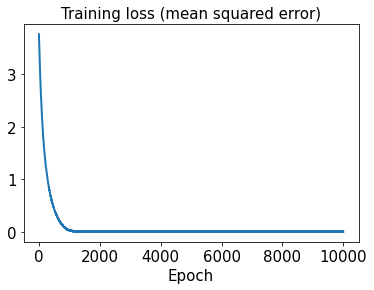

In [105]:
hist3 = history3.history
plt.plot(hist3['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

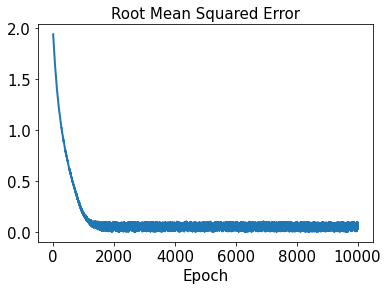

In [106]:
plt.plot(hist3['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [107]:
test_results3 = sd3.evaluate(x_test3)

1/1 [==============================] - 0s 82ms/step - loss: 7.2550e-06 - rmse: 0.0000e+00


In [108]:
decoded_sensor_train3 = sensor_pred3.predict(t_train)

In [109]:
decoded_sensor_test3 = sensor_pred3.predict(t_test)

In [110]:
decoded_train3 = sd3.predict(decoded_sensor_train3)

In [111]:
decoded_test3 = sd3.predict(decoded_sensor_test3)

In [112]:
error_train_abs3 = np.abs(decoded_train3 - y_train3)

In [113]:
error_test_abs3 = np.abs(decoded_test3 - y_test3)

In [114]:
l2_error_train3 = np.sqrt(np.sum((decoded_train3 - y_train3)**2) / np.sum(y_train3**2))
print(l2_error_train3)

0.20442386988202324


In [115]:
l2_error_test3 = np.sqrt(np.sum((decoded_test3 - y_test3)**2) / np.sum(y_test3**2))
print(l2_error_test3)

0.24525914978372163


In [116]:
l2_error_train_list3 = []
for i in range(0, len(x_train3)):
    l2_error_train_data3 = np.sqrt(np.sum((decoded_train3[i] - y_train3[i])**2) / np.sum(y_train3[i]**2))
    l2_error_train_list3.append(l2_error_train_data3)
print(l2_error_train_list3)

[0.21736726403633802, 0.26492594315393786, 0.14999143734079332, 0.16994045285124876, 0.08683826306417923, 0.23965827141466356, 0.12292849626370596, 0.30042266646510807, 0.10567197839454778, 0.40117679138366447, 0.36549193865094726, 0.08978537559753015, 0.17082429054407774, 0.23387375958440484, 0.19510521726159985, 0.11715911905688078, 0.24321474139629434, 0.009441969401922372, 0.14524474875476845, 0.2708751832540543, 0.47928152349172265, 0.1740498285604097, 0.4390773855321994, 0.0646953965023471, 0.3319341698163204, 0.21831787061757288, 0.03501453214958192, 0.06637731372825112, 0.020832469594476564, 0.2770315104821143, 0.13866701487363572, 0.19326042925852221, 0.521880357351167]


In [117]:
l2_error_test_list3 = []
for i in range(0, len(x_test3)):
    l2_error_test_data3 = np.sqrt(np.sum((decoded_test3[i] - y_test3[i])**2) / np.sum(y_test3[i]**2))
    l2_error_test_list3.append(l2_error_test_data3)
print(l2_error_test_list3)

[0.09671478008663821, 0.15294902987088754, 0.2592050924325751, 0.12755239723555586, 0.20358756751810508, 0.6146510425591964, 0.04427839334891313, 0.5669710284190249]


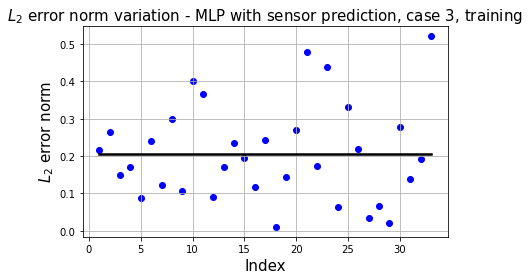

In [118]:
plt.plot(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train3*np.ones(x_train3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

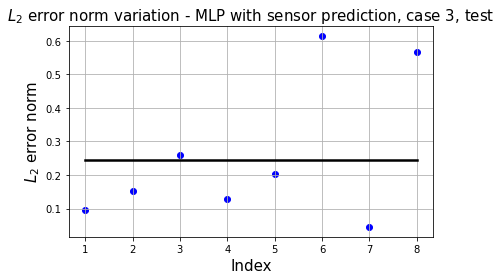

In [119]:
plt.plot(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test3*np.ones(x_test3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

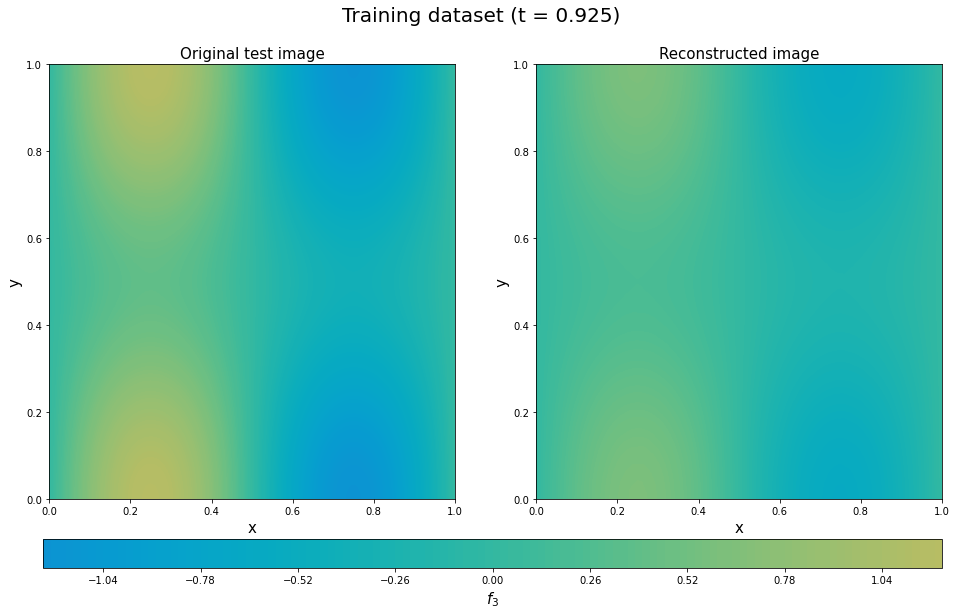

In [120]:
plt.figure(figsize=(16, 8))
y_train3_20_rotate = y_train3[20].T.reshape(101,101)
decoded_rotate3 = decoded_train3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_20_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[37]),fontsize=20)
plt.show()

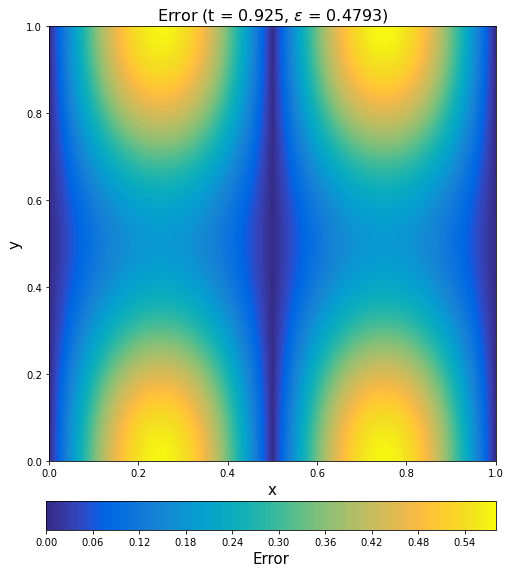

In [121]:
error_train_abs3_rotate20 = error_train_abs3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate20, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.925, $\epsilon$ = %.4f)' %(l2_error_train_list3[20]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

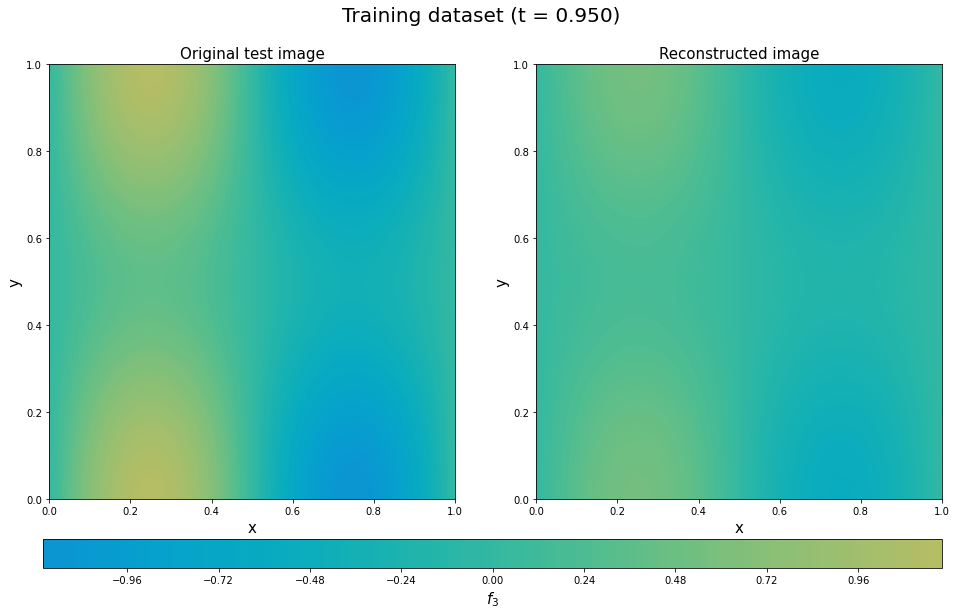

In [122]:
plt.figure(figsize=(16, 8))
y_train3_32_rotate = y_train3[32].T.reshape(101,101)
decoded_rotate3 = decoded_train3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_32_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[38]), fontsize=20)
plt.show()

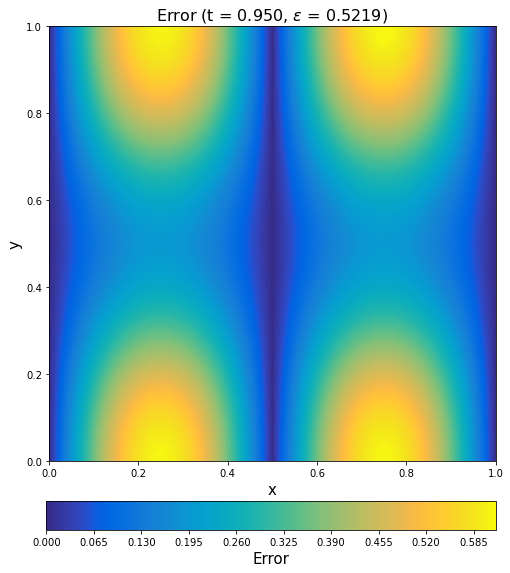

In [123]:
error_train_abs3_rotate32 = error_train_abs3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate32, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.950, $\epsilon$ = %.4f)' %(l2_error_train_list3[32]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

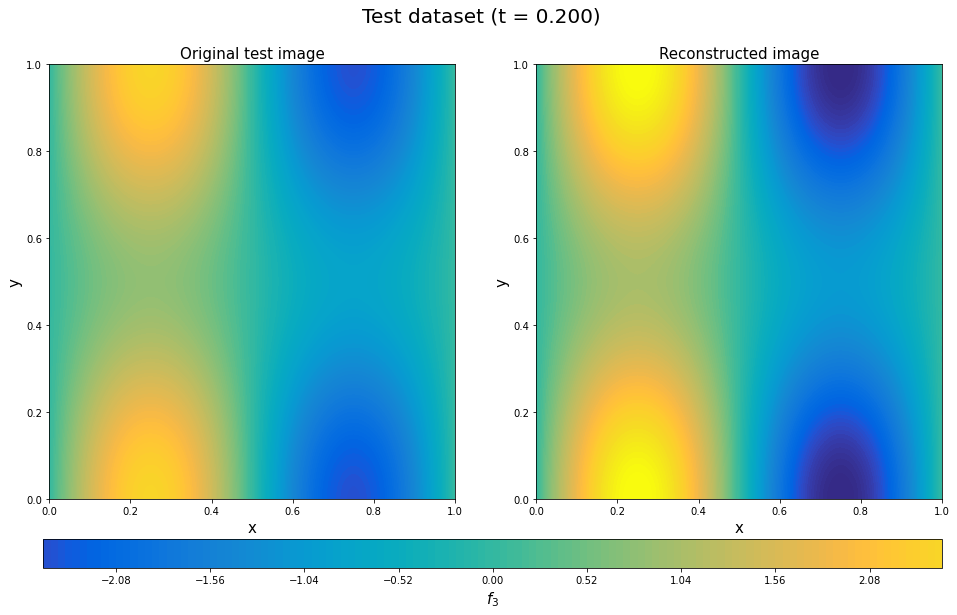

In [124]:
plt.figure(figsize=(16, 8))
y_test3_2_rotate = y_test3[2].T.reshape(101,101)
decoded_rotate3 = decoded_test3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

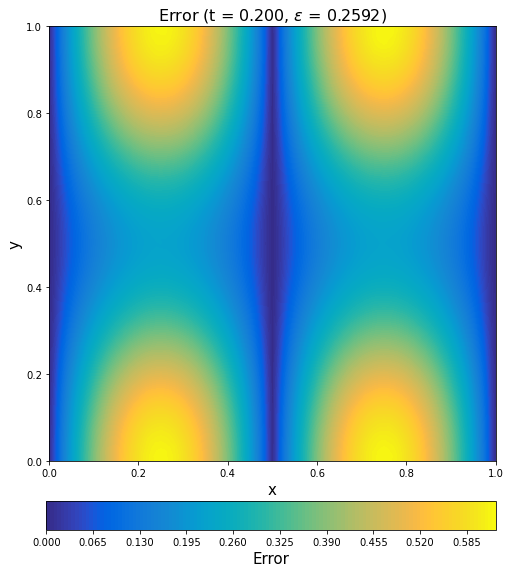

In [125]:
error_test_abs3_rotate2 = error_test_abs3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list3[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

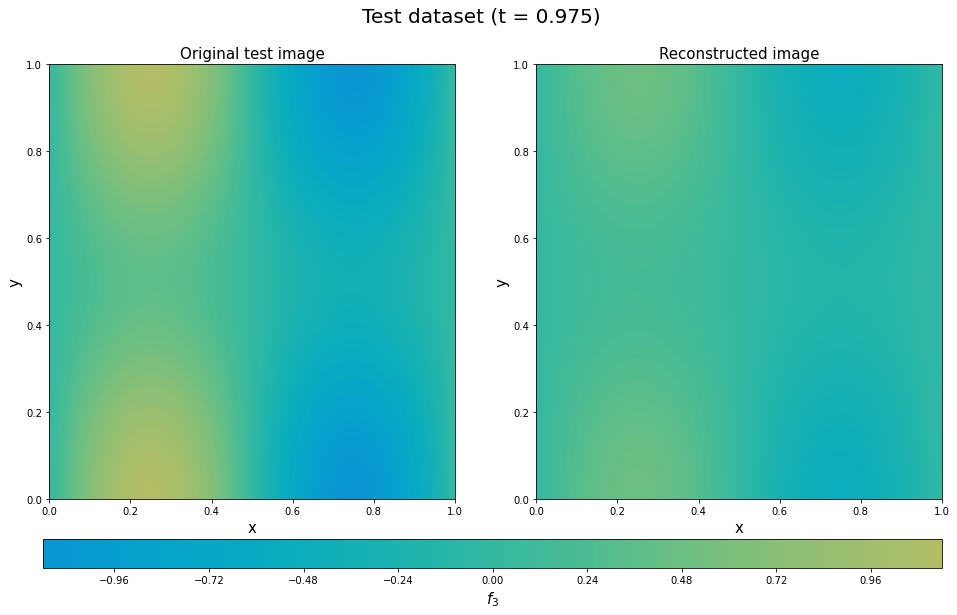

In [126]:
plt.figure(figsize=(16, 8))
y_test3_7_rotate = y_test3[7].T.reshape(101,101)
decoded_rotate3 = decoded_test3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_7_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[39]),fontsize=20)
plt.show()

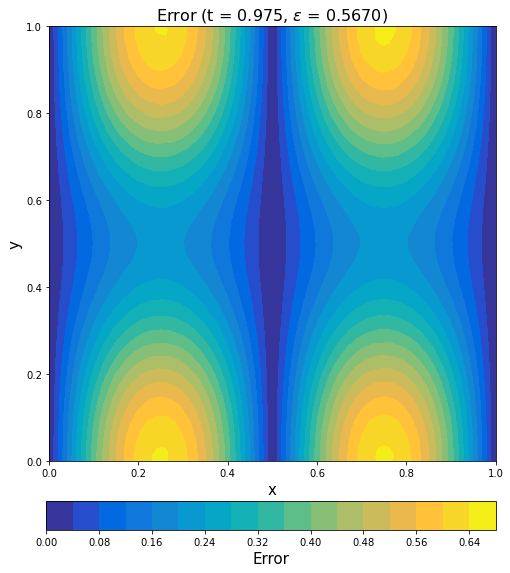

In [127]:
error_test_abs3_rotate7 = error_test_abs3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate7, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.975, $\epsilon$ = %.4f)' %(l2_error_test_list3[7]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()